# Coursework 2: Comparing SKLEARN Clustering Algorithms

In [1]:
#Importing the necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn.cluster as cluster
import sklearn.metrics as metrics
import time
import scipy.cluster.hierarchy as shc
from scipy.spatial.distance import chebyshev, mahalanobis
from sklearn.neighbors import kneighbors_graph
import hdbscan

%matplotlib inline
sns.set_context('poster')
sns.set_color_codes()
plot_kwds = {'alpha' : 0.25, 's' : 80, 'linewidths':0}

In [2]:
#Load the 'cluster_data.npy'
data = np.load('cluster_data.npy')

In [3]:
data

array([[-0.12153499, -0.22876337],
       [-0.22093687, -0.25251088],
       [ 0.1259037 , -0.27314321],
       ...,
       [ 0.50243143, -0.3002958 ],
       [ 0.53822256,  0.19412199],
       [-0.08688887, -0.2092721 ]])

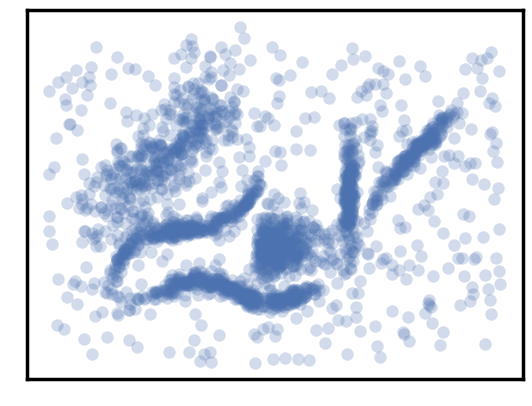

In [4]:
#Scatter plot the 'cluster_data.npy' 
plt.scatter(data.T[0], data.T[1], c='b', **plot_kwds)
frame = plt.gca()
frame.axes.get_xaxis().set_visible(False)
frame.axes.get_yaxis().set_visible(False)


In [5]:
#Establish the plot_clusters(data, algorithm, args, kwds)little utility function to do the clustering and plot the results for us
def plot_clusters(data, algorithm, args, kwds):
    start_time = time.time()
    labels = algorithm(*args, **kwds).fit_predict(data)
    end_time = time.time()
    palette = sns.color_palette('deep', np.unique(labels).max() + 1)
    colors = [palette[x] if x >= 0 else (0.0, 0.0, 0.0) for x in labels]
    plt.scatter(data.T[0], data.T[1], c=colors, **plot_kwds)
    frame = plt.gca()
    frame.axes.get_xaxis().set_visible(False)
    frame.axes.get_yaxis().set_visible(False)
    plt.title('Clusters found by {}'.format(str(algorithm.__name__)), fontsize=24)
    plt.text(-0.54, 0.65, 'Clustering took {:.2f} s'.format(end_time - start_time), fontsize=12)


/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


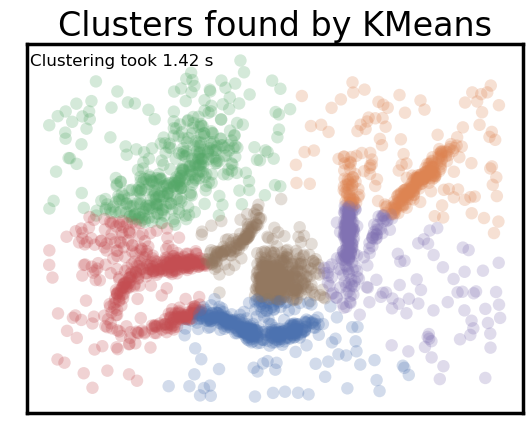

In [6]:
#Plotting an example model
plot_clusters(data, cluster.KMeans, (), {'n_clusters':6})

## 1. K-Means

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


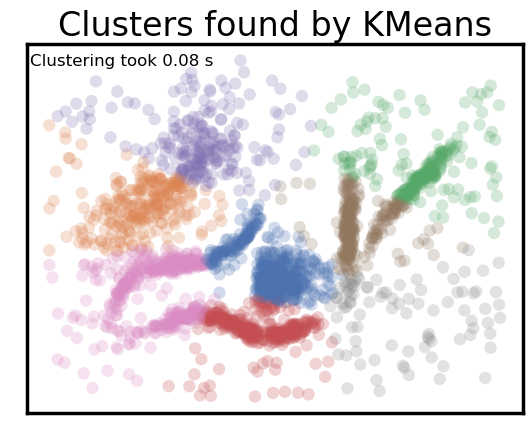

In [7]:
#Plotting the KMeans model with default hyperparameters
plot_clusters(data, cluster.KMeans, (), {})

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress t

Text(0.5, 1.0, 'Different Inertia Values for Different Number of Clusters')

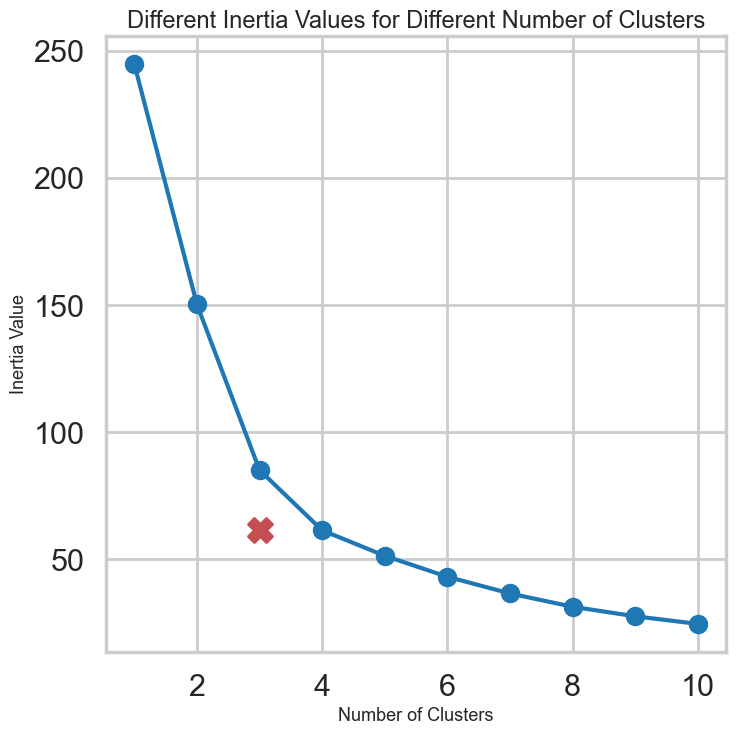

In [8]:
#Finding the best cluster number with elbow method
%matplotlib inline
plt.rcParams['figure.figsize'] = [8,8]
sns.set_style("whitegrid")
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']

inertia_list = []
for num_clusters in range(1, 11):
    kmeans_model = cluster.KMeans(max_iter=1000, n_clusters=num_clusters, init="k-means++")
    kmeans_model.fit(data)
    inertia_list.append(kmeans_model.inertia_)
    
# plot the inertia curve
plt.plot(range(1,11),inertia_list)
plt.scatter(range(1,11),inertia_list)
plt.scatter(3, inertia_list[3], marker="X", s=300, c="r")
plt.xlabel("Number of Clusters", size=13)
plt.ylabel("Inertia Value", size=13)
plt.title("Different Inertia Values for Different Number of Clusters", size=17)

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress t

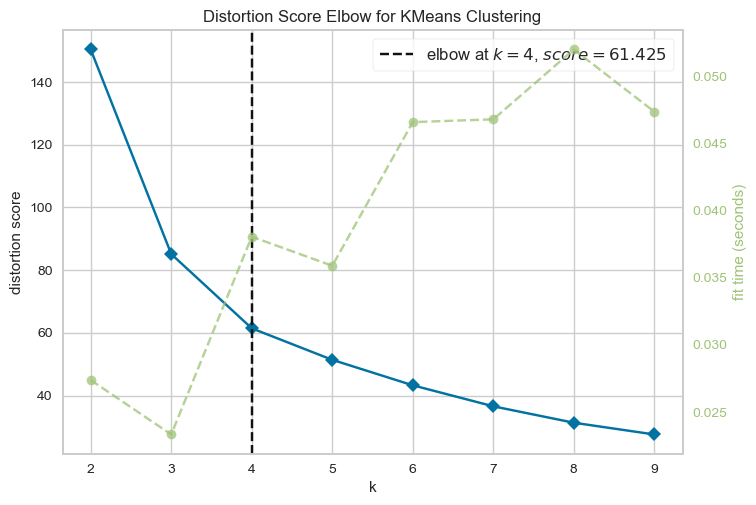

<AxesSubplot: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [9]:
#pip install yellowbrick
from yellowbrick.cluster import KElbowVisualizer
visualizer = KElbowVisualizer(kmeans_model, k=(2,10))
visualizer.fit(data)
visualizer.show()

### 1.1. Finding the best random_state parameter

In [10]:
#Finding the best random_state hyperparameter number with the inertia score
random_state_list = np.arange(1, 1001, 1)
inertia_list = []
silhouette_list = []
for random_state in random_state_list:
    kmeans_model = cluster.KMeans(max_iter=1000, n_clusters=6, random_state=random_state)
    kmeans_model.fit(data)
    inertia_list.append(kmeans_model.inertia_)
    silhouette_avg = metrics.silhouette_score(data, kmeans_model.labels_)
    silhouette_list.append(silhouette_avg)

df = pd.DataFrame(list(zip(silhouette_list, inertia_list)), index =random_state_list, columns =['Silhoutte_Score', 'Inertia_Score'])
df
#print(results[results['Inertia Value'] == results['Inertia Value'].min()])


/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress t

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress t

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress t

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress t

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress t

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress t

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress t

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress t

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress t

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress t

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress t

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress t

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress t

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress t

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress t

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress t

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress t

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress t

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress t

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress t

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress t

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress t

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress t

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress t

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress t

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress t

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress t

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress t

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress t

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress t

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress t

,Silhoutte_Score,Inertia_Score
1,0.404485,43.271279
2,0.408066,43.133707
3,0.408066,43.133707
4,0.404890,43.280602
5,0.404955,43.277321
...,...,...
996,0.404907,43.278052
997,0.408035,43.133096
998,0.408066,43.133707
999,0.408066,43.133707


In [11]:
df[df.Silhoutte_Score==df.Silhoutte_Score.max()]

,Silhoutte_Score,Inertia_Score
959,0.42066,44.03142


In [12]:
df[df.Inertia_Score==df.Inertia_Score.min()]

,Silhoutte_Score,Inertia_Score
739,0.408161,43.132587


/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


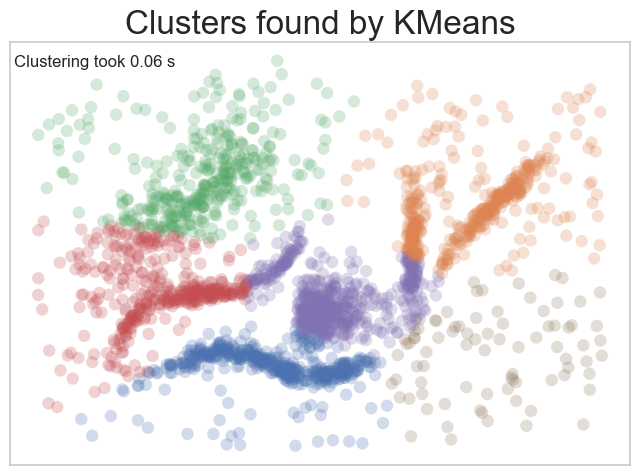

In [13]:
#Plotting the KMeans model with the best parameters
plot_clusters(data, cluster.KMeans, (), {'n_clusters':6, "random_state":959, "max_iter":1000})


/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


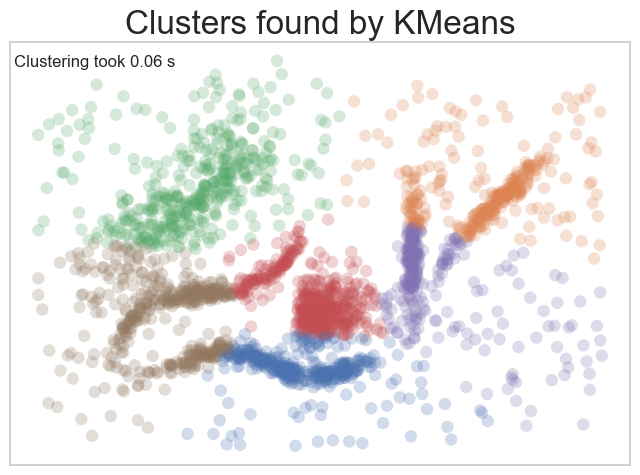

In [14]:
#Plotting the KMeans model with the best parameters
plot_clusters(data, cluster.KMeans, (), {'n_clusters':6, "random_state":739, "max_iter":1000})


### 1.2. Finding the best init and n_init parameter

In [15]:
#Finding the best random_state hyperparameter number with the inertia and silhoutte score
init_list = ["k-means++", "random"]
n_init_list = np.append(["auto"],np.arange(1, 101, 1))
parameters = list()
inertia_list = []
silhouette_list = []
for init in init_list:
    for n_init in n_init_list:
        if n_init not in ["auto"]:
            n_init = int(n_init)
        kmeans_model = cluster.KMeans(random_state=959, max_iter=1000, n_clusters=6, init=init, n_init=n_init)
        kmeans_model.fit(data)
        silhouette_avg = metrics.silhouette_score(data, kmeans_model.labels_)
        used_parameters = "init: " + str(init) + ", " + "n_init: " + str(n_init)
        inertia_list.append(kmeans_model.inertia_)
        silhouette_list.append(silhouette_avg)
        parameters.append(used_parameters)
        

df = pd.DataFrame(list(zip(silhouette_list, inertia_list)), index =parameters, columns =['Silhoutte_Score', 'Inertia_Score'])
df


,Silhoutte_Score,Inertia_Score
"init: k-means++, n_init: auto",0.366599,45.066817
"init: k-means++, n_init: 1",0.366599,45.066817
"init: k-means++, n_init: 2",0.420660,44.031420
"init: k-means++, n_init: 3",0.420660,44.031420
"init: k-means++, n_init: 4",0.420660,44.031420
...,...,...
"init: random, n_init: 96",0.408180,43.132692
"init: random, n_init: 97",0.408180,43.132692
"init: random, n_init: 98",0.408180,43.132692
"init: random, n_init: 99",0.408180,43.132692


In [16]:
df[df.Silhoutte_Score==df.Silhoutte_Score.max()]

,Silhoutte_Score,Inertia_Score
"init: k-means++, n_init: 2",0.42066,44.03142
"init: k-means++, n_init: 3",0.42066,44.03142
"init: k-means++, n_init: 4",0.42066,44.03142
"init: k-means++, n_init: 5",0.42066,44.03142
"init: k-means++, n_init: 6",0.42066,44.03142
"init: k-means++, n_init: 7",0.42066,44.03142
"init: k-means++, n_init: 8",0.42066,44.03142
"init: k-means++, n_init: 9",0.42066,44.03142
"init: k-means++, n_init: 10",0.42066,44.03142
"init: k-means++, n_init: 11",0.42066,44.03142


In [17]:
df[df.Inertia_Score==df.Inertia_Score.min()]

,Silhoutte_Score,Inertia_Score
"init: random, n_init: 30",0.40818,43.132692
"init: random, n_init: 31",0.40818,43.132692
"init: random, n_init: 32",0.40818,43.132692
"init: random, n_init: 33",0.40818,43.132692
"init: random, n_init: 34",0.40818,43.132692
...,...,...
"init: random, n_init: 96",0.40818,43.132692
"init: random, n_init: 97",0.40818,43.132692
"init: random, n_init: 98",0.40818,43.132692
"init: random, n_init: 99",0.40818,43.132692


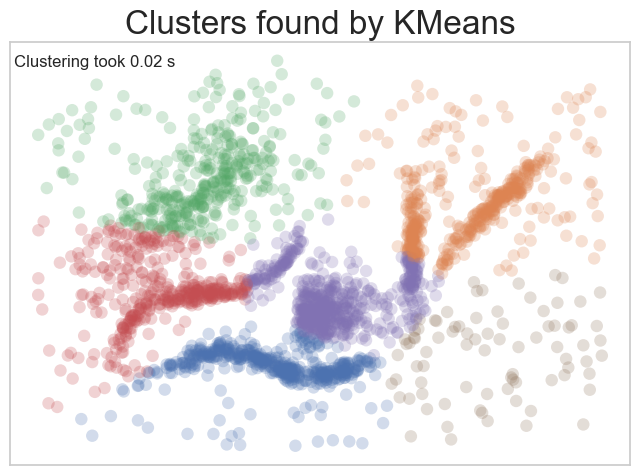

In [18]:
#Plotting the KMeans model with the best parameters
plot_clusters(data, cluster.KMeans, (), {'n_clusters':6, "random_state":959, "max_iter":1000, "init":"k-means++",
                                         "n_init":2})


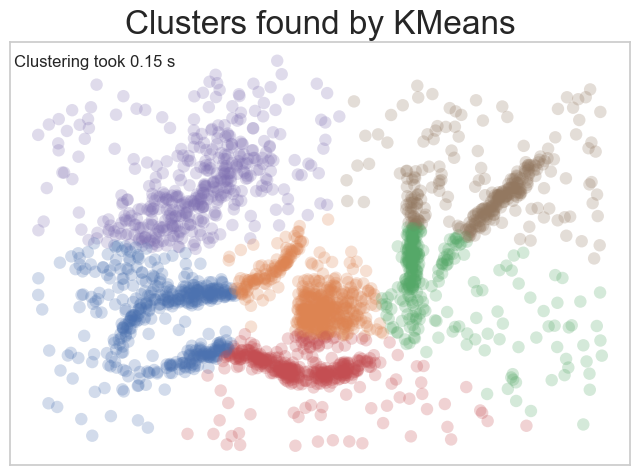

In [19]:
#Plotting the KMeans model with the best parameters
plot_clusters(data, cluster.KMeans, (), {'n_clusters':6, "random_state":959, "max_iter":1000, "init":"random",
                                         "n_init":30})


### 1.3. Finding the best tol, verbose, copy_x, algorithm parameter

In [20]:
#Finding the best hyperparameters with the inertia and silhoutte score
tol_list = [1e-4, 2e-4, 3e-4, 5e-4]
verbose_list = np.arange(0, 11, 1)
copy_x_list = [True, False]
algorithm_list = ["lloyd", "elkan", "auto", "full"]

parameters = list()
inertia_list = []
silhouette_list = []
for tol in tol_list:
    for verbose in verbose_list:
        for copy_x in copy_x_list:
            for algorithm in algorithm_list:
                kmeans_model = cluster.KMeans(random_state=959, max_iter=1000, n_clusters=6, init="k-means++", 
                                              n_init=2, tol=tol, verbose=verbose, copy_x=copy_x, algorithm=algorithm)
                kmeans_model.fit(data)
                silhouette_avg = metrics.silhouette_score(data, kmeans_model.labels_)
                used_parameters = "tol: " + str(tol) + ", " + "verbose: " + str(verbose) + ", " + "copy_x: " + str(copy_x) + ", " + "algorithm: " + str(algorithm)
                inertia_list.append(kmeans_model.inertia_)
                silhouette_list.append(silhouette_avg)
                parameters.append(used_parameters)
        

df = pd.DataFrame(list(zip(silhouette_list, inertia_list)), index =parameters, columns =['Silhoutte_Score', 'Inertia_Score'])
df


/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 55.85704951734981.
Iteration 1, inertia 48.605131782583186.
Iteration 2, inertia 47.50045461604667.
Iteration 3, inertia 46.9991470138661.
Iteration 4, inertia 46.792458810982154.
Iteration 5, inertia 46.67889170274738.
Iteration 6, inertia 46.614074538628834.
Iteration 7, inertia 46.54970767956575.
Iteration 8, inertia 46.467874269926895.
Iteration 9, inertia 46.33177846253723.
Iteration 10, inertia 46.1151895615006.
Iteration 11, inertia 45.82812220057326.
Iteration 12, inertia 45.46515232463195.
Iteration 13, inertia 45.166273841528835.
Iteration 14, inertia 45.08862940591613.
Iteration 15, inertia 45.07500133766043.
Iteration 16, inertia 45.06876999453786.
Converged at iteration 16: center shift 3.976591609478152e-06 within tolerance 5.302402598843445e-06.
Initialization complete
Iteration 0, inertia 54.676820243082226.
Iteration 1, inertia 46.00440320405934.
Iteration 2, inertia 44.62679418299703.
Iteration 3, inertia 44.27407105386497.

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 55.85704951734981.
Iteration 1, inertia 48.60513178258317.
Iteration 2, inertia 47.50045461604667.
Iteration 3, inertia 46.99914701386609.
Iteration 4, inertia 46.792458810982154.
Iteration 5, inertia 46.67889170274738.
Iteration 6, inertia 46.614074538628834.
Iteration 7, inertia 46.54970767956575.
Iteration 8, inertia 46.467874269926895.
Iteration 9, inertia 46.33177846253722.
Iteration 10, inertia 46.11518956150059.
Iteration 11, inertia 45.82812220057326.
Iteration 12, inertia 45.46515232463196.
Iteration 13, inertia 45.16627384152882.
Iteration 14, inertia 45.08862940591613.
Iteration 15, inertia 45.07500133766043.
Iteration 16, inertia 45.06876999453786.
Converged at iteration 16: center shift 3.976591609478222e-06 within tolerance 5.302402598843445e-06.
Initialization complete
Iteration 0, inertia 54.676820243082226.
Iteration 1, inertia 46.00440320405934.
Iteration 2, inertia 44.62679418299703.
Iteration 3, inertia 44.27407105386497.

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 55.85704951734981.
Iteration 1, inertia 48.60513178258318.
Iteration 2, inertia 47.50045461604667.
Iteration 3, inertia 46.99914701386609.
Iteration 4, inertia 46.792458810982154.
Iteration 5, inertia 46.67889170274738.
Iteration 6, inertia 46.614074538628834.
Iteration 7, inertia 46.54970767956575.
Iteration 8, inertia 46.467874269926895.
Iteration 9, inertia 46.33177846253723.
Iteration 10, inertia 46.11518956150059.
Iteration 11, inertia 45.82812220057326.
Iteration 12, inertia 45.465152324631944.
Iteration 13, inertia 45.16627384152883.
Iteration 14, inertia 45.08862940591613.
Iteration 15, inertia 45.07500133766043.
Iteration 16, inertia 45.06876999453786.
Converged at iteration 16: center shift 3.976591609478206e-06 within tolerance 5.302402598843445e-06.
Initialization complete
Iteration 0, inertia 54.676820243082226.
Iteration 1, inertia 46.00440320405934.
Iteration 2, inertia 44.62679418299703.
Iteration 3, inertia 44.27407105386497

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 55.85704951734981.
Iteration 1, inertia 48.605131782583186.
Iteration 2, inertia 47.50045461604667.
Iteration 3, inertia 46.99914701386609.
Iteration 4, inertia 46.792458810982154.
Iteration 5, inertia 46.67889170274738.
Iteration 6, inertia 46.614074538628834.
Iteration 7, inertia 46.549707679565756.
Iteration 8, inertia 46.467874269926895.
Iteration 9, inertia 46.33177846253723.
Iteration 10, inertia 46.11518956150059.
Iteration 11, inertia 45.82812220057326.
Iteration 12, inertia 45.46515232463196.
Iteration 13, inertia 45.16627384152883.
Iteration 14, inertia 45.08862940591613.
Iteration 15, inertia 45.075001337660424.
Iteration 16, inertia 45.06876999453786.
Converged at iteration 16: center shift 3.976591609478282e-06 within tolerance 5.302402598843445e-06.
Initialization complete
Iteration 0, inertia 54.676820243082226.
Iteration 1, inertia 46.00440320405934.
Iteration 2, inertia 44.62679418299703.
Iteration 3, inertia 44.274071053864

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Iteration 4, inertia 44.124551984706265.
Iteration 5, inertia 44.07875294471795.
Iteration 6, inertia 44.051015168635516.
Iteration 7, inertia 44.04253539981445.
Iteration 8, inertia 44.037453701315826.
Converged at iteration 8: center shift 4.289175093614326e-06 within tolerance 5.302402598843445e-06.
Initialization complete
Iteration 0, inertia 55.85704951734981.
Iteration 1, inertia 48.60513178258318.
Iteration 2, inertia 47.50045461604667.
Iteration 3, inertia 46.99914701386609.
Iteration 4, inertia 46.792458810982154.
Iteration 5, inertia 46.67889170274738.
Iteration 6, inertia 46.61407453862883.
Iteration 7, inertia 46.54970767956575.
Iteration 8, inertia 46.467874269926895.
Iteration 9, inertia 46.33177846253723.
Iteration 10, inertia 46.11518956150059.
Iteration 11, inertia 45.82812220057326.
Iteration 12, inertia 45.465152324631944.
Iteration 13, inertia 45.16627384152882.
Iteration 14, inertia 45.088629405916116.
Iteration 15, inertia 45.07500133766043.
Iteration 16, inertia 

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 55.85704951734981.
Iteration 1, inertia 48.60513178258317.
Iteration 2, inertia 47.50045461604667.
Iteration 3, inertia 46.99914701386609.
Iteration 4, inertia 46.792458810982154.
Iteration 5, inertia 46.67889170274738.
Iteration 6, inertia 46.614074538628834.
Iteration 7, inertia 46.54970767956575.
Iteration 8, inertia 46.467874269926895.
Iteration 9, inertia 46.33177846253722.
Iteration 10, inertia 46.11518956150059.
Iteration 11, inertia 45.82812220057326.
Iteration 12, inertia 45.465152324631944.
Iteration 13, inertia 45.16627384152882.
Iteration 14, inertia 45.088629405916116.
Iteration 15, inertia 45.075001337660424.
Iteration 16, inertia 45.06876999453786.
Converged at iteration 16: center shift 3.9765916094780575e-06 within tolerance 5.302402598843445e-06.
Initialization complete
Iteration 0, inertia 54.676820243082226.
Iteration 1, inertia 46.00440320405933.
Iteration 2, inertia 44.62679418299703.
Iteration 3, inertia 44.27407105386

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 55.85704951734981.
Iteration 1, inertia 48.60513178258318.
Iteration 2, inertia 47.50045461604667.
Iteration 3, inertia 46.99914701386609.
Iteration 4, inertia 46.792458810982154.
Iteration 5, inertia 46.67889170274738.
Iteration 6, inertia 46.614074538628834.
Iteration 7, inertia 46.54970767956574.
Iteration 8, inertia 46.467874269926895.
Iteration 9, inertia 46.33177846253723.
Iteration 10, inertia 46.1151895615006.
Iteration 11, inertia 45.82812220057326.
Iteration 12, inertia 45.46515232463195.
Iteration 13, inertia 45.16627384152883.
Iteration 14, inertia 45.08862940591612.
Iteration 15, inertia 45.075001337660424.
Iteration 16, inertia 45.06876999453786.
Converged at iteration 16: center shift 3.976591609478236e-06 within tolerance 5.302402598843445e-06.
Initialization complete
Iteration 0, inertia 54.676820243082226.
Iteration 1, inertia 46.00440320405934.
Iteration 2, inertia 44.62679418299703.
Iteration 3, inertia 44.27407105386497.

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 54.676820243082226.
Iteration 1, inertia 46.00440320405933.
Iteration 2, inertia 44.62679418299704.
Iteration 3, inertia 44.27407105386497.
Iteration 4, inertia 44.12455198470626.
Iteration 5, inertia 44.07875294471795.
Iteration 6, inertia 44.051015168635516.
Iteration 7, inertia 44.04253539981445.
Iteration 8, inertia 44.037453701315826.
Converged at iteration 8: center shift 4.289175093614326e-06 within tolerance 5.302402598843445e-06.
Initialization complete
Iteration 0, inertia 55.85704951734981.
Iteration 1, inertia 48.60513178258318.
Iteration 2, inertia 47.50045461604667.
Iteration 3, inertia 46.99914701386609.
Iteration 4, inertia 46.792458810982154.
Iteration 5, inertia 46.67889170274738.
Iteration 6, inertia 46.614074538628834.
Iteration 7, inertia 46.54970767956574.
Iteration 8, inertia 46.467874269926895.
Iteration 9, inertia 46.33177846253723.
Iteration 10, inertia 46.11518956150059.
Iteration 11, inertia 45.82812220057326.
Ite

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 55.85704951734981.
Iteration 1, inertia 48.605131782583186.
Iteration 2, inertia 47.50045461604667.
Iteration 3, inertia 46.99914701386609.
Iteration 4, inertia 46.792458810982154.
Iteration 5, inertia 46.67889170274738.
Iteration 6, inertia 46.614074538628834.
Iteration 7, inertia 46.54970767956575.
Iteration 8, inertia 46.467874269926895.
Iteration 9, inertia 46.33177846253723.
Iteration 10, inertia 46.1151895615006.
Iteration 11, inertia 45.828122200573254.
Iteration 12, inertia 45.465152324631944.
Iteration 13, inertia 45.16627384152883.
Iteration 14, inertia 45.088629405916116.
Iteration 15, inertia 45.07500133766043.
Iteration 16, inertia 45.06876999453786.
Converged at iteration 16: center shift 3.976591609478168e-06 within tolerance 5.302402598843445e-06.
Initialization complete
Iteration 0, inertia 54.676820243082226.
Iteration 1, inertia 46.00440320405934.
Iteration 2, inertia 44.62679418299703.
Iteration 3, inertia 44.274071053864

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 55.85704951734981.
Iteration 1, inertia 48.60513178258318.
Iteration 2, inertia 47.50045461604667.
Iteration 3, inertia 46.99914701386609.
Iteration 4, inertia 46.792458810982154.
Iteration 5, inertia 46.67889170274738.
Iteration 6, inertia 46.614074538628834.
Iteration 7, inertia 46.54970767956575.
Iteration 8, inertia 46.467874269926895.
Iteration 9, inertia 46.33177846253723.
Iteration 10, inertia 46.1151895615006.
Iteration 11, inertia 45.82812220057326.
Iteration 12, inertia 45.46515232463195.
Iteration 13, inertia 45.166273841528835.
Iteration 14, inertia 45.08862940591613.
Iteration 15, inertia 45.07500133766043.
Iteration 16, inertia 45.06876999453786.
Converged at iteration 16: center shift 3.976591609478208e-06 within tolerance 5.302402598843445e-06.
Initialization complete
Iteration 0, inertia 54.676820243082226.
Iteration 1, inertia 46.00440320405934.
Iteration 2, inertia 44.62679418299703.
Iteration 3, inertia 44.27407105386497.

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 55.85704951734981.
Iteration 1, inertia 48.605131782583186.
Iteration 2, inertia 47.50045461604667.
Iteration 3, inertia 46.99914701386609.
Iteration 4, inertia 46.792458810982154.
Iteration 5, inertia 46.67889170274738.
Iteration 6, inertia 46.61407453862883.
Iteration 7, inertia 46.54970767956574.
Iteration 8, inertia 46.467874269926895.
Iteration 9, inertia 46.33177846253722.
Iteration 10, inertia 46.11518956150059.
Iteration 11, inertia 45.82812220057326.
Iteration 12, inertia 45.465152324631944.
Iteration 13, inertia 45.166273841528835.
Iteration 14, inertia 45.08862940591613.
Iteration 15, inertia 45.07500133766043.
Iteration 16, inertia 45.06876999453786.
Converged at iteration 16: center shift 3.976591609478309e-06 within tolerance 5.302402598843445e-06.
Initialization complete
Iteration 0, inertia 54.676820243082226.
Iteration 1, inertia 46.00440320405934.
Iteration 2, inertia 44.62679418299703.
Iteration 3, inertia 44.2740710538649

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 55.85704951734981.
Iteration 1, inertia 48.60513178258317.
Iteration 2, inertia 47.50045461604667.
Iteration 3, inertia 46.99914701386609.
Iteration 4, inertia 46.792458810982154.
Iteration 5, inertia 46.67889170274738.
Iteration 6, inertia 46.614074538628834.
Iteration 7, inertia 46.54970767956574.
Iteration 8, inertia 46.467874269926895.
Iteration 9, inertia 46.33177846253723.
Iteration 10, inertia 46.11518956150059.
Iteration 11, inertia 45.82812220057326.
Iteration 12, inertia 45.465152324631944.
Iteration 13, inertia 45.16627384152882.
Iteration 14, inertia 45.088629405916116.
Iteration 15, inertia 45.07500133766043.
Iteration 16, inertia 45.06876999453786.
Converged at iteration 16: center shift 3.976591609478119e-06 within tolerance 5.302402598843445e-06.
Initialization complete
Iteration 0, inertia 54.676820243082226.
Iteration 1, inertia 46.00440320405933.
Iteration 2, inertia 44.62679418299703.
Iteration 3, inertia 44.2740710538649

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 55.85704951734981.
Iteration 1, inertia 48.60513178258317.
Iteration 2, inertia 47.50045461604667.
Iteration 3, inertia 46.99914701386609.
Iteration 4, inertia 46.792458810982154.
Iteration 5, inertia 46.67889170274738.
Iteration 6, inertia 46.614074538628834.
Iteration 7, inertia 46.54970767956575.
Iteration 8, inertia 46.467874269926895.
Iteration 9, inertia 46.33177846253723.
Iteration 10, inertia 46.11518956150059.
Iteration 11, inertia 45.82812220057326.
Iteration 12, inertia 45.465152324631944.
Iteration 13, inertia 45.16627384152883.
Iteration 14, inertia 45.08862940591613.
Iteration 15, inertia 45.07500133766043.
Iteration 16, inertia 45.06876999453786.
Converged at iteration 16: center shift 3.97659160947819e-06 within tolerance 5.302402598843445e-06.
Initialization complete
Iteration 0, inertia 54.676820243082226.
Iteration 1, inertia 46.00440320405934.
Iteration 2, inertia 44.62679418299703.
Iteration 3, inertia 44.27407105386497.

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 55.85704951734981.
Iteration 1, inertia 48.605131782583186.
Iteration 2, inertia 47.50045461604667.
Iteration 3, inertia 46.99914701386609.
Iteration 4, inertia 46.792458810982154.
Iteration 5, inertia 46.67889170274738.
Iteration 6, inertia 46.61407453862883.
Iteration 7, inertia 46.54970767956575.
Iteration 8, inertia 46.467874269926895.
Iteration 9, inertia 46.33177846253723.
Iteration 10, inertia 46.11518956150059.
Iteration 11, inertia 45.828122200573254.
Iteration 12, inertia 45.46515232463195.
Iteration 13, inertia 45.16627384152882.
Iteration 14, inertia 45.08862940591613.
Iteration 15, inertia 45.07500133766043.
Iteration 16, inertia 45.06876999453786.
Converged at iteration 16: center shift 3.976591609478193e-06 within tolerance 5.302402598843445e-06.
Initialization complete
Iteration 0, inertia 54.676820243082226.
Iteration 1, inertia 46.00440320405934.
Iteration 2, inertia 44.62679418299704.
Iteration 3, inertia 44.27407105386497

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 55.85704951734981.
Iteration 1, inertia 48.605131782583186.
Iteration 2, inertia 47.50045461604667.
Iteration 3, inertia 46.99914701386609.
Iteration 4, inertia 46.792458810982154.
Iteration 5, inertia 46.67889170274738.
Iteration 6, inertia 46.614074538628834.
Iteration 7, inertia 46.54970767956575.
Iteration 8, inertia 46.467874269926895.
Iteration 9, inertia 46.33177846253722.
Iteration 10, inertia 46.11518956150059.
Iteration 11, inertia 45.82812220057326.
Iteration 12, inertia 45.46515232463195.
Iteration 13, inertia 45.166273841528835.
Iteration 14, inertia 45.08862940591613.
Iteration 15, inertia 45.07500133766043.
Iteration 16, inertia 45.06876999453786.
Converged at iteration 16: center shift 3.976591609478119e-06 within tolerance 5.302402598843445e-06.
Initialization complete
Iteration 0, inertia 54.676820243082226.
Iteration 1, inertia 46.00440320405934.
Iteration 2, inertia 44.62679418299704.
Iteration 3, inertia 44.2740710538649

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 55.85704951734981
Iteration 1, inertia 48.60513178258318
Iteration 2, inertia 47.50045461604667
Iteration 3, inertia 46.99914701386609
Iteration 4, inertia 46.792458810982154
Iteration 5, inertia 46.67889170274738
Iteration 6, inertia 46.614074538628834
Iteration 7, inertia 46.54970767956575
Iteration 8, inertia 46.467874269926895
Iteration 9, inertia 46.33177846253722
Iteration 10, inertia 46.11518956150059
Iteration 11, inertia 45.82812220057326
Iteration 12, inertia 45.465152324631944
Iteration 13, inertia 45.16627384152882
Iteration 14, inertia 45.088629405916116
Iteration 15, inertia 45.075001337660424
Iteration 16, inertia 45.06876999453786
Converged at iteration 16: center shift 3.976591609478161e-06 within tolerance 5.302402598843445e-06.
Initialization complete
Iteration 0, inertia 54.676820243082226
Iteration 1, inertia 46.00440320405934
Iteration 2, inertia 44.62679418299703
Iteration 3, inertia 44.27407105386497
Iteration 4, iner

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 55.85704951734981
Iteration 1, inertia 48.60513178258317
Iteration 2, inertia 47.50045461604667
Iteration 3, inertia 46.99914701386609
Iteration 4, inertia 46.792458810982154
Iteration 5, inertia 46.67889170274738
Iteration 6, inertia 46.614074538628834
Iteration 7, inertia 46.54970767956575
Iteration 8, inertia 46.467874269926895
Iteration 9, inertia 46.33177846253723
Iteration 10, inertia 46.11518956150059
Iteration 11, inertia 45.828122200573254
Iteration 12, inertia 45.46515232463195
Iteration 13, inertia 45.166273841528835
Iteration 14, inertia 45.08862940591613
Iteration 15, inertia 45.07500133766043
Iteration 16, inertia 45.06876999453786
Converged at iteration 16: center shift 3.976591609478256e-06 within tolerance 5.302402598843445e-06.
Initialization complete
Iteration 0, inertia 54.676820243082226
Iteration 1, inertia 46.00440320405934
Iteration 2, inertia 44.62679418299703
Iteration 3, inertia 44.27407105386497
Iteration 4, inert

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 55.85704951734981
Iteration 1, inertia 48.605131782583186
Iteration 2, inertia 47.50045461604667
Iteration 3, inertia 46.9991470138661
Iteration 4, inertia 46.792458810982154
Iteration 5, inertia 46.67889170274738
Iteration 6, inertia 46.614074538628834
Iteration 7, inertia 46.54970767956575
Iteration 8, inertia 46.467874269926895
Iteration 9, inertia 46.33177846253723
Iteration 10, inertia 46.11518956150059
Iteration 11, inertia 45.82812220057326
Iteration 12, inertia 45.46515232463195
Iteration 13, inertia 45.16627384152883
Iteration 14, inertia 45.08862940591613
Iteration 15, inertia 45.075001337660424
Iteration 16, inertia 45.06876999453786
Converged at iteration 16: center shift 3.976591609478197e-06 within tolerance 5.302402598843445e-06.
Initialization complete
Iteration 0, inertia 54.676820243082226
Iteration 1, inertia 46.00440320405934
Iteration 2, inertia 44.62679418299703
Iteration 3, inertia 44.27407105386497
Iteration 4, inerti

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 55.85704951734981
Iteration 1, inertia 48.60513178258318
Iteration 2, inertia 47.50045461604667
Iteration 3, inertia 46.99914701386609
Iteration 4, inertia 46.792458810982154
Iteration 5, inertia 46.67889170274738
Iteration 6, inertia 46.614074538628834
Iteration 7, inertia 46.54970767956575
Iteration 8, inertia 46.467874269926895
Iteration 9, inertia 46.33177846253723
Iteration 10, inertia 46.11518956150059
Iteration 11, inertia 45.82812220057326
Iteration 12, inertia 45.465152324631944
Iteration 13, inertia 45.16627384152882
Iteration 14, inertia 45.08862940591613
Iteration 15, inertia 45.075001337660424
Iteration 16, inertia 45.06876999453786
Converged at iteration 16: center shift 3.976591609478102e-06 within tolerance 5.302402598843445e-06.
Initialization complete
Iteration 0, inertia 54.676820243082226
Iteration 1, inertia 46.00440320405934
Iteration 2, inertia 44.62679418299703
Iteration 3, inertia 44.27407105386497
Iteration 4, inert

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 55.85704951734981
Iteration 1, inertia 48.60513178258318
Iteration 2, inertia 47.50045461604667
Iteration 3, inertia 46.99914701386609
Iteration 4, inertia 46.792458810982154
Iteration 5, inertia 46.67889170274738
Iteration 6, inertia 46.614074538628834
Iteration 7, inertia 46.54970767956575
Iteration 8, inertia 46.467874269926895
Iteration 9, inertia 46.33177846253723
Iteration 10, inertia 46.11518956150059
Iteration 11, inertia 45.82812220057326
Iteration 12, inertia 45.465152324631944
Iteration 13, inertia 45.16627384152882
Iteration 14, inertia 45.08862940591613
Iteration 15, inertia 45.07500133766043
Iteration 16, inertia 45.06876999453786
Converged at iteration 16: center shift 3.976591609478118e-06 within tolerance 5.302402598843445e-06.
Initialization complete
Iteration 0, inertia 54.676820243082226
Iteration 1, inertia 46.00440320405934
Iteration 2, inertia 44.62679418299703
Iteration 3, inertia 44.27407105386497
Iteration 4, inerti

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be r

Initialization complete
Iteration 0, inertia 55.85704951734981.
Iteration 1, inertia 48.60513178258318.
Iteration 2, inertia 47.50045461604667.
Iteration 3, inertia 46.99914701386609.
Iteration 4, inertia 46.792458810982154.
Iteration 5, inertia 46.67889170274738.
Iteration 6, inertia 46.614074538628834.
Iteration 7, inertia 46.54970767956575.
Iteration 8, inertia 46.467874269926895.
Iteration 9, inertia 46.33177846253723.
Iteration 10, inertia 46.11518956150059.
Iteration 11, inertia 45.82812220057326.
Iteration 12, inertia 45.465152324631944.
Iteration 13, inertia 45.16627384152882.
Iteration 14, inertia 45.08862940591613.
Iteration 15, inertia 45.07500133766043.
Iteration 16, inertia 45.06876999453786.
Converged at iteration 16: center shift 3.976591609478248e-06 within tolerance 1.060480519768689e-05.
Initialization complete
Iteration 0, inertia 54.676820243082226.
Iteration 1, inertia 46.00440320405934.
Iteration 2, inertia 44.62679418299703.
Iteration 3, inertia 44.27407105386497

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 55.85704951734981.
Iteration 1, inertia 48.60513178258318.
Iteration 2, inertia 47.50045461604667.
Iteration 3, inertia 46.99914701386609.
Iteration 4, inertia 46.792458810982154.
Iteration 5, inertia 46.67889170274738.
Iteration 6, inertia 46.614074538628834.
Iteration 7, inertia 46.54970767956575.
Iteration 8, inertia 46.467874269926895.
Iteration 9, inertia 46.33177846253722.
Iteration 10, inertia 46.11518956150059.
Iteration 11, inertia 45.82812220057326.
Iteration 12, inertia 45.465152324631944.
Iteration 13, inertia 45.166273841528835.
Iteration 14, inertia 45.08862940591613.
Iteration 15, inertia 45.07500133766043.
Iteration 16, inertia 45.06876999453786.
Converged at iteration 16: center shift 3.976591609478224e-06 within tolerance 1.060480519768689e-05.
Initialization complete
Iteration 0, inertia 54.676820243082226.
Iteration 1, inertia 46.00440320405933.
Iteration 2, inertia 44.62679418299703.
Iteration 3, inertia 44.2740710538649

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 55.85704951734981.
Iteration 1, inertia 48.60513178258318.
Iteration 2, inertia 47.50045461604667.
Iteration 3, inertia 46.99914701386609.
Iteration 4, inertia 46.792458810982154.
Iteration 5, inertia 46.67889170274738.
Iteration 6, inertia 46.61407453862883.
Iteration 7, inertia 46.54970767956575.
Iteration 8, inertia 46.467874269926895.
Iteration 9, inertia 46.33177846253723.
Iteration 10, inertia 46.11518956150059.
Iteration 11, inertia 45.828122200573254.
Iteration 12, inertia 45.46515232463195.
Iteration 13, inertia 45.166273841528835.
Iteration 14, inertia 45.08862940591613.
Iteration 15, inertia 45.07500133766043.
Iteration 16, inertia 45.06876999453786.
Converged at iteration 16: center shift 3.976591609478164e-06 within tolerance 1.060480519768689e-05.
Initialization complete
Iteration 0, inertia 54.676820243082226.
Iteration 1, inertia 46.004403204059344.
Iteration 2, inertia 44.62679418299703.
Iteration 3, inertia 44.2740710538649

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 55.85704951734981.
Iteration 1, inertia 48.60513178258318.
Iteration 2, inertia 47.50045461604667.
Iteration 3, inertia 46.99914701386609.
Iteration 4, inertia 46.792458810982154.
Iteration 5, inertia 46.67889170274738.
Iteration 6, inertia 46.614074538628834.
Iteration 7, inertia 46.54970767956575.
Iteration 8, inertia 46.467874269926895.
Iteration 9, inertia 46.33177846253723.
Iteration 10, inertia 46.1151895615006.
Iteration 11, inertia 45.828122200573254.
Iteration 12, inertia 45.46515232463195.
Iteration 13, inertia 45.16627384152883.
Iteration 14, inertia 45.08862940591613.
Iteration 15, inertia 45.07500133766043.
Iteration 16, inertia 45.06876999453786.
Converged at iteration 16: center shift 3.976591609478224e-06 within tolerance 1.060480519768689e-05.
Initialization complete
Iteration 0, inertia 54.676820243082226.
Iteration 1, inertia 46.004403204059344.
Iteration 2, inertia 44.62679418299703.
Iteration 3, inertia 44.27407105386497

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 55.85704951734981.
Iteration 1, inertia 48.60513178258318.
Iteration 2, inertia 47.50045461604667.
Iteration 3, inertia 46.99914701386609.
Iteration 4, inertia 46.792458810982154.
Iteration 5, inertia 46.67889170274738.
Iteration 6, inertia 46.61407453862883.
Iteration 7, inertia 46.54970767956575.
Iteration 8, inertia 46.467874269926895.
Iteration 9, inertia 46.33177846253722.
Iteration 10, inertia 46.11518956150059.
Iteration 11, inertia 45.82812220057326.
Iteration 12, inertia 45.46515232463196.
Iteration 13, inertia 45.16627384152882.
Iteration 14, inertia 45.08862940591613.
Iteration 15, inertia 45.075001337660424.
Iteration 16, inertia 45.06876999453786.
Converged at iteration 16: center shift 3.976591609478206e-06 within tolerance 1.060480519768689e-05.
Initialization complete
Iteration 0, inertia 54.676820243082226.
Iteration 1, inertia 46.00440320405934.
Iteration 2, inertia 44.62679418299703.
Iteration 3, inertia 44.27407105386497.

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 55.85704951734981.
Iteration 1, inertia 48.60513178258318.
Iteration 2, inertia 47.50045461604667.
Iteration 3, inertia 46.99914701386609.
Iteration 4, inertia 46.792458810982154.
Iteration 5, inertia 46.67889170274738.
Iteration 6, inertia 46.61407453862883.
Iteration 7, inertia 46.54970767956574.
Iteration 8, inertia 46.467874269926895.
Iteration 9, inertia 46.33177846253722.
Iteration 10, inertia 46.11518956150059.
Iteration 11, inertia 45.82812220057326.
Iteration 12, inertia 45.465152324631944.
Iteration 13, inertia 45.16627384152882.
Iteration 14, inertia 45.088629405916116.
Iteration 15, inertia 45.07500133766043.
Iteration 16, inertia 45.06876999453786.
Converged at iteration 16: center shift 3.976591609478122e-06 within tolerance 1.060480519768689e-05.
Initialization complete
Iteration 0, inertia 54.676820243082226.
Iteration 1, inertia 46.00440320405934.
Iteration 2, inertia 44.62679418299704.
Iteration 3, inertia 44.27407105386497

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 55.85704951734981.
Iteration 1, inertia 48.60513178258317.
Iteration 2, inertia 47.50045461604667.
Iteration 3, inertia 46.99914701386609.
Iteration 4, inertia 46.792458810982154.
Iteration 5, inertia 46.67889170274738.
Iteration 6, inertia 46.614074538628834.
Iteration 7, inertia 46.54970767956575.
Iteration 8, inertia 46.467874269926895.
Iteration 9, inertia 46.33177846253723.
Iteration 10, inertia 46.1151895615006.
Iteration 11, inertia 45.82812220057326.
Iteration 12, inertia 45.46515232463195.
Iteration 13, inertia 45.166273841528835.
Iteration 14, inertia 45.08862940591613.
Iteration 15, inertia 45.07500133766043.
Iteration 16, inertia 45.06876999453786.
Converged at iteration 16: center shift 3.976591609478102e-06 within tolerance 1.060480519768689e-05.
Initialization complete
Iteration 0, inertia 54.676820243082226.
Iteration 1, inertia 46.00440320405934.
Iteration 2, inertia 44.62679418299703.
Iteration 3, inertia 44.27407105386497.

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 55.85704951734981.
Iteration 1, inertia 48.60513178258318.
Iteration 2, inertia 47.50045461604667.
Iteration 3, inertia 46.99914701386609.
Iteration 4, inertia 46.792458810982154.
Iteration 5, inertia 46.67889170274738.
Iteration 6, inertia 46.614074538628834.
Iteration 7, inertia 46.54970767956575.
Iteration 8, inertia 46.467874269926895.
Iteration 9, inertia 46.33177846253722.
Iteration 10, inertia 46.1151895615006.
Iteration 11, inertia 45.82812220057326.
Iteration 12, inertia 45.465152324631944.
Iteration 13, inertia 45.16627384152882.
Iteration 14, inertia 45.08862940591613.
Iteration 15, inertia 45.07500133766043.
Iteration 16, inertia 45.06876999453786.
Converged at iteration 16: center shift 3.976591609478332e-06 within tolerance 1.060480519768689e-05.
Initialization complete
Iteration 0, inertia 54.676820243082226.
Iteration 1, inertia 46.00440320405934.
Iteration 2, inertia 44.62679418299703.
Iteration 3, inertia 44.27407105386497.

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 55.85704951734981.
Iteration 1, inertia 48.60513178258317.
Iteration 2, inertia 47.50045461604667.
Iteration 3, inertia 46.99914701386609.
Iteration 4, inertia 46.792458810982154.
Iteration 5, inertia 46.67889170274738.
Iteration 6, inertia 46.614074538628834.
Iteration 7, inertia 46.54970767956575.
Iteration 8, inertia 46.467874269926895.
Iteration 9, inertia 46.33177846253722.
Iteration 10, inertia 46.11518956150059.
Iteration 11, inertia 45.82812220057326.
Iteration 12, inertia 45.46515232463195.
Iteration 13, inertia 45.166273841528835.
Iteration 14, inertia 45.08862940591612.
Iteration 15, inertia 45.075001337660424.
Iteration 16, inertia 45.06876999453786.
Converged at iteration 16: center shift 3.976591609478154e-06 within tolerance 1.060480519768689e-05.
Initialization complete
Iteration 0, inertia 54.676820243082226.
Iteration 1, inertia 46.00440320405934.
Iteration 2, inertia 44.62679418299703.
Iteration 3, inertia 44.2740710538649

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 55.85704951734981.
Iteration 1, inertia 48.60513178258317.
Iteration 2, inertia 47.50045461604667.
Iteration 3, inertia 46.99914701386609.
Iteration 4, inertia 46.792458810982154.
Iteration 5, inertia 46.67889170274738.
Iteration 6, inertia 46.614074538628834.
Iteration 7, inertia 46.54970767956574.
Iteration 8, inertia 46.467874269926895.
Iteration 9, inertia 46.33177846253723.
Iteration 10, inertia 46.1151895615006.
Iteration 11, inertia 45.82812220057326.
Iteration 12, inertia 45.465152324631944.
Iteration 13, inertia 45.16627384152882.
Iteration 14, inertia 45.08862940591613.
Iteration 15, inertia 45.07500133766043.
Iteration 16, inertia 45.06876999453786.
Converged at iteration 16: center shift 3.976591609478248e-06 within tolerance 1.060480519768689e-05.
Initialization complete
Iteration 0, inertia 54.676820243082226.
Iteration 1, inertia 46.004403204059344.
Iteration 2, inertia 44.62679418299704.
Iteration 3, inertia 44.27407105386497

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 55.85704951734981.
Iteration 1, inertia 48.60513178258318.
Iteration 2, inertia 47.50045461604667.
Iteration 3, inertia 46.99914701386609.
Iteration 4, inertia 46.792458810982154.
Iteration 5, inertia 46.67889170274738.
Iteration 6, inertia 46.614074538628834.
Iteration 7, inertia 46.54970767956574.
Iteration 8, inertia 46.467874269926895.
Iteration 9, inertia 46.33177846253723.
Iteration 10, inertia 46.11518956150059.
Iteration 11, inertia 45.828122200573254.
Iteration 12, inertia 45.465152324631944.
Iteration 13, inertia 45.16627384152882.
Iteration 14, inertia 45.08862940591613.
Iteration 15, inertia 45.075001337660424.
Iteration 16, inertia 45.06876999453786.
Converged at iteration 16: center shift 3.976591609478301e-06 within tolerance 1.060480519768689e-05.
Initialization complete
Iteration 0, inertia 54.676820243082226.
Iteration 1, inertia 46.00440320405933.
Iteration 2, inertia 44.62679418299703.
Iteration 3, inertia 44.274071053864

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 55.85704951734981.
Iteration 1, inertia 48.60513178258318.
Iteration 2, inertia 47.50045461604667.
Iteration 3, inertia 46.99914701386609.
Iteration 4, inertia 46.792458810982154.
Iteration 5, inertia 46.67889170274738.
Iteration 6, inertia 46.614074538628834.
Iteration 7, inertia 46.54970767956575.
Iteration 8, inertia 46.467874269926895.
Iteration 9, inertia 46.33177846253723.
Iteration 10, inertia 46.11518956150059.
Iteration 11, inertia 45.82812220057326.
Iteration 12, inertia 45.46515232463195.
Iteration 13, inertia 45.166273841528835.
Iteration 14, inertia 45.088629405916116.
Iteration 15, inertia 45.07500133766043.
Iteration 16, inertia 45.06876999453786.
Converged at iteration 16: center shift 3.976591609478241e-06 within tolerance 1.060480519768689e-05.
Initialization complete
Iteration 0, inertia 54.676820243082226.
Iteration 1, inertia 46.00440320405934.
Iteration 2, inertia 44.62679418299703.
Iteration 3, inertia 44.2740710538649

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 55.85704951734981.
Iteration 1, inertia 48.605131782583186.
Iteration 2, inertia 47.50045461604667.
Iteration 3, inertia 46.99914701386609.
Iteration 4, inertia 46.792458810982154.
Iteration 5, inertia 46.67889170274738.
Iteration 6, inertia 46.614074538628834.
Iteration 7, inertia 46.54970767956574.
Iteration 8, inertia 46.467874269926895.
Iteration 9, inertia 46.33177846253722.
Iteration 10, inertia 46.11518956150059.
Iteration 11, inertia 45.82812220057326.
Iteration 12, inertia 45.46515232463196.
Iteration 13, inertia 45.16627384152882.
Iteration 14, inertia 45.08862940591613.
Iteration 15, inertia 45.07500133766043.
Iteration 16, inertia 45.06876999453786.
Converged at iteration 16: center shift 3.976591609478195e-06 within tolerance 1.060480519768689e-05.
Initialization complete
Iteration 0, inertia 54.676820243082226.
Iteration 1, inertia 46.00440320405934.
Iteration 2, inertia 44.62679418299703.
Iteration 3, inertia 44.27407105386497

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 55.85704951734981.
Iteration 1, inertia 48.60513178258317.
Iteration 2, inertia 47.50045461604667.
Iteration 3, inertia 46.99914701386609.
Iteration 4, inertia 46.792458810982154.
Iteration 5, inertia 46.67889170274738.
Iteration 6, inertia 46.614074538628834.
Iteration 7, inertia 46.54970767956575.
Iteration 8, inertia 46.467874269926895.
Iteration 9, inertia 46.33177846253723.
Iteration 10, inertia 46.1151895615006.
Iteration 11, inertia 45.828122200573254.
Iteration 12, inertia 45.46515232463195.
Iteration 13, inertia 45.16627384152882.
Iteration 14, inertia 45.08862940591613.
Iteration 15, inertia 45.07500133766043.
Iteration 16, inertia 45.06876999453786.
Converged at iteration 16: center shift 3.976591609478159e-06 within tolerance 1.060480519768689e-05.
Initialization complete
Iteration 0, inertia 54.676820243082226.
Iteration 1, inertia 46.00440320405934.
Iteration 2, inertia 44.62679418299703.
Iteration 3, inertia 44.27407105386497.

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 55.85704951734981.
Iteration 1, inertia 48.605131782583186.
Iteration 2, inertia 47.50045461604667.
Iteration 3, inertia 46.99914701386609.
Iteration 4, inertia 46.792458810982154.
Iteration 5, inertia 46.67889170274738.
Iteration 6, inertia 46.614074538628834.
Iteration 7, inertia 46.54970767956575.
Iteration 8, inertia 46.467874269926895.
Iteration 9, inertia 46.33177846253722.
Iteration 10, inertia 46.11518956150059.
Iteration 11, inertia 45.82812220057326.
Iteration 12, inertia 45.46515232463195.
Iteration 13, inertia 45.16627384152883.
Iteration 14, inertia 45.08862940591612.
Iteration 15, inertia 45.07500133766043.
Iteration 16, inertia 45.06876999453786.
Converged at iteration 16: center shift 3.976591609478235e-06 within tolerance 1.060480519768689e-05.
Initialization complete
Iteration 0, inertia 54.676820243082226.
Iteration 1, inertia 46.00440320405934.
Iteration 2, inertia 44.62679418299703.
Iteration 3, inertia 44.27407105386497

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 55.85704951734981.
Iteration 1, inertia 48.60513178258318.
Iteration 2, inertia 47.50045461604667.
Iteration 3, inertia 46.99914701386609.
Iteration 4, inertia 46.792458810982154.
Iteration 5, inertia 46.67889170274738.
Iteration 6, inertia 46.61407453862883.
Iteration 7, inertia 46.54970767956575.
Iteration 8, inertia 46.467874269926895.
Iteration 9, inertia 46.33177846253722.
Iteration 10, inertia 46.11518956150059.
Iteration 11, inertia 45.82812220057326.
Iteration 12, inertia 45.46515232463196.
Iteration 13, inertia 45.166273841528835.
Iteration 14, inertia 45.08862940591613.
Iteration 15, inertia 45.075001337660424.
Iteration 16, inertia 45.06876999453786.
Converged at iteration 16: center shift 3.9765916094781574e-06 within tolerance 1.060480519768689e-05.
Initialization complete
Iteration 0, inertia 54.676820243082226.
Iteration 1, inertia 46.00440320405934.
Iteration 2, inertia 44.62679418299703.
Iteration 3, inertia 44.2740710538649

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 55.85704951734981.
Iteration 1, inertia 48.60513178258318.
Iteration 2, inertia 47.50045461604667.
Iteration 3, inertia 46.99914701386609.
Iteration 4, inertia 46.792458810982154.
Iteration 5, inertia 46.67889170274738.
Iteration 6, inertia 46.61407453862883.
Iteration 7, inertia 46.54970767956575.
Iteration 8, inertia 46.467874269926895.
Iteration 9, inertia 46.33177846253722.
Iteration 10, inertia 46.11518956150059.
Iteration 11, inertia 45.828122200573254.
Iteration 12, inertia 45.46515232463196.
Iteration 13, inertia 45.16627384152882.
Iteration 14, inertia 45.08862940591612.
Iteration 15, inertia 45.07500133766043.
Iteration 16, inertia 45.06876999453786.
Converged at iteration 16: center shift 3.97659160947817e-06 within tolerance 1.060480519768689e-05.
Initialization complete
Iteration 0, inertia 54.676820243082226.
Iteration 1, inertia 46.004403204059344.
Iteration 2, inertia 44.62679418299703.
Iteration 3, inertia 44.27407105386498.

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 55.85704951734981.
Iteration 1, inertia 48.60513178258318.
Iteration 2, inertia 47.50045461604667.
Iteration 3, inertia 46.99914701386609.
Iteration 4, inertia 46.792458810982154.
Iteration 5, inertia 46.67889170274738.
Iteration 6, inertia 46.614074538628834.
Iteration 7, inertia 46.54970767956575.
Iteration 8, inertia 46.467874269926895.
Iteration 9, inertia 46.33177846253723.
Iteration 10, inertia 46.11518956150059.
Iteration 11, inertia 45.82812220057326.
Iteration 12, inertia 45.465152324631944.
Iteration 13, inertia 45.166273841528835.
Iteration 14, inertia 45.08862940591613.
Iteration 15, inertia 45.07500133766043.
Iteration 16, inertia 45.06876999453786.
Converged at iteration 16: center shift 3.976591609478219e-06 within tolerance 1.060480519768689e-05.
Initialization complete
Iteration 0, inertia 54.676820243082226.
Iteration 1, inertia 46.00440320405934.
Iteration 2, inertia 44.62679418299703.
Iteration 3, inertia 44.2740710538649

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 55.85704951734981.
Iteration 1, inertia 48.605131782583186.
Iteration 2, inertia 47.50045461604667.
Iteration 3, inertia 46.99914701386609.
Iteration 4, inertia 46.792458810982154.
Iteration 5, inertia 46.67889170274738.
Iteration 6, inertia 46.614074538628834.
Iteration 7, inertia 46.54970767956575.
Iteration 8, inertia 46.467874269926895.
Iteration 9, inertia 46.33177846253722.
Iteration 10, inertia 46.1151895615006.
Iteration 11, inertia 45.82812220057326.
Iteration 12, inertia 45.46515232463196.
Iteration 13, inertia 45.16627384152883.
Iteration 14, inertia 45.08862940591613.
Iteration 15, inertia 45.075001337660424.
Iteration 16, inertia 45.06876999453786.
Converged at iteration 16: center shift 3.976591609478224e-06 within tolerance 1.060480519768689e-05.
Initialization complete
Iteration 0, inertia 54.676820243082226.
Iteration 1, inertia 46.00440320405934.
Iteration 2, inertia 44.62679418299703.
Iteration 3, inertia 44.27407105386497

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Iteration 14, inertia 45.08862940591613.
Iteration 15, inertia 45.075001337660424.
Iteration 16, inertia 45.06876999453786.
Converged at iteration 16: center shift 3.976591609478218e-06 within tolerance 1.060480519768689e-05.
Initialization complete
Iteration 0, inertia 54.676820243082226.
Iteration 1, inertia 46.00440320405934.
Iteration 2, inertia 44.62679418299703.
Iteration 3, inertia 44.27407105386497.
Iteration 4, inertia 44.12455198470626.
Iteration 5, inertia 44.07875294471795.
Iteration 6, inertia 44.051015168635516.
Iteration 7, inertia 44.04253539981445.
Converged at iteration 7: center shift 5.335589643162983e-06 within tolerance 1.060480519768689e-05.
Initialization complete
Iteration 0, inertia 55.85704951734981.
Iteration 1, inertia 48.60513178258318.
Iteration 2, inertia 47.50045461604667.
Iteration 3, inertia 46.99914701386609.
Iteration 4, inertia 46.792458810982154.
Iteration 5, inertia 46.67889170274738.
Iteration 6, inertia 46.61407453862883.
Iteration 7, inertia 4

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 55.85704951734981.
Iteration 1, inertia 48.60513178258318.
Iteration 2, inertia 47.50045461604667.
Iteration 3, inertia 46.99914701386609.
Iteration 4, inertia 46.792458810982154.
Iteration 5, inertia 46.67889170274738.
Iteration 6, inertia 46.614074538628834.
Iteration 7, inertia 46.54970767956575.
Iteration 8, inertia 46.467874269926895.
Iteration 9, inertia 46.33177846253722.
Iteration 10, inertia 46.1151895615006.
Iteration 11, inertia 45.828122200573254.
Iteration 12, inertia 45.46515232463195.
Iteration 13, inertia 45.16627384152883.
Iteration 14, inertia 45.08862940591613.
Iteration 15, inertia 45.07500133766043.
Iteration 16, inertia 45.06876999453786.
Converged at iteration 16: center shift 3.976591609478253e-06 within tolerance 1.060480519768689e-05.
Initialization complete
Iteration 0, inertia 54.676820243082226.
Iteration 1, inertia 46.004403204059344.
Iteration 2, inertia 44.62679418299703.
Iteration 3, inertia 44.27407105386497

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 55.85704951734981.
Iteration 1, inertia 48.605131782583186.
Iteration 2, inertia 47.50045461604667.
Iteration 3, inertia 46.99914701386609.
Iteration 4, inertia 46.792458810982154.
Iteration 5, inertia 46.67889170274738.
Iteration 6, inertia 46.61407453862883.
Iteration 7, inertia 46.54970767956575.
Iteration 8, inertia 46.467874269926895.
Iteration 9, inertia 46.33177846253722.
Iteration 10, inertia 46.11518956150059.
Iteration 11, inertia 45.82812220057326.
Iteration 12, inertia 45.465152324631944.
Iteration 13, inertia 45.16627384152882.
Iteration 14, inertia 45.08862940591613.
Iteration 15, inertia 45.075001337660424.
Converged at iteration 15: center shift 1.5356130706688044e-05 within tolerance 1.590720779653033e-05.
Initialization complete
Iteration 0, inertia 54.676820243082226.
Iteration 1, inertia 46.00440320405934.
Iteration 2, inertia 44.62679418299703.
Iteration 3, inertia 44.27407105386497.
Iteration 4, inertia 44.1245519847062

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 55.85704951734981.
Iteration 1, inertia 48.60513178258318.
Iteration 2, inertia 47.50045461604667.
Iteration 3, inertia 46.99914701386609.
Iteration 4, inertia 46.792458810982154.
Iteration 5, inertia 46.67889170274738.
Iteration 6, inertia 46.614074538628834.
Iteration 7, inertia 46.54970767956575.
Iteration 8, inertia 46.467874269926895.
Iteration 9, inertia 46.33177846253723.
Iteration 10, inertia 46.11518956150059.
Iteration 11, inertia 45.82812220057326.
Iteration 12, inertia 45.46515232463196.
Iteration 13, inertia 45.16627384152882.
Iteration 14, inertia 45.08862940591613.
Iteration 15, inertia 45.07500133766043.
Converged at iteration 15: center shift 1.535613070668823e-05 within tolerance 1.590720779653033e-05.
Initialization complete
Iteration 0, inertia 54.676820243082226.
Iteration 1, inertia 46.00440320405934.
Iteration 2, inertia 44.62679418299703.
Iteration 3, inertia 44.27407105386497.
Iteration 4, inertia 44.12455198470626.


/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 55.85704951734981.
Iteration 1, inertia 48.60513178258318.
Iteration 2, inertia 47.50045461604667.
Iteration 3, inertia 46.99914701386609.
Iteration 4, inertia 46.792458810982154.
Iteration 5, inertia 46.67889170274738.
Iteration 6, inertia 46.61407453862883.
Iteration 7, inertia 46.54970767956575.
Iteration 8, inertia 46.467874269926895.
Iteration 9, inertia 46.33177846253722.
Iteration 10, inertia 46.1151895615006.
Iteration 11, inertia 45.82812220057326.
Iteration 12, inertia 45.46515232463195.
Iteration 13, inertia 45.16627384152882.
Iteration 14, inertia 45.08862940591613.
Iteration 15, inertia 45.07500133766043.
Converged at iteration 15: center shift 1.5356130706688088e-05 within tolerance 1.590720779653033e-05.
Initialization complete
Iteration 0, inertia 54.676820243082226.
Iteration 1, inertia 46.00440320405933.
Iteration 2, inertia 44.62679418299703.
Iteration 3, inertia 44.27407105386497.
Iteration 4, inertia 44.12455198470626.
I

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 55.85704951734981.
Iteration 1, inertia 48.60513178258317.
Iteration 2, inertia 47.50045461604667.
Iteration 3, inertia 46.99914701386609.
Iteration 4, inertia 46.792458810982154.
Iteration 5, inertia 46.67889170274738.
Iteration 6, inertia 46.61407453862883.
Iteration 7, inertia 46.54970767956575.
Iteration 8, inertia 46.467874269926895.
Iteration 9, inertia 46.33177846253722.
Iteration 10, inertia 46.115189561500586.
Iteration 11, inertia 45.82812220057326.
Iteration 12, inertia 45.46515232463195.
Iteration 13, inertia 45.166273841528835.
Iteration 14, inertia 45.088629405916116.
Iteration 15, inertia 45.075001337660424.
Converged at iteration 15: center shift 1.5356130706687972e-05 within tolerance 1.590720779653033e-05.
Initialization complete
Iteration 0, inertia 54.676820243082226.
Iteration 1, inertia 46.00440320405934.
Iteration 2, inertia 44.62679418299703.
Iteration 3, inertia 44.27407105386497.
Iteration 4, inertia 44.124551984706

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 55.85704951734981.
Iteration 1, inertia 48.60513178258317.
Iteration 2, inertia 47.50045461604667.
Iteration 3, inertia 46.99914701386609.
Iteration 4, inertia 46.792458810982154.
Iteration 5, inertia 46.67889170274738.
Iteration 6, inertia 46.61407453862883.
Iteration 7, inertia 46.54970767956574.
Iteration 8, inertia 46.467874269926895.
Iteration 9, inertia 46.33177846253722.
Iteration 10, inertia 46.11518956150059.
Iteration 11, inertia 45.828122200573254.
Iteration 12, inertia 45.46515232463196.
Iteration 13, inertia 45.166273841528835.
Iteration 14, inertia 45.08862940591613.
Iteration 15, inertia 45.07500133766043.
Converged at iteration 15: center shift 1.5356130706688345e-05 within tolerance 1.590720779653033e-05.
Initialization complete
Iteration 0, inertia 54.676820243082226.
Iteration 1, inertia 46.00440320405934.
Iteration 2, inertia 44.62679418299703.
Iteration 3, inertia 44.27407105386497.
Iteration 4, inertia 44.12455198470626

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 55.85704951734981.
Iteration 1, inertia 48.605131782583186.
Iteration 2, inertia 47.50045461604667.
Iteration 3, inertia 46.99914701386609.
Iteration 4, inertia 46.792458810982154.
Iteration 5, inertia 46.67889170274738.
Iteration 6, inertia 46.61407453862883.
Iteration 7, inertia 46.54970767956575.
Iteration 8, inertia 46.467874269926895.
Iteration 9, inertia 46.33177846253722.
Iteration 10, inertia 46.11518956150059.
Iteration 11, inertia 45.828122200573254.
Iteration 12, inertia 45.46515232463196.
Iteration 13, inertia 45.16627384152882.
Iteration 14, inertia 45.08862940591613.
Iteration 15, inertia 45.07500133766043.
Converged at iteration 15: center shift 1.535613070668809e-05 within tolerance 1.590720779653033e-05.
Initialization complete
Iteration 0, inertia 54.676820243082226.
Iteration 1, inertia 46.00440320405934.
Iteration 2, inertia 44.62679418299703.
Iteration 3, inertia 44.27407105386497.
Iteration 4, inertia 44.12455198470626.

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 55.85704951734981.
Iteration 1, inertia 48.60513178258318.
Iteration 2, inertia 47.50045461604667.
Iteration 3, inertia 46.99914701386609.
Iteration 4, inertia 46.792458810982154.
Iteration 5, inertia 46.67889170274738.
Iteration 6, inertia 46.614074538628834.
Iteration 7, inertia 46.54970767956575.
Iteration 8, inertia 46.467874269926895.
Iteration 9, inertia 46.33177846253723.
Iteration 10, inertia 46.11518956150059.
Iteration 11, inertia 45.82812220057326.
Iteration 12, inertia 45.465152324631944.
Iteration 13, inertia 45.16627384152882.
Iteration 14, inertia 45.08862940591613.
Iteration 15, inertia 45.07500133766043.
Converged at iteration 15: center shift 1.5356130706688345e-05 within tolerance 1.590720779653033e-05.
Initialization complete
Iteration 0, inertia 54.676820243082226.
Iteration 1, inertia 46.00440320405934.
Iteration 2, inertia 44.62679418299703.
Iteration 3, inertia 44.27407105386497.
Iteration 4, inertia 44.12455198470626

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 55.85704951734981.
Iteration 1, inertia 48.605131782583186.
Iteration 2, inertia 47.50045461604667.
Iteration 3, inertia 46.99914701386609.
Iteration 4, inertia 46.792458810982154.
Iteration 5, inertia 46.67889170274738.
Iteration 6, inertia 46.614074538628834.
Iteration 7, inertia 46.54970767956575.
Iteration 8, inertia 46.467874269926895.
Iteration 9, inertia 46.33177846253722.
Iteration 10, inertia 46.1151895615006.
Iteration 11, inertia 45.82812220057326.
Iteration 12, inertia 45.46515232463195.
Iteration 13, inertia 45.16627384152882.
Iteration 14, inertia 45.08862940591613.
Iteration 15, inertia 45.07500133766043.
Converged at iteration 15: center shift 1.5356130706688196e-05 within tolerance 1.590720779653033e-05.
Initialization complete
Iteration 0, inertia 54.676820243082226.
Iteration 1, inertia 46.00440320405934.
Iteration 2, inertia 44.62679418299703.
Iteration 3, inertia 44.27407105386497.
Iteration 4, inertia 44.124551984706265

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 55.85704951734981.
Iteration 1, inertia 48.60513178258318.
Iteration 2, inertia 47.50045461604667.
Iteration 3, inertia 46.99914701386609.
Iteration 4, inertia 46.792458810982154.
Iteration 5, inertia 46.67889170274738.
Iteration 6, inertia 46.614074538628834.
Iteration 7, inertia 46.54970767956575.
Iteration 8, inertia 46.467874269926895.
Iteration 9, inertia 46.33177846253723.
Iteration 10, inertia 46.11518956150059.
Iteration 11, inertia 45.82812220057326.
Iteration 12, inertia 45.465152324631944.
Iteration 13, inertia 45.16627384152883.
Iteration 14, inertia 45.08862940591613.
Iteration 15, inertia 45.07500133766043.
Converged at iteration 15: center shift 1.535613070668834e-05 within tolerance 1.590720779653033e-05.
Initialization complete
Iteration 0, inertia 54.676820243082226.
Iteration 1, inertia 46.00440320405934.
Iteration 2, inertia 44.62679418299703.
Iteration 3, inertia 44.27407105386497.
Iteration 4, inertia 44.12455198470626.

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 55.85704951734981.
Iteration 1, inertia 48.605131782583186.
Iteration 2, inertia 47.50045461604667.
Iteration 3, inertia 46.99914701386609.
Iteration 4, inertia 46.792458810982154.
Iteration 5, inertia 46.67889170274738.
Iteration 6, inertia 46.614074538628834.
Iteration 7, inertia 46.54970767956574.
Iteration 8, inertia 46.467874269926895.
Iteration 9, inertia 46.33177846253723.
Iteration 10, inertia 46.11518956150059.
Iteration 11, inertia 45.828122200573254.
Iteration 12, inertia 45.465152324631944.
Iteration 13, inertia 45.16627384152883.
Iteration 14, inertia 45.088629405916116.
Iteration 15, inertia 45.07500133766043.
Converged at iteration 15: center shift 1.5356130706688467e-05 within tolerance 1.590720779653033e-05.
Initialization complete
Iteration 0, inertia 54.676820243082226.
Iteration 1, inertia 46.00440320405934.
Iteration 2, inertia 44.62679418299703.
Iteration 3, inertia 44.27407105386497.
Iteration 4, inertia 44.12455198470

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 55.85704951734981.
Iteration 1, inertia 48.60513178258318.
Iteration 2, inertia 47.50045461604667.
Iteration 3, inertia 46.99914701386609.
Iteration 4, inertia 46.792458810982154.
Iteration 5, inertia 46.67889170274738.
Iteration 6, inertia 46.614074538628834.
Iteration 7, inertia 46.54970767956575.
Iteration 8, inertia 46.467874269926895.
Iteration 9, inertia 46.33177846253723.
Iteration 10, inertia 46.11518956150059.
Iteration 11, inertia 45.82812220057326.
Iteration 12, inertia 45.465152324631944.
Iteration 13, inertia 45.166273841528835.
Iteration 14, inertia 45.088629405916116.
Iteration 15, inertia 45.075001337660424.
Converged at iteration 15: center shift 1.535613070668791e-05 within tolerance 1.590720779653033e-05.
Initialization complete
Iteration 0, inertia 54.676820243082226.
Iteration 1, inertia 46.00440320405933.
Iteration 2, inertia 44.62679418299703.
Iteration 3, inertia 44.27407105386497.
Iteration 4, inertia 44.124551984706

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 55.85704951734981.
Iteration 1, inertia 48.60513178258317.
Iteration 2, inertia 47.50045461604667.
Iteration 3, inertia 46.99914701386609.
Iteration 4, inertia 46.792458810982154.
Iteration 5, inertia 46.67889170274738.
Iteration 6, inertia 46.614074538628834.
Iteration 7, inertia 46.54970767956574.
Iteration 8, inertia 46.467874269926895.
Iteration 9, inertia 46.33177846253722.
Iteration 10, inertia 46.11518956150059.
Iteration 11, inertia 45.828122200573254.
Iteration 12, inertia 45.465152324631944.
Iteration 13, inertia 45.166273841528835.
Iteration 14, inertia 45.08862940591613.
Iteration 15, inertia 45.075001337660424.
Converged at iteration 15: center shift 1.535613070668812e-05 within tolerance 1.590720779653033e-05.
Initialization complete
Iteration 0, inertia 54.676820243082226.
Iteration 1, inertia 46.00440320405933.
Iteration 2, inertia 44.62679418299703.
Iteration 3, inertia 44.27407105386497.
Iteration 4, inertia 44.124551984706

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 55.85704951734981.
Iteration 1, inertia 48.60513178258317.
Iteration 2, inertia 47.50045461604667.
Iteration 3, inertia 46.99914701386609.
Iteration 4, inertia 46.792458810982154.
Iteration 5, inertia 46.67889170274738.
Iteration 6, inertia 46.614074538628834.
Iteration 7, inertia 46.54970767956575.
Iteration 8, inertia 46.467874269926895.
Iteration 9, inertia 46.33177846253722.
Iteration 10, inertia 46.1151895615006.
Iteration 11, inertia 45.82812220057326.
Iteration 12, inertia 45.46515232463195.
Iteration 13, inertia 45.166273841528835.
Iteration 14, inertia 45.08862940591613.
Iteration 15, inertia 45.075001337660424.
Converged at iteration 15: center shift 1.5356130706688155e-05 within tolerance 1.590720779653033e-05.
Initialization complete
Iteration 0, inertia 54.676820243082226.
Iteration 1, inertia 46.00440320405934.
Iteration 2, inertia 44.62679418299703.
Iteration 3, inertia 44.27407105386497.
Iteration 4, inertia 44.12455198470626

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 55.85704951734981.
Iteration 1, inertia 48.60513178258318.
Iteration 2, inertia 47.50045461604667.
Iteration 3, inertia 46.99914701386609.
Iteration 4, inertia 46.792458810982154.
Iteration 5, inertia 46.67889170274738.
Iteration 6, inertia 46.614074538628834.
Iteration 7, inertia 46.54970767956574.
Iteration 8, inertia 46.467874269926895.
Iteration 9, inertia 46.33177846253723.
Iteration 10, inertia 46.11518956150059.
Iteration 11, inertia 45.828122200573254.
Iteration 12, inertia 45.46515232463195.
Iteration 13, inertia 45.16627384152882.
Iteration 14, inertia 45.08862940591612.
Iteration 15, inertia 45.075001337660424.
Converged at iteration 15: center shift 1.5356130706687834e-05 within tolerance 1.590720779653033e-05.
Initialization complete
Iteration 0, inertia 54.676820243082226.
Iteration 1, inertia 46.004403204059344.
Iteration 2, inertia 44.62679418299703.
Iteration 3, inertia 44.27407105386497.
Iteration 4, inertia 44.124551984706

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 55.85704951734981.
Iteration 1, inertia 48.605131782583186.
Iteration 2, inertia 47.50045461604667.
Iteration 3, inertia 46.99914701386609.
Iteration 4, inertia 46.792458810982154.
Iteration 5, inertia 46.67889170274738.
Iteration 6, inertia 46.61407453862883.
Iteration 7, inertia 46.54970767956575.
Iteration 8, inertia 46.467874269926895.
Iteration 9, inertia 46.33177846253723.
Iteration 10, inertia 46.1151895615006.
Iteration 11, inertia 45.828122200573254.
Iteration 12, inertia 45.46515232463195.
Iteration 13, inertia 45.16627384152882.
Iteration 14, inertia 45.08862940591612.
Iteration 15, inertia 45.075001337660424.
Converged at iteration 15: center shift 1.5356130706688315e-05 within tolerance 1.590720779653033e-05.
Initialization complete
Iteration 0, inertia 54.676820243082226.
Iteration 1, inertia 46.00440320405934.
Iteration 2, inertia 44.62679418299703.
Iteration 3, inertia 44.27407105386497.
Iteration 4, inertia 44.12455198470626

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 55.85704951734981.
Iteration 1, inertia 48.60513178258317.
Iteration 2, inertia 47.50045461604667.
Iteration 3, inertia 46.99914701386609.
Iteration 4, inertia 46.792458810982154.
Iteration 5, inertia 46.67889170274738.
Iteration 6, inertia 46.61407453862883.
Iteration 7, inertia 46.54970767956575.
Iteration 8, inertia 46.467874269926895.
Iteration 9, inertia 46.33177846253723.
Iteration 10, inertia 46.1151895615006.
Iteration 11, inertia 45.82812220057326.
Iteration 12, inertia 45.465152324631944.
Iteration 13, inertia 45.16627384152882.
Iteration 14, inertia 45.08862940591613.
Iteration 15, inertia 45.075001337660424.
Converged at iteration 15: center shift 1.535613070668785e-05 within tolerance 1.590720779653033e-05.
Initialization complete
Iteration 0, inertia 54.676820243082226.
Iteration 1, inertia 46.00440320405934.
Iteration 2, inertia 44.62679418299703.
Iteration 3, inertia 44.27407105386497.
Iteration 4, inertia 44.12455198470626.


/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 55.85704951734981.
Iteration 1, inertia 48.60513178258317.
Iteration 2, inertia 47.50045461604667.
Iteration 3, inertia 46.99914701386609.
Iteration 4, inertia 46.792458810982154.
Iteration 5, inertia 46.67889170274738.
Iteration 6, inertia 46.61407453862883.
Iteration 7, inertia 46.54970767956575.
Iteration 8, inertia 46.467874269926895.
Iteration 9, inertia 46.33177846253722.
Iteration 10, inertia 46.11518956150059.
Iteration 11, inertia 45.82812220057326.
Iteration 12, inertia 45.46515232463196.
Iteration 13, inertia 45.166273841528835.
Iteration 14, inertia 45.08862940591613.
Iteration 15, inertia 45.075001337660424.
Converged at iteration 15: center shift 1.5356130706688057e-05 within tolerance 1.590720779653033e-05.
Initialization complete
Iteration 0, inertia 54.676820243082226.
Iteration 1, inertia 46.004403204059344.
Iteration 2, inertia 44.62679418299703.
Iteration 3, inertia 44.27407105386497.
Iteration 4, inertia 44.1245519847062

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 55.85704951734981.
Iteration 1, inertia 48.60513178258318.
Iteration 2, inertia 47.50045461604667.
Iteration 3, inertia 46.99914701386609.
Iteration 4, inertia 46.792458810982154.
Iteration 5, inertia 46.67889170274738.
Iteration 6, inertia 46.614074538628834.
Iteration 7, inertia 46.54970767956575.
Iteration 8, inertia 46.46787426992689.
Iteration 9, inertia 46.33177846253723.
Iteration 10, inertia 46.11518956150059.
Iteration 11, inertia 45.82812220057326.
Iteration 12, inertia 45.46515232463195.
Iteration 13, inertia 45.16627384152883.
Iteration 14, inertia 45.08862940591613.
Iteration 15, inertia 45.07500133766043.
Converged at iteration 15: center shift 1.5356130706687827e-05 within tolerance 1.590720779653033e-05.
Initialization complete
Iteration 0, inertia 54.676820243082226.
Iteration 1, inertia 46.00440320405934.
Iteration 2, inertia 44.62679418299703.
Iteration 3, inertia 44.27407105386497.
Iteration 4, inertia 44.12455198470626.


/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 55.85704951734981.
Iteration 1, inertia 48.605131782583186.
Iteration 2, inertia 47.50045461604667.
Iteration 3, inertia 46.99914701386609.
Iteration 4, inertia 46.792458810982154.
Iteration 5, inertia 46.67889170274738.
Iteration 6, inertia 46.614074538628834.
Iteration 7, inertia 46.54970767956574.
Iteration 8, inertia 46.467874269926895.
Iteration 9, inertia 46.33177846253722.
Iteration 10, inertia 46.1151895615006.
Iteration 11, inertia 45.82812220057326.
Iteration 12, inertia 45.465152324631944.
Iteration 13, inertia 45.16627384152882.
Iteration 14, inertia 45.08862940591613.
Iteration 15, inertia 45.075001337660424.
Converged at iteration 15: center shift 1.5356130706688203e-05 within tolerance 1.590720779653033e-05.
Initialization complete
Iteration 0, inertia 54.676820243082226.
Iteration 1, inertia 46.00440320405934.
Iteration 2, inertia 44.62679418299703.
Iteration 3, inertia 44.27407105386497.
Iteration 4, inertia 44.1245519847062

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 55.85704951734981.
Iteration 1, inertia 48.605131782583186.
Iteration 2, inertia 47.50045461604667.
Iteration 3, inertia 46.99914701386609.
Iteration 4, inertia 46.792458810982154.
Iteration 5, inertia 46.67889170274738.
Iteration 6, inertia 46.614074538628834.
Iteration 7, inertia 46.54970767956575.
Iteration 8, inertia 46.467874269926895.
Iteration 9, inertia 46.33177846253723.
Iteration 10, inertia 46.11518956150059.
Iteration 11, inertia 45.82812220057326.
Iteration 12, inertia 45.46515232463196.
Iteration 13, inertia 45.166273841528835.
Iteration 14, inertia 45.08862940591613.
Iteration 15, inertia 45.075001337660424.
Converged at iteration 15: center shift 1.535613070668822e-05 within tolerance 1.590720779653033e-05.
Initialization complete
Iteration 0, inertia 54.676820243082226.
Iteration 1, inertia 46.00440320405934.
Iteration 2, inertia 44.62679418299703.
Iteration 3, inertia 44.27407105386497.
Iteration 4, inertia 44.1245519847062

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 55.85704951734981.
Iteration 1, inertia 48.60513178258318.
Iteration 2, inertia 47.50045461604667.
Iteration 3, inertia 46.99914701386609.
Iteration 4, inertia 46.792458810982154.
Iteration 5, inertia 46.67889170274738.
Iteration 6, inertia 46.61407453862883.
Iteration 7, inertia 46.54970767956574.
Iteration 8, inertia 46.467874269926895.
Iteration 9, inertia 46.33177846253723.
Iteration 10, inertia 46.11518956150059.
Iteration 11, inertia 45.82812220057326.
Iteration 12, inertia 45.46515232463195.
Iteration 13, inertia 45.166273841528835.
Iteration 14, inertia 45.08862940591613.
Iteration 15, inertia 45.07500133766043.
Converged at iteration 15: center shift 1.5356130706687888e-05 within tolerance 1.590720779653033e-05.
Initialization complete
Iteration 0, inertia 54.676820243082226.
Iteration 1, inertia 46.00440320405934.
Iteration 2, inertia 44.62679418299703.
Iteration 3, inertia 44.27407105386497.
Iteration 4, inertia 44.12455198470626.

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 55.85704951734981.
Iteration 1, inertia 48.60513178258318.
Iteration 2, inertia 47.50045461604667.
Iteration 3, inertia 46.99914701386609.
Iteration 4, inertia 46.792458810982154.
Iteration 5, inertia 46.67889170274738.
Iteration 6, inertia 46.614074538628834.
Iteration 7, inertia 46.54970767956574.
Iteration 8, inertia 46.467874269926895.
Iteration 9, inertia 46.33177846253722.
Iteration 10, inertia 46.11518956150059.
Iteration 11, inertia 45.828122200573254.
Iteration 12, inertia 45.465152324631944.
Iteration 13, inertia 45.16627384152882.
Iteration 14, inertia 45.08862940591613.
Iteration 15, inertia 45.075001337660424.
Converged at iteration 15: center shift 1.5356130706688115e-05 within tolerance 2.651201299421722e-05.
Initialization complete
Iteration 0, inertia 54.676820243082226.
Iteration 1, inertia 46.00440320405934.
Iteration 2, inertia 44.62679418299703.
Iteration 3, inertia 44.27407105386497.
Iteration 4, inertia 44.124551984706

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 55.85704951734981.
Iteration 1, inertia 48.60513178258318.
Iteration 2, inertia 47.50045461604667.
Iteration 3, inertia 46.99914701386609.
Iteration 4, inertia 46.792458810982154.
Iteration 5, inertia 46.67889170274738.
Iteration 6, inertia 46.614074538628834.
Iteration 7, inertia 46.54970767956575.
Iteration 8, inertia 46.467874269926895.
Iteration 9, inertia 46.33177846253722.
Iteration 10, inertia 46.11518956150059.
Iteration 11, inertia 45.82812220057326.
Iteration 12, inertia 45.465152324631944.
Iteration 13, inertia 45.166273841528835.
Iteration 14, inertia 45.08862940591613.
Iteration 15, inertia 45.075001337660424.
Converged at iteration 15: center shift 1.5356130706688057e-05 within tolerance 2.651201299421722e-05.
Initialization complete
Iteration 0, inertia 54.676820243082226.
Iteration 1, inertia 46.004403204059344.
Iteration 2, inertia 44.62679418299703.
Iteration 3, inertia 44.27407105386497.
Iteration 4, inertia 44.12455198470

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 55.85704951734981.
Iteration 1, inertia 48.605131782583186.
Iteration 2, inertia 47.50045461604665.
Iteration 3, inertia 46.99914701386609.
Iteration 4, inertia 46.792458810982154.
Iteration 5, inertia 46.67889170274738.
Iteration 6, inertia 46.614074538628834.
Iteration 7, inertia 46.54970767956575.
Iteration 8, inertia 46.467874269926895.
Iteration 9, inertia 46.33177846253722.
Iteration 10, inertia 46.11518956150059.
Iteration 11, inertia 45.82812220057326.
Iteration 12, inertia 45.465152324631944.
Iteration 13, inertia 45.166273841528835.
Iteration 14, inertia 45.088629405916116.
Iteration 15, inertia 45.07500133766043.
Converged at iteration 15: center shift 1.5356130706688223e-05 within tolerance 2.651201299421722e-05.
Initialization complete
Iteration 0, inertia 54.676820243082226.
Iteration 1, inertia 46.00440320405934.
Iteration 2, inertia 44.62679418299703.
Iteration 3, inertia 44.27407105386497.
Iteration 4, inertia 44.12455198470

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 55.85704951734981.
Iteration 1, inertia 48.60513178258318.
Iteration 2, inertia 47.50045461604667.
Iteration 3, inertia 46.99914701386609.
Iteration 4, inertia 46.792458810982154.
Iteration 5, inertia 46.67889170274738.
Iteration 6, inertia 46.614074538628834.
Iteration 7, inertia 46.54970767956574.
Iteration 8, inertia 46.467874269926895.
Iteration 9, inertia 46.33177846253722.
Iteration 10, inertia 46.115189561500586.
Iteration 11, inertia 45.82812220057326.
Iteration 12, inertia 45.46515232463195.
Iteration 13, inertia 45.166273841528835.
Iteration 14, inertia 45.08862940591613.
Iteration 15, inertia 45.07500133766043.
Converged at iteration 15: center shift 1.5356130706688142e-05 within tolerance 2.651201299421722e-05.
Initialization complete
Iteration 0, inertia 54.676820243082226.
Iteration 1, inertia 46.00440320405934.
Iteration 2, inertia 44.62679418299703.
Iteration 3, inertia 44.27407105386497.
Iteration 4, inertia 44.1245519847062

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 55.85704951734981.
Iteration 1, inertia 48.60513178258318.
Iteration 2, inertia 47.50045461604667.
Iteration 3, inertia 46.99914701386609.
Iteration 4, inertia 46.792458810982154.
Iteration 5, inertia 46.67889170274738.
Iteration 6, inertia 46.614074538628834.
Iteration 7, inertia 46.54970767956574.
Iteration 8, inertia 46.467874269926895.
Iteration 9, inertia 46.33177846253722.
Iteration 10, inertia 46.115189561500586.
Iteration 11, inertia 45.82812220057326.
Iteration 12, inertia 45.46515232463195.
Iteration 13, inertia 45.16627384152882.
Iteration 14, inertia 45.08862940591613.
Iteration 15, inertia 45.075001337660424.
Converged at iteration 15: center shift 1.5356130706687847e-05 within tolerance 2.651201299421722e-05.
Initialization complete
Iteration 0, inertia 54.676820243082226.
Iteration 1, inertia 46.00440320405934.
Iteration 2, inertia 44.62679418299703.
Iteration 3, inertia 44.27407105386497.
Iteration 4, inertia 44.1245519847062

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 55.85704951734981.
Iteration 1, inertia 48.60513178258318.
Iteration 2, inertia 47.50045461604667.
Iteration 3, inertia 46.99914701386609.
Iteration 4, inertia 46.792458810982154.
Iteration 5, inertia 46.67889170274738.
Iteration 6, inertia 46.61407453862883.
Iteration 7, inertia 46.54970767956575.
Iteration 8, inertia 46.467874269926895.
Iteration 9, inertia 46.33177846253723.
Iteration 10, inertia 46.11518956150059.
Iteration 11, inertia 45.82812220057326.
Iteration 12, inertia 45.46515232463195.
Iteration 13, inertia 45.166273841528835.
Iteration 14, inertia 45.08862940591613.
Iteration 15, inertia 45.07500133766043.
Converged at iteration 15: center shift 1.5356130706688047e-05 within tolerance 2.651201299421722e-05.
Initialization complete
Iteration 0, inertia 54.676820243082226.
Iteration 1, inertia 46.00440320405934.
Iteration 2, inertia 44.62679418299703.
Iteration 3, inertia 44.27407105386497.
Iteration 4, inertia 44.12455198470626.

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 55.85704951734981.
Iteration 1, inertia 48.60513178258318.
Iteration 2, inertia 47.50045461604667.
Iteration 3, inertia 46.99914701386609.
Iteration 4, inertia 46.792458810982154.
Iteration 5, inertia 46.67889170274738.
Iteration 6, inertia 46.614074538628834.
Iteration 7, inertia 46.54970767956574.
Iteration 8, inertia 46.467874269926895.
Iteration 9, inertia 46.33177846253723.
Iteration 10, inertia 46.11518956150059.
Iteration 11, inertia 45.82812220057326.
Iteration 12, inertia 45.465152324631944.
Iteration 13, inertia 45.16627384152882.
Iteration 14, inertia 45.08862940591613.
Iteration 15, inertia 45.07500133766043.
Converged at iteration 15: center shift 1.535613070668805e-05 within tolerance 2.651201299421722e-05.
Initialization complete
Iteration 0, inertia 54.676820243082226.
Iteration 1, inertia 46.00440320405934.
Iteration 2, inertia 44.62679418299703.
Iteration 3, inertia 44.27407105386497.
Iteration 4, inertia 44.12455198470626.

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 55.85704951734981.
Iteration 1, inertia 48.605131782583186.
Iteration 2, inertia 47.50045461604667.
Iteration 3, inertia 46.99914701386609.
Iteration 4, inertia 46.792458810982154.
Iteration 5, inertia 46.67889170274738.
Iteration 6, inertia 46.61407453862883.
Iteration 7, inertia 46.54970767956574.
Iteration 8, inertia 46.467874269926895.
Iteration 9, inertia 46.33177846253723.
Iteration 10, inertia 46.115189561500586.
Iteration 11, inertia 45.82812220057326.
Iteration 12, inertia 45.46515232463195.
Iteration 13, inertia 45.16627384152882.
Iteration 14, inertia 45.08862940591613.
Iteration 15, inertia 45.075001337660424.
Converged at iteration 15: center shift 1.53561307066884e-05 within tolerance 2.651201299421722e-05.
Initialization complete
Iteration 0, inertia 54.676820243082226.
Iteration 1, inertia 46.00440320405934.
Iteration 2, inertia 44.62679418299703.
Iteration 3, inertia 44.27407105386497.
Iteration 4, inertia 44.12455198470626.

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 55.85704951734981.
Iteration 1, inertia 48.605131782583186.
Iteration 2, inertia 47.50045461604667.
Iteration 3, inertia 46.99914701386609.
Iteration 4, inertia 46.792458810982154.
Iteration 5, inertia 46.67889170274738.
Iteration 6, inertia 46.614074538628834.
Iteration 7, inertia 46.54970767956574.
Iteration 8, inertia 46.467874269926895.
Iteration 9, inertia 46.33177846253723.
Iteration 10, inertia 46.11518956150059.
Iteration 11, inertia 45.82812220057326.
Iteration 12, inertia 45.46515232463195.
Iteration 13, inertia 45.16627384152882.
Iteration 14, inertia 45.08862940591613.
Iteration 15, inertia 45.07500133766043.
Converged at iteration 15: center shift 1.535613070668827e-05 within tolerance 2.651201299421722e-05.
Initialization complete
Iteration 0, inertia 54.676820243082226.
Iteration 1, inertia 46.004403204059344.
Iteration 2, inertia 44.62679418299703.
Iteration 3, inertia 44.27407105386497.
Iteration 4, inertia 44.12455198470626

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 55.85704951734981.
Iteration 1, inertia 48.60513178258317.
Iteration 2, inertia 47.50045461604667.
Iteration 3, inertia 46.99914701386609.
Iteration 4, inertia 46.792458810982154.
Iteration 5, inertia 46.67889170274738.
Iteration 6, inertia 46.614074538628834.
Iteration 7, inertia 46.54970767956575.
Iteration 8, inertia 46.467874269926895.
Iteration 9, inertia 46.33177846253723.
Iteration 10, inertia 46.1151895615006.
Iteration 11, inertia 45.82812220057326.
Iteration 12, inertia 45.46515232463195.
Iteration 13, inertia 45.166273841528835.
Iteration 14, inertia 45.08862940591613.
Iteration 15, inertia 45.075001337660424.
Converged at iteration 15: center shift 1.5356130706688023e-05 within tolerance 2.651201299421722e-05.
Initialization complete
Iteration 0, inertia 54.676820243082226.
Iteration 1, inertia 46.004403204059344.
Iteration 2, inertia 44.62679418299703.
Iteration 3, inertia 44.27407105386497.
Iteration 4, inertia 44.1245519847062

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 55.85704951734981.
Iteration 1, inertia 48.60513178258318.
Iteration 2, inertia 47.50045461604667.
Iteration 3, inertia 46.99914701386609.
Iteration 4, inertia 46.792458810982154.
Iteration 5, inertia 46.67889170274738.
Iteration 6, inertia 46.614074538628834.
Iteration 7, inertia 46.54970767956574.
Iteration 8, inertia 46.467874269926895.
Iteration 9, inertia 46.33177846253723.
Iteration 10, inertia 46.11518956150059.
Iteration 11, inertia 45.82812220057326.
Iteration 12, inertia 45.46515232463196.
Iteration 13, inertia 45.16627384152882.
Iteration 14, inertia 45.08862940591613.
Iteration 15, inertia 45.07500133766043.
Converged at iteration 15: center shift 1.5356130706688257e-05 within tolerance 2.651201299421722e-05.
Initialization complete
Iteration 0, inertia 54.676820243082226.
Iteration 1, inertia 46.00440320405934.
Iteration 2, inertia 44.62679418299703.
Iteration 3, inertia 44.27407105386497.
Iteration 4, inertia 44.12455198470626.

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 55.85704951734981.
Iteration 1, inertia 48.60513178258318.
Iteration 2, inertia 47.50045461604667.
Iteration 3, inertia 46.99914701386609.
Iteration 4, inertia 46.792458810982154.
Iteration 5, inertia 46.67889170274738.
Iteration 6, inertia 46.614074538628834.
Iteration 7, inertia 46.54970767956575.
Iteration 8, inertia 46.467874269926895.
Iteration 9, inertia 46.33177846253722.
Iteration 10, inertia 46.1151895615006.
Iteration 11, inertia 45.82812220057326.
Iteration 12, inertia 45.465152324631944.
Iteration 13, inertia 45.16627384152882.
Iteration 14, inertia 45.08862940591613.
Iteration 15, inertia 45.07500133766043.
Converged at iteration 15: center shift 1.5356130706688193e-05 within tolerance 2.651201299421722e-05.
Initialization complete
Iteration 0, inertia 54.676820243082226.
Iteration 1, inertia 46.00440320405934.
Iteration 2, inertia 44.62679418299704.
Iteration 3, inertia 44.27407105386497.
Iteration 4, inertia 44.12455198470626.

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 55.85704951734981.
Iteration 1, inertia 48.60513178258318.
Iteration 2, inertia 47.50045461604667.
Iteration 3, inertia 46.99914701386609.
Iteration 4, inertia 46.792458810982154.
Iteration 5, inertia 46.67889170274738.
Iteration 6, inertia 46.614074538628834.
Iteration 7, inertia 46.54970767956575.
Iteration 8, inertia 46.467874269926895.
Iteration 9, inertia 46.33177846253723.
Iteration 10, inertia 46.1151895615006.
Iteration 11, inertia 45.828122200573254.
Iteration 12, inertia 45.46515232463196.
Iteration 13, inertia 45.16627384152882.
Iteration 14, inertia 45.08862940591613.
Iteration 15, inertia 45.07500133766043.
Converged at iteration 15: center shift 1.535613070668812e-05 within tolerance 2.651201299421722e-05.
Initialization complete
Iteration 0, inertia 54.676820243082226.
Iteration 1, inertia 46.00440320405934.
Iteration 2, inertia 44.62679418299703.
Iteration 3, inertia 44.27407105386497.
Iteration 4, inertia 44.12455198470626.


/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 55.85704951734981.
Iteration 1, inertia 48.605131782583186.
Iteration 2, inertia 47.50045461604667.
Iteration 3, inertia 46.99914701386609.
Iteration 4, inertia 46.792458810982154.
Iteration 5, inertia 46.67889170274738.
Iteration 6, inertia 46.614074538628834.
Iteration 7, inertia 46.54970767956575.
Iteration 8, inertia 46.467874269926895.
Iteration 9, inertia 46.33177846253722.
Iteration 10, inertia 46.1151895615006.
Iteration 11, inertia 45.82812220057326.
Iteration 12, inertia 45.46515232463195.
Iteration 13, inertia 45.16627384152883.
Iteration 14, inertia 45.08862940591613.
Iteration 15, inertia 45.07500133766043.
Converged at iteration 15: center shift 1.535613070668835e-05 within tolerance 2.651201299421722e-05.
Initialization complete
Iteration 0, inertia 54.676820243082226.
Iteration 1, inertia 46.00440320405934.
Iteration 2, inertia 44.62679418299703.
Iteration 3, inertia 44.27407105386497.
Iteration 4, inertia 44.12455198470626.


/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 55.85704951734981.
Iteration 1, inertia 48.60513178258317.
Iteration 2, inertia 47.50045461604667.
Iteration 3, inertia 46.99914701386609.
Iteration 4, inertia 46.792458810982154.
Iteration 5, inertia 46.67889170274738.
Iteration 6, inertia 46.614074538628834.
Iteration 7, inertia 46.54970767956575.
Iteration 8, inertia 46.467874269926895.
Iteration 9, inertia 46.33177846253723.
Iteration 10, inertia 46.11518956150059.
Iteration 11, inertia 45.82812220057326.
Iteration 12, inertia 45.46515232463195.
Iteration 13, inertia 45.166273841528835.
Iteration 14, inertia 45.088629405916116.
Iteration 15, inertia 45.07500133766043.
Converged at iteration 15: center shift 1.535613070668821e-05 within tolerance 2.651201299421722e-05.
Initialization complete
Iteration 0, inertia 54.676820243082226.
Iteration 1, inertia 46.00440320405934.
Iteration 2, inertia 44.62679418299703.
Iteration 3, inertia 44.27407105386497.
Iteration 4, inertia 44.12455198470626

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 55.85704951734981.
Iteration 1, inertia 48.605131782583186.
Iteration 2, inertia 47.50045461604667.
Iteration 3, inertia 46.99914701386609.
Iteration 4, inertia 46.792458810982154.
Iteration 5, inertia 46.67889170274738.
Iteration 6, inertia 46.614074538628834.
Iteration 7, inertia 46.54970767956575.
Iteration 8, inertia 46.467874269926895.
Iteration 9, inertia 46.33177846253723.
Iteration 10, inertia 46.11518956150059.
Iteration 11, inertia 45.82812220057326.
Iteration 12, inertia 45.46515232463195.
Iteration 13, inertia 45.166273841528835.
Iteration 14, inertia 45.08862940591613.
Iteration 15, inertia 45.07500133766043.
Converged at iteration 15: center shift 1.535613070668819e-05 within tolerance 2.651201299421722e-05.
Initialization complete
Iteration 0, inertia 54.676820243082226.
Iteration 1, inertia 46.00440320405933.
Iteration 2, inertia 44.62679418299703.
Iteration 3, inertia 44.27407105386497.
Iteration 4, inertia 44.12455198470626

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 55.85704951734981.
Iteration 1, inertia 48.60513178258318.
Iteration 2, inertia 47.50045461604667.
Iteration 3, inertia 46.99914701386609.
Iteration 4, inertia 46.792458810982154.
Iteration 5, inertia 46.67889170274738.
Iteration 6, inertia 46.61407453862883.
Iteration 7, inertia 46.54970767956574.
Iteration 8, inertia 46.467874269926895.
Iteration 9, inertia 46.33177846253723.
Iteration 10, inertia 46.11518956150059.
Iteration 11, inertia 45.82812220057326.
Iteration 12, inertia 45.46515232463195.
Iteration 13, inertia 45.16627384152882.
Iteration 14, inertia 45.08862940591613.
Iteration 15, inertia 45.07500133766043.
Converged at iteration 15: center shift 1.5356130706688013e-05 within tolerance 2.651201299421722e-05.
Initialization complete
Iteration 0, inertia 54.676820243082226.
Iteration 1, inertia 46.00440320405934.
Iteration 2, inertia 44.62679418299703.
Iteration 3, inertia 44.27407105386497.
Iteration 4, inertia 44.124551984706265.

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 55.85704951734981.
Iteration 1, inertia 48.60513178258317.
Iteration 2, inertia 47.50045461604667.
Iteration 3, inertia 46.99914701386609.
Iteration 4, inertia 46.792458810982154.
Iteration 5, inertia 46.67889170274738.
Iteration 6, inertia 46.614074538628834.
Iteration 7, inertia 46.54970767956575.
Iteration 8, inertia 46.467874269926895.
Iteration 9, inertia 46.33177846253723.
Iteration 10, inertia 46.1151895615006.
Iteration 11, inertia 45.82812220057326.
Iteration 12, inertia 45.465152324631944.
Iteration 13, inertia 45.166273841528835.
Iteration 14, inertia 45.088629405916116.
Iteration 15, inertia 45.07500133766043.
Converged at iteration 15: center shift 1.53561307066881e-05 within tolerance 2.651201299421722e-05.
Initialization complete
Iteration 0, inertia 54.676820243082226.
Iteration 1, inertia 46.00440320405934.
Iteration 2, inertia 44.62679418299703.
Iteration 3, inertia 44.27407105386497.
Iteration 4, inertia 44.12455198470626.

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 55.85704951734981.
Iteration 1, inertia 48.60513178258317.
Iteration 2, inertia 47.50045461604667.
Iteration 3, inertia 46.99914701386609.
Iteration 4, inertia 46.792458810982154.
Iteration 5, inertia 46.67889170274738.
Iteration 6, inertia 46.614074538628834.
Iteration 7, inertia 46.54970767956575.
Iteration 8, inertia 46.467874269926895.
Iteration 9, inertia 46.33177846253723.
Iteration 10, inertia 46.115189561500586.
Iteration 11, inertia 45.82812220057326.
Iteration 12, inertia 45.46515232463195.
Iteration 13, inertia 45.16627384152882.
Iteration 14, inertia 45.08862940591613.
Iteration 15, inertia 45.075001337660424.
Converged at iteration 15: center shift 1.5356130706687895e-05 within tolerance 2.651201299421722e-05.
Initialization complete
Iteration 0, inertia 54.676820243082226.
Iteration 1, inertia 46.00440320405934.
Iteration 2, inertia 44.62679418299703.
Iteration 3, inertia 44.27407105386497.
Iteration 4, inertia 44.1245519847062

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 55.85704951734981.
Iteration 1, inertia 48.605131782583186.
Iteration 2, inertia 47.50045461604667.
Iteration 3, inertia 46.99914701386609.
Iteration 4, inertia 46.792458810982154.
Iteration 5, inertia 46.67889170274738.
Iteration 6, inertia 46.614074538628834.
Iteration 7, inertia 46.54970767956575.
Iteration 8, inertia 46.467874269926895.
Iteration 9, inertia 46.33177846253722.
Iteration 10, inertia 46.11518956150059.
Iteration 11, inertia 45.82812220057326.
Iteration 12, inertia 45.46515232463195.
Iteration 13, inertia 45.166273841528835.
Iteration 14, inertia 45.08862940591613.
Iteration 15, inertia 45.07500133766043.
Converged at iteration 15: center shift 1.5356130706688186e-05 within tolerance 2.651201299421722e-05.
Initialization complete
Iteration 0, inertia 54.676820243082226.
Iteration 1, inertia 46.00440320405934.
Iteration 2, inertia 44.62679418299703.
Iteration 3, inertia 44.27407105386497.
Iteration 4, inertia 44.1245519847062

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


,Silhoutte_Score,Inertia_Score
"tol: 0.0001, verbose: 0, copy_x: True, algorithm: lloyd",0.420660,44.031420
"tol: 0.0001, verbose: 0, copy_x: True, algorithm: elkan",0.420660,44.031420
"tol: 0.0001, verbose: 0, copy_x: True, algorithm: auto",0.420660,44.031420
"tol: 0.0001, verbose: 0, copy_x: True, algorithm: full",0.420660,44.031420
"tol: 0.0001, verbose: 0, copy_x: False, algorithm: lloyd",0.420660,44.031420
...,...,...
"tol: 0.0005, verbose: 10, copy_x: True, algorithm: full",0.420641,44.042535
"tol: 0.0005, verbose: 10, copy_x: False, algorithm: lloyd",0.420641,44.042535
"tol: 0.0005, verbose: 10, copy_x: False, algorithm: elkan",0.420641,44.042535
"tol: 0.0005, verbose: 10, copy_x: False, algorithm: auto",0.420641,44.042535


In [21]:
df[df.Silhoutte_Score==df.Silhoutte_Score.max()]

,Silhoutte_Score,Inertia_Score
"tol: 0.0002, verbose: 0, copy_x: True, algorithm: lloyd",0.420734,44.037454
"tol: 0.0002, verbose: 0, copy_x: True, algorithm: elkan",0.420734,44.037454
"tol: 0.0002, verbose: 0, copy_x: True, algorithm: auto",0.420734,44.037454
"tol: 0.0002, verbose: 0, copy_x: True, algorithm: full",0.420734,44.037454
"tol: 0.0002, verbose: 0, copy_x: False, algorithm: lloyd",0.420734,44.037454
...,...,...
"tol: 0.0002, verbose: 10, copy_x: True, algorithm: full",0.420734,44.037454
"tol: 0.0002, verbose: 10, copy_x: False, algorithm: lloyd",0.420734,44.037454
"tol: 0.0002, verbose: 10, copy_x: False, algorithm: elkan",0.420734,44.037454
"tol: 0.0002, verbose: 10, copy_x: False, algorithm: auto",0.420734,44.037454


In [22]:
df[df.Inertia_Score==df.Inertia_Score.min()]

,Silhoutte_Score,Inertia_Score
"tol: 0.0001, verbose: 0, copy_x: True, algorithm: lloyd",0.42066,44.03142
"tol: 0.0001, verbose: 0, copy_x: True, algorithm: elkan",0.42066,44.03142
"tol: 0.0001, verbose: 0, copy_x: False, algorithm: auto",0.42066,44.03142
"tol: 0.0001, verbose: 0, copy_x: False, algorithm: full",0.42066,44.03142
"tol: 0.0001, verbose: 1, copy_x: True, algorithm: lloyd",0.42066,44.03142
"tol: 0.0001, verbose: 1, copy_x: True, algorithm: auto",0.42066,44.03142
"tol: 0.0001, verbose: 1, copy_x: True, algorithm: full",0.42066,44.03142
"tol: 0.0001, verbose: 1, copy_x: False, algorithm: elkan",0.42066,44.03142
"tol: 0.0001, verbose: 1, copy_x: False, algorithm: auto",0.42066,44.03142
"tol: 0.0001, verbose: 1, copy_x: False, algorithm: full",0.42066,44.03142


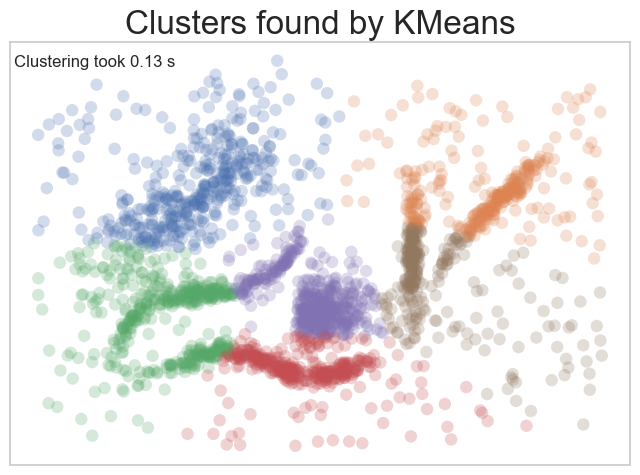

In [24]:
#Plotting the KMeans model with the best parameters
plot_clusters(data, cluster.KMeans, (), {'n_clusters':6, "random_state":959, "max_iter":1000, "init":"random",
                                         "n_init":30, "tol":0.0002, "verbose":0, "copy_x":True, "algorithm":"lloyd"})


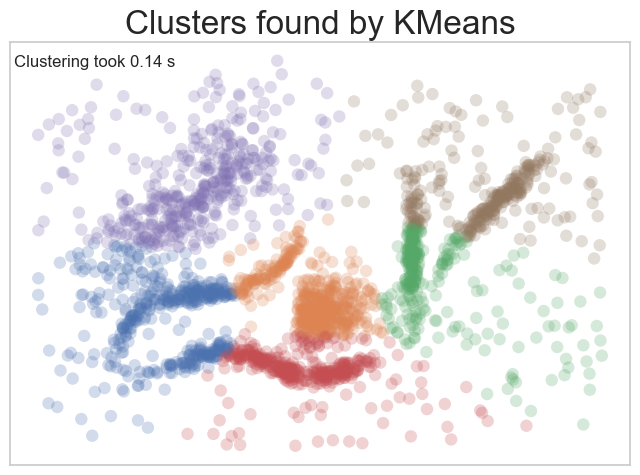

In [25]:
#Plotting the KMeans model with the best parameters
plot_clusters(data, cluster.KMeans, (), {'n_clusters':6, "random_state":959, "max_iter":1000, "init":"random",
                                         "n_init":30, "tol":0.0001, "verbose":0, "copy_x":True, "algorithm":"lloyd"})


### 1.4. Final

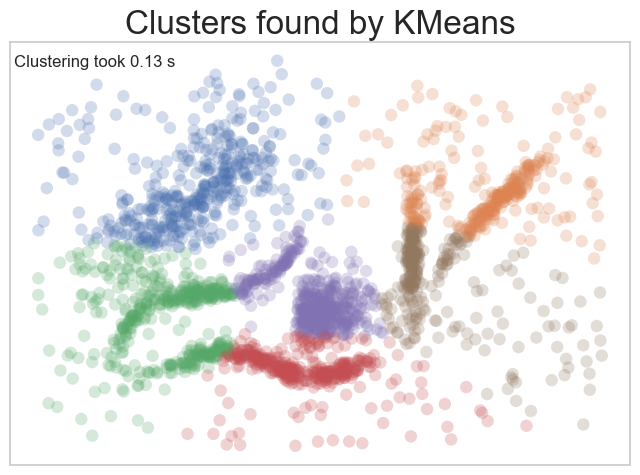

In [26]:
#Plotting the KMeans model with the best parameters
plot_clusters(data, cluster.KMeans, (), {'n_clusters':6, "random_state":959, "max_iter":1000, "init":"random",
                                         "n_init":30, "tol":0.0002, "verbose":0, "copy_x":True, "algorithm":"lloyd"})


## 2. Affinity Propagation

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_affinity_propagation.py:143: ConvergenceWarning: Affinity propagation did not converge, this model may return degenerate cluster centers and labels.
  warnings.warn(


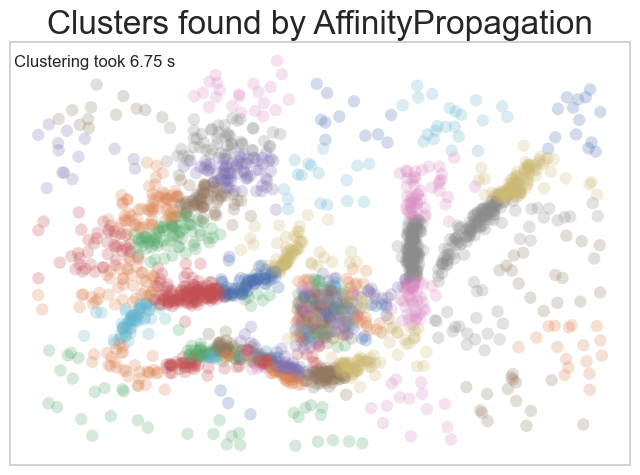

In [27]:
#Plotting the Affinity Propagation model with the default parameters
plot_clusters(data, cluster.AffinityPropagation, (), {})

### 2.1 Finding the best preference and damping parameters

In [29]:
#Finding the best hyperparameters with the inertia and silhoutte score
prefs = np.linspace(-50, 0, 11)
dampings = np.linspace(0.5, 1, 11)[:-1]

n_clusters_list = []
parameters = list()
inertia_list = []
silhouette_list = []

for pref in prefs:
    for damping in dampings:
        af = cluster.AffinityPropagation(preference=pref, damping=damping)
        af.fit(data)
        n_clusters_list.append(len(af.cluster_centers_indices_))
        used_parameters = "preference: " + str(pref) + ", " + "damping: " + str(damping)
        try:
            silhouette_avg = metrics.silhouette_score(data, af.labels_)
        except:
            silhouette_avg = "-"

        # Get the cluster labels and the number of clusters
        labels = af.labels_
        unique_labels = np.unique(labels)
        n_clusters = len(unique_labels)

        # Get the cluster centers
        cluster_centers = np.zeros((n_clusters, data.shape[1]))
        for i in range(n_clusters):
            cluster_centers[i] = np.mean(data[labels == unique_labels[i]], axis=0)

        # Calculate the inertia score
        inertia = 0.0
        for i in range(len(data)):
            # Calculate the distance to the nearest cluster center
            distances = [((data[i] - center) ** 2).sum() for center in cluster_centers]
            min_distance = min(distances)
            # Add the squared distance to the inertia score
            inertia += min_distance



        inertia_list.append(inertia)       
        silhouette_list.append(silhouette_avg)
        parameters.append(used_parameters)
        

df = pd.DataFrame(list(zip(n_clusters_list, silhouette_list, inertia_list)), index =parameters, columns =['Cluster_Number','Silhoutte_Score', 'Inertia_Score'])
df


/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_affinity_propagation.py:143: ConvergenceWarning: Affinity propagation did not converge, this model may return degenerate cluster centers and labels.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_affinity_propagation.py:143: ConvergenceWarning: Affinity propagation did not converge, this model may return degenerate cluster centers and labels.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_affinity_propagation.py:143: ConvergenceWarning: Affinity propagation did not converge, this model may return degenerate cluster centers and labels.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_affinity_propagation.py:143: ConvergenceWarning: Affinity propagation did not converge, this model may return degenerate cluster centers and labels.
  warnings.warn(
/Users/hasan

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_affinity_propagation.py:143: ConvergenceWarning: Affinity propagation did not converge, this model may return degenerate cluster centers and labels.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_affinity_propagation.py:143: ConvergenceWarning: Affinity propagation did not converge, this model may return degenerate cluster centers and labels.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_affinity_propagation.py:143: ConvergenceWarning: Affinity propagation did not converge, this model may return degenerate cluster centers and labels.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_affinity_propagation.py:143: ConvergenceWarning: Affinity propagation did not converge, this model may return degenerate cluster centers and labels.
  warnings.warn(
/Users/hasan

,Cluster_Number,Silhoutte_Score,Inertia_Score
"preference: -50.0, damping: 0.5",2309,-,0.000000
"preference: -50.0, damping: 0.55",2309,-,0.000000
"preference: -50.0, damping: 0.6",2167,0.019765,0.215600
"preference: -50.0, damping: 0.65",2309,-,0.000000
"preference: -50.0, damping: 0.7",2221,0.014193,0.136223
...,...,...,...
"preference: 0.0, damping: 0.75",2309,-,0.000000
"preference: 0.0, damping: 0.8",2309,-,0.000000
"preference: 0.0, damping: 0.8500000000000001",2309,-,0.000000
"preference: 0.0, damping: 0.9",2309,-,0.000000


In [30]:
df[df.Cluster_Number==6].sort_values(by=['Silhoutte_Score'])

,Cluster_Number,Silhoutte_Score,Inertia_Score
"preference: -10.0, damping: 0.7",6,0.381589,44.384440
"preference: -10.0, damping: 0.8",6,0.39035,45.376714


In [31]:
df[df.Cluster_Number==6].sort_values(by=['Inertia_Score'])

,Cluster_Number,Silhoutte_Score,Inertia_Score
"preference: -10.0, damping: 0.7",6,0.381589,44.384440
"preference: -10.0, damping: 0.8",6,0.39035,45.376714


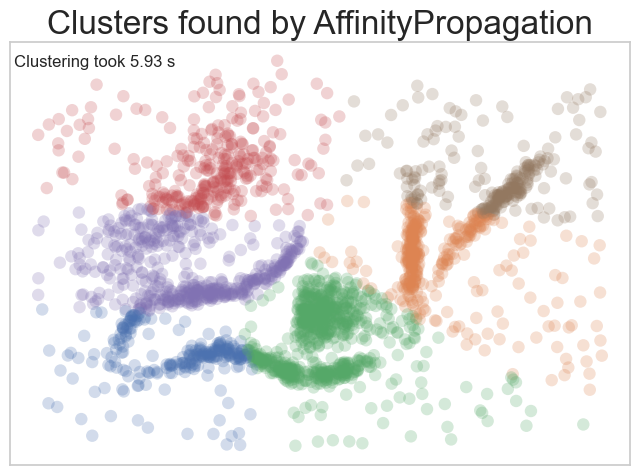

In [32]:
#Plotting the Affinity Propagation model
plot_clusters(data, cluster.AffinityPropagation, (), {'preference':-10.0, 'damping':0.7})

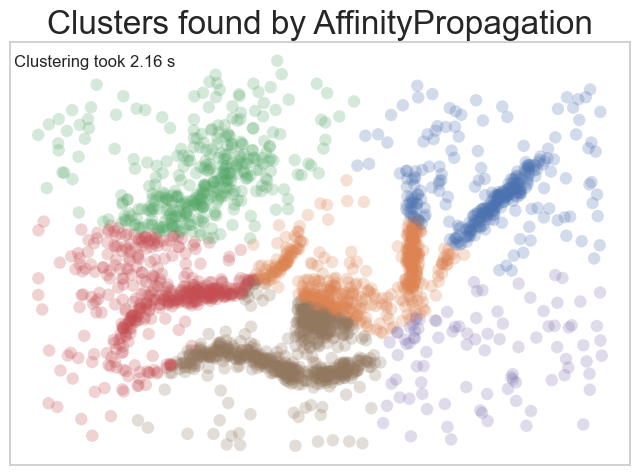

In [33]:
#Plotting the Affinity Propagation model
plot_clusters(data, cluster.AffinityPropagation, (), {'preference':-10.0, 'damping':0.8})

### 2.2 Finding the best max_iter, convergence_iter, copy, verbose, random_state parameters

In [34]:
#Finding the best hyperparameters with the inertia and silhoutte score
max_iters = [300,400,500]
convergence_iters = [15,20,25]
copies = [True, False]
verboses = [True, False]
random_states = [100,200,300]

n_clusters_list = []
parameters = list()
inertia_list = []
silhouette_list = []

for max_iter in max_iters:
    for convergence_iter in convergence_iters:
        for copy in copies:
            for verbose in verboses:
                for random_state in random_states:
                    af = cluster.AffinityPropagation(preference=-10, damping=0.7, max_iter=max_iter, convergence_iter=convergence_iter, 
                                                    copy=copy, verbose=verbose, random_state=random_state)
                    af.fit(data)
                    n_clusters_list.append(len(af.cluster_centers_indices_))
                    used_parameters = "max_iter: " + str(max_iter) + ", " + "convergence_iter: " + str(convergence_iter) + ", " + "copy: " + str(copy) + ", " + "verbose: " + str(verbose) + ", " + "random_state: " + str(random_state)
                    try:
                        silhouette_avg = metrics.silhouette_score(data, af.labels_)
                    except:
                        silhouette_avg = "-"

                    # Get the cluster labels and the number of clusters
                    labels = af.labels_
                    unique_labels = np.unique(labels)
                    n_clusters = len(unique_labels)

                    # Get the cluster centers
                    cluster_centers = np.zeros((n_clusters, data.shape[1]))
                    for i in range(n_clusters):
                        cluster_centers[i] = np.mean(data[labels == unique_labels[i]], axis=0)

                    # Calculate the inertia score
                    inertia = 0.0
                    for i in range(len(data)):
                        # Calculate the distance to the nearest cluster center
                        distances = [((data[i] - center) ** 2).sum() for center in cluster_centers]
                        min_distance = min(distances)
                        # Add the squared distance to the inertia score
                        inertia += min_distance



                    inertia_list.append(inertia)       
                    silhouette_list.append(silhouette_avg)
                    parameters.append(used_parameters)
        

df = pd.DataFrame(list(zip(n_clusters_list, silhouette_list, inertia_list)), index =parameters, columns =['Cluster_Number','Silhoutte_Score', 'Inertia_Score'])
df


Converged after 294 iterations.
Converged after 131 iterations.
Converged after 184 iterations.
Converged after 294 iterations.
Converged after 131 iterations.
Converged after 184 iterations.
Converged after 299 iterations.
Converged after 136 iterations.
Converged after 189 iterations.
Converged after 299 iterations.
Converged after 136 iterations.
Converged after 189 iterations.
Did not converge


/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_affinity_propagation.py:143: ConvergenceWarning: Affinity propagation did not converge, this model may return degenerate cluster centers and labels.
  warnings.warn(


Converged after 141 iterations.
Converged after 229 iterations.


/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_affinity_propagation.py:143: ConvergenceWarning: Affinity propagation did not converge, this model may return degenerate cluster centers and labels.
  warnings.warn(


Did not converge


/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_affinity_propagation.py:143: ConvergenceWarning: Affinity propagation did not converge, this model may return degenerate cluster centers and labels.
  warnings.warn(


Converged after 141 iterations.
Converged after 229 iterations.


/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_affinity_propagation.py:143: ConvergenceWarning: Affinity propagation did not converge, this model may return degenerate cluster centers and labels.
  warnings.warn(


Converged after 294 iterations.
Converged after 131 iterations.
Converged after 184 iterations.
Converged after 294 iterations.
Converged after 131 iterations.
Converged after 184 iterations.
Converged after 299 iterations.
Converged after 136 iterations.
Converged after 189 iterations.
Converged after 299 iterations.
Converged after 136 iterations.
Converged after 189 iterations.
Converged after 340 iterations.
Converged after 141 iterations.
Converged after 229 iterations.
Converged after 340 iterations.
Converged after 141 iterations.
Converged after 229 iterations.
Converged after 294 iterations.
Converged after 131 iterations.
Converged after 184 iterations.
Converged after 294 iterations.
Converged after 131 iterations.
Converged after 184 iterations.
Converged after 299 iterations.
Converged after 136 iterations.
Converged after 189 iterations.
Converged after 299 iterations.
Converged after 136 iterations.
Converged after 189 iterations.
Converged after 340 iterations.
Converge

,Cluster_Number,Silhoutte_Score,Inertia_Score
"max_iter: 300, convergence_iter: 15, copy: True, verbose: True, random_state: 100",6,0.376413,44.332426
"max_iter: 300, convergence_iter: 15, copy: True, verbose: True, random_state: 200",6,0.374322,44.319355
"max_iter: 300, convergence_iter: 15, copy: True, verbose: True, random_state: 300",6,0.376413,44.332426
"max_iter: 300, convergence_iter: 15, copy: True, verbose: False, random_state: 100",6,0.376413,44.332426
"max_iter: 300, convergence_iter: 15, copy: True, verbose: False, random_state: 200",6,0.374322,44.319355
...,...,...,...
"max_iter: 500, convergence_iter: 25, copy: False, verbose: True, random_state: 200",6,0.374322,44.319355
"max_iter: 500, convergence_iter: 25, copy: False, verbose: True, random_state: 300",6,0.374322,44.319355
"max_iter: 500, convergence_iter: 25, copy: False, verbose: False, random_state: 100",6,0.374322,44.319355
"max_iter: 500, convergence_iter: 25, copy: False, verbose: False, random_state: 200",6,0.374322,44.319355


In [35]:
df[df.Cluster_Number==6].sort_values(by=['Silhoutte_Score'])

,Cluster_Number,Silhoutte_Score,Inertia_Score
"max_iter: 500, convergence_iter: 25, copy: False, verbose: False, random_state: 300",6,0.374322,44.319355
"max_iter: 300, convergence_iter: 25, copy: False, verbose: True, random_state: 300",6,0.374322,44.319355
"max_iter: 300, convergence_iter: 25, copy: False, verbose: False, random_state: 200",6,0.374322,44.319355
"max_iter: 400, convergence_iter: 25, copy: False, verbose: False, random_state: 200",6,0.374322,44.319355
"max_iter: 400, convergence_iter: 15, copy: True, verbose: True, random_state: 200",6,0.374322,44.319355
...,...,...,...
"max_iter: 400, convergence_iter: 15, copy: True, verbose: True, random_state: 300",6,0.376413,44.332426
"max_iter: 400, convergence_iter: 15, copy: True, verbose: True, random_state: 100",6,0.376413,44.332426
"max_iter: 300, convergence_iter: 25, copy: False, verbose: False, random_state: 100",6,0.376413,44.332426
"max_iter: 400, convergence_iter: 15, copy: False, verbose: True, random_state: 300",6,0.376413,44.332426


In [36]:
df[df.Cluster_Number==6].sort_values(by=['Inertia_Score'])

,Cluster_Number,Silhoutte_Score,Inertia_Score
"max_iter: 500, convergence_iter: 25, copy: False, verbose: False, random_state: 300",6,0.374322,44.319355
"max_iter: 300, convergence_iter: 25, copy: False, verbose: True, random_state: 300",6,0.374322,44.319355
"max_iter: 300, convergence_iter: 25, copy: False, verbose: False, random_state: 200",6,0.374322,44.319355
"max_iter: 400, convergence_iter: 25, copy: False, verbose: False, random_state: 200",6,0.374322,44.319355
"max_iter: 400, convergence_iter: 15, copy: True, verbose: True, random_state: 200",6,0.374322,44.319355
...,...,...,...
"max_iter: 400, convergence_iter: 15, copy: True, verbose: True, random_state: 300",6,0.376413,44.332426
"max_iter: 400, convergence_iter: 15, copy: True, verbose: True, random_state: 100",6,0.376413,44.332426
"max_iter: 300, convergence_iter: 25, copy: False, verbose: False, random_state: 100",6,0.376413,44.332426
"max_iter: 400, convergence_iter: 15, copy: False, verbose: True, random_state: 300",6,0.376413,44.332426


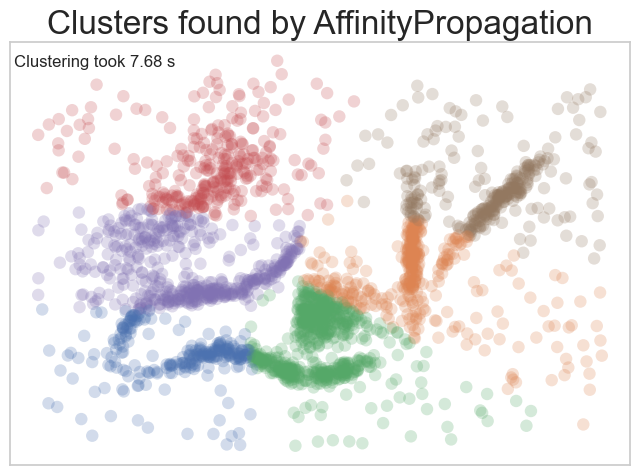

In [37]:
#Plotting the Affinity Propagation model
plot_clusters(data, cluster.AffinityPropagation, (), {'preference':-10.0, 'damping':0.7, 'max_iter': 500,
                                                      'convergence_iter':25, 'copy':False, 'affinity':'euclidean', 
                                                     'verbose': False, 'random_state':300})

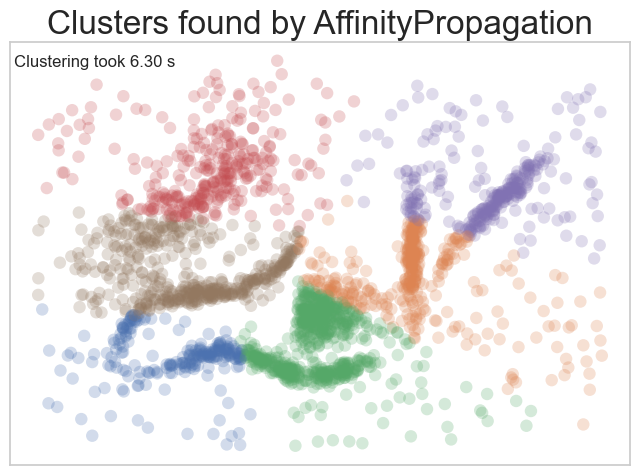

In [38]:
#Plotting the Affinity Propagation model
plot_clusters(data, cluster.AffinityPropagation, (), {'preference':-10.0, 'damping':0.7, 'max_iter': 400,
                                                      'convergence_iter':20, 'copy':True, 'affinity':'euclidean', 
                                                     'verbose': False, 'random_state':300})

### 2.3 Final

In [40]:
af = cluster.AffinityPropagation(preference=-10, damping=0.7, max_iter=400, convergence_iter=20, 
                                copy=True, verbose=False, random_state=300, affinity='euclidean')
af.fit(data)
n_clusters_list.append(len(af.cluster_centers_indices_))
metrics.silhouette_score(data, af.labels_)


0.3764129889632038

In [41]:
af = cluster.AffinityPropagation(preference=-10, damping=0.7, max_iter=400, convergence_iter=20, 
                                copy=True, verbose=False, random_state=300, affinity='euclidean')
af.fit(data)
# Get the cluster labels and the number of clusters
labels = af.labels_
unique_labels = np.unique(labels)
n_clusters = len(unique_labels)

# Get the cluster centers
cluster_centers = np.zeros((n_clusters, data.shape[1]))
for i in range(n_clusters):
    cluster_centers[i] = np.mean(data[labels == unique_labels[i]], axis=0)

# Calculate the inertia score
inertia = 0.0
for i in range(len(data)):
    # Calculate the distance to the nearest cluster center
    distances = [((data[i] - center) ** 2).sum() for center in cluster_centers]
    min_distance = min(distances)
    # Add the squared distance to the inertia score
    inertia += min_distance
inertia

44.33242605061046

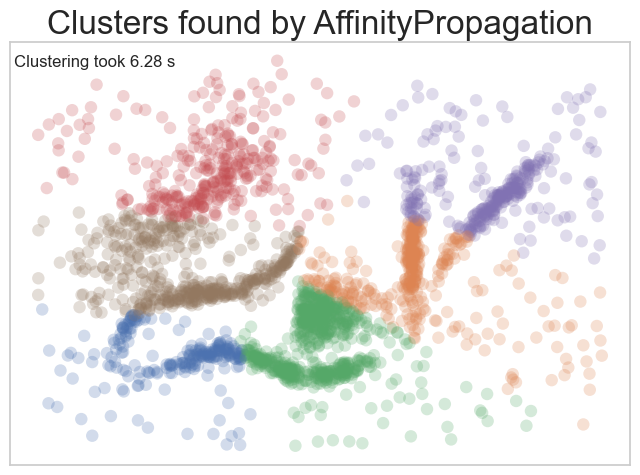

In [42]:
#Plotting the Affinity Propagation model
plot_clusters(data, cluster.AffinityPropagation, (), {'preference':-10.0, 'damping':0.7, 'max_iter': 400,
                                                      'convergence_iter':20, 'copy':True, 'affinity':'euclidean', 
                                                     'verbose': False, 'random_state':300})

## 3. Mean Shift

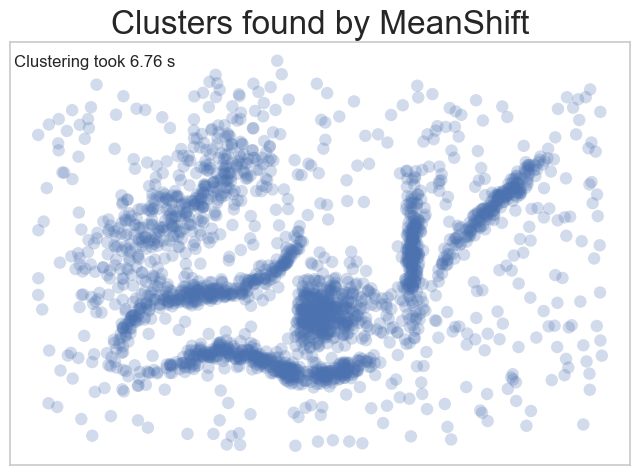

In [43]:
#Plotting the Mean Shift model
plot_clusters(data, cluster.MeanShift, (), {})

### 3.1 Finding the best bandwidth parameter

In [44]:
#Finding the best hyperparameters with the inertia and silhoutte score
quantiles = np.linspace(0, 1, 21)[1:]
n_sampless = np.linspace(0, 1000, 11)[1:]

n_clusters_list = []
parameters = list()
inertia_list = []
silhouette_list = []

for quantile in quantiles:
    for n_samples in n_sampless:
        n_samples = int(n_samples)
        bandwidth = cluster.estimate_bandwidth(data, quantile=quantile, n_samples=n_samples)
        ms = cluster.MeanShift(bandwidth=bandwidth)
        ms.fit(data)
        
        used_parameters = "quantile: " + str(quantile) + ", " + "n_samples: " + str(n_samples)
        try:
            silhouette_avg = metrics.silhouette_score(data, ms.labels_)
        except:
            silhouette_avg = "-"


        # Get the cluster labels and the number of clusters
        labels = ms.labels_
        unique_labels = np.unique(labels)
        n_clusters = len(unique_labels)

        # Get the cluster centers
        cluster_centers = np.zeros((n_clusters, data.shape[1]))
        for i in range(n_clusters):
            cluster_centers[i] = np.mean(data[labels == unique_labels[i]], axis=0)

        # Calculate the inertia score
        inertia = 0.0
        for i in range(len(data)):
            # Calculate the distance to the nearest cluster center
            distances = [((data[i] - center) ** 2).sum() for center in cluster_centers]
            min_distance = min(distances)
            # Add the squared distance to the inertia score
            inertia += min_distance


        n_clusters_list.append(len(set(labels)))
        inertia_list.append(inertia)       
        silhouette_list.append(silhouette_avg)
        parameters.append(used_parameters)
        

df = pd.DataFrame(list(zip(n_clusters_list, silhouette_list, inertia_list)), index =parameters, columns =['Cluster_Number','Silhoutte_Score', 'Inertia_Score'])
df


,Cluster_Number,Silhoutte_Score,Inertia_Score
"quantile: 0.05, n_samples: 100",36,0.367579,10.932784
"quantile: 0.05, n_samples: 200",29,0.328551,14.100528
"quantile: 0.05, n_samples: 300",23,0.362438,18.940938
"quantile: 0.05, n_samples: 400",22,0.36461,18.902178
"quantile: 0.05, n_samples: 500",23,0.383033,15.536872
...,...,...,...
"quantile: 1.0, n_samples: 600",1,-,244.864952
"quantile: 1.0, n_samples: 700",1,-,244.864952
"quantile: 1.0, n_samples: 800",1,-,244.864952
"quantile: 1.0, n_samples: 900",1,-,244.864952


In [45]:
df[df.Cluster_Number==6].sort_values(by=['Inertia_Score'])

,Cluster_Number,Silhoutte_Score,Inertia_Score


In [46]:
df[df.Cluster_Number==6].sort_values(by=['Silhoutte_Score'])

,Cluster_Number,Silhoutte_Score,Inertia_Score


In [47]:
df[df.Cluster_Number==5]

,Cluster_Number,Silhoutte_Score,Inertia_Score
"quantile: 0.15000000000000002, n_samples: 100",5,0.416264,55.407497
"quantile: 0.15000000000000002, n_samples: 200",5,0.414619,55.321147
"quantile: 0.15000000000000002, n_samples: 300",5,0.411974,55.546580


In [48]:
df[df.Cluster_Number==7]

,Cluster_Number,Silhoutte_Score,Inertia_Score


In [49]:
df[df.Cluster_Number==8]

,Cluster_Number,Silhoutte_Score,Inertia_Score
"quantile: 0.1, n_samples: 400",8,0.346891,41.558536
"quantile: 0.1, n_samples: 600",8,0.346745,41.592891
"quantile: 0.1, n_samples: 700",8,0.323354,46.636843
"quantile: 0.1, n_samples: 800",8,0.323354,46.636843


In [50]:
#Finding the best hyperparameters with the inertia and silhoutte score
quantiles = np.linspace(0.1, 0.15, 11)[1:]
n_sampless = np.linspace(0, 1000, 11)[1:]

n_clusters_list = []
parameters = list()
inertia_list = []
silhouette_list = []

for quantile in quantiles:
    for n_samples in n_sampless:
        n_samples = int(n_samples)
        bandwidth = cluster.estimate_bandwidth(data, quantile=quantile, n_samples=n_samples)
        ms = cluster.MeanShift(bandwidth=bandwidth)
        ms.fit(data)
        
        used_parameters = "quantile: " + str(quantile) + ", " + "n_samples: " + str(n_samples)
        try:
            silhouette_avg = metrics.silhouette_score(data, ms.labels_)
        except:
            silhouette_avg = "-"


        # Get the cluster labels and the number of clusters
        labels = ms.labels_
        unique_labels = np.unique(labels)
        n_clusters = len(unique_labels)

        # Get the cluster centers
        cluster_centers = np.zeros((n_clusters, data.shape[1]))
        for i in range(n_clusters):
            cluster_centers[i] = np.mean(data[labels == unique_labels[i]], axis=0)

        # Calculate the inertia score
        inertia = 0.0
        for i in range(len(data)):
            # Calculate the distance to the nearest cluster center
            distances = [((data[i] - center) ** 2).sum() for center in cluster_centers]
            min_distance = min(distances)
            # Add the squared distance to the inertia score
            inertia += min_distance


        n_clusters_list.append(len(set(labels)))
        inertia_list.append(inertia)       
        silhouette_list.append(silhouette_avg)
        parameters.append(used_parameters)
        

df = pd.DataFrame(list(zip(n_clusters_list, silhouette_list, inertia_list)), index =parameters, columns =['Cluster_Number','Silhoutte_Score', 'Inertia_Score'])
df


,Cluster_Number,Silhoutte_Score,Inertia_Score
"quantile: 0.10500000000000001, n_samples: 100",10,0.346234,38.469746
"quantile: 0.10500000000000001, n_samples: 200",10,0.356231,38.546394
"quantile: 0.10500000000000001, n_samples: 300",8,0.346912,41.596033
"quantile: 0.10500000000000001, n_samples: 400",7,0.342777,52.473047
"quantile: 0.10500000000000001, n_samples: 500",7,0.372383,49.273820
...,...,...,...
"quantile: 0.15, n_samples: 600",4,0.419222,63.354707
"quantile: 0.15, n_samples: 700",4,0.419667,63.396858
"quantile: 0.15, n_samples: 800",4,0.419189,63.470809
"quantile: 0.15, n_samples: 900",4,0.419672,63.271660


In [52]:
df[df.Cluster_Number==6].sort_values(by=['Inertia_Score'])

,Cluster_Number,Silhoutte_Score,Inertia_Score
"quantile: 0.10500000000000001, n_samples: 800",6,0.368213,53.630068
"quantile: 0.115, n_samples: 200",6,0.368458,53.641641
"quantile: 0.11, n_samples: 300",6,0.368090,53.675231
"quantile: 0.10500000000000001, n_samples: 700",6,0.367082,53.835857
"quantile: 0.11, n_samples: 800",6,0.376705,55.429576
"quantile: 0.12, n_samples: 200",6,0.376705,55.429576
"quantile: 0.11, n_samples: 700",6,0.374563,55.682522


In [53]:
df[df.Cluster_Number==6].sort_values(by=['Silhoutte_Score'])

,Cluster_Number,Silhoutte_Score,Inertia_Score
"quantile: 0.10500000000000001, n_samples: 700",6,0.367082,53.835857
"quantile: 0.11, n_samples: 300",6,0.368090,53.675231
"quantile: 0.10500000000000001, n_samples: 800",6,0.368213,53.630068
"quantile: 0.115, n_samples: 200",6,0.368458,53.641641
"quantile: 0.11, n_samples: 700",6,0.374563,55.682522
"quantile: 0.11, n_samples: 800",6,0.376705,55.429576
"quantile: 0.12, n_samples: 200",6,0.376705,55.429576


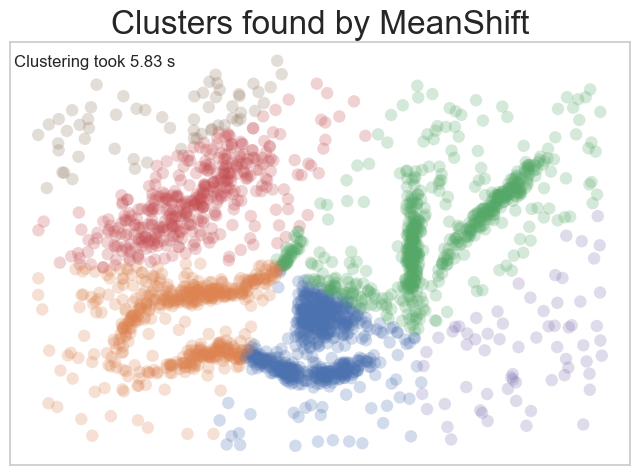

In [54]:
#Plotting the Mean Shift model
bandwidth = cluster.estimate_bandwidth(data, quantile=0.105, n_samples=800)
plot_clusters(data, cluster.MeanShift, (), {'bandwidth':bandwidth})

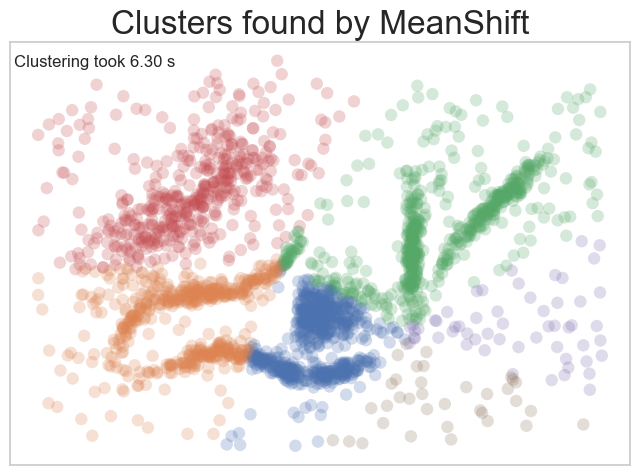

In [55]:
#Plotting the Mean Shift model
bandwidth = cluster.estimate_bandwidth(data, quantile=0.12, n_samples=200)
plot_clusters(data, cluster.MeanShift, (), {'bandwidth':bandwidth})

### 3.2 Finding the best bin_seeding parameter

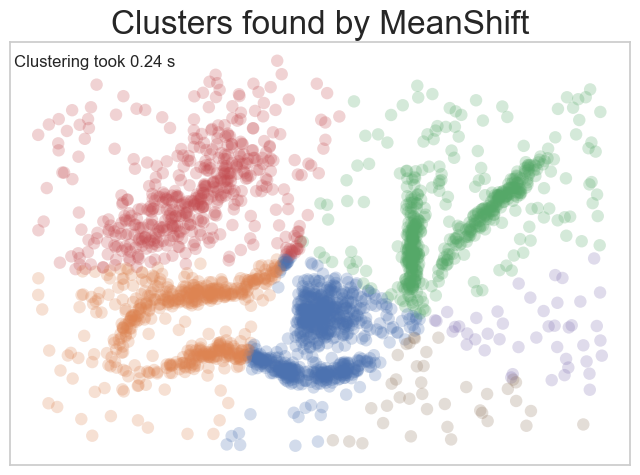

In [56]:
#Plotting the Mean Shift model
bandwidth = cluster.estimate_bandwidth(data, quantile=0.12, n_samples=200)
plot_clusters(data, cluster.MeanShift, (), {'bandwidth':bandwidth, 'bin_seeding':True})

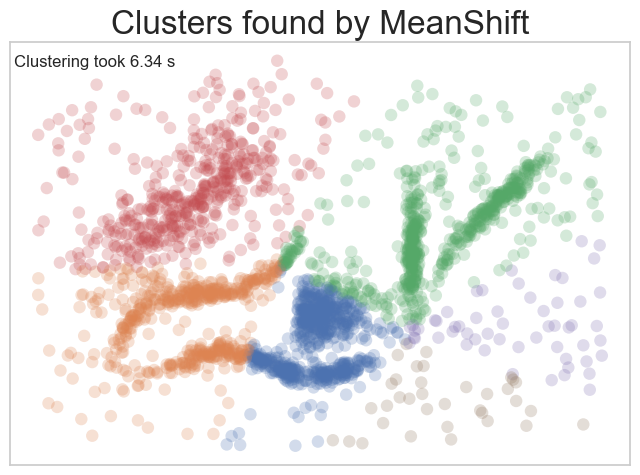

In [57]:
#Plotting the Mean Shift model
bandwidth = cluster.estimate_bandwidth(data, quantile=0.12, n_samples=200)
plot_clusters(data, cluster.MeanShift, (), {'bandwidth':bandwidth, 'bin_seeding':False})

### 3.3 Finding the best min_bin_freq parameter

In [63]:
#Finding the best hyperparameters with the inertia and silhoutte score
min_bin_freqs = np.linspace(1, 10, 11)[1:]

n_clusters_list = []
parameters = list()
inertia_list = []
silhouette_list = []

for min_bin_freq in min_bin_freqs:
    bandwidth = cluster.estimate_bandwidth(data, quantile=0.12, n_samples=200)
    min_bin_freq = int(min_bin_freq)
    ms = cluster.MeanShift(bandwidth=bandwidth, bin_seeding=True, min_bin_freq=min_bin_freq)
    ms.fit(data)

    used_parameters = "min_bin_freq: " + str(min_bin_freq)
    try:
        silhouette_avg = metrics.silhouette_score(data, ms.labels_)
    except:
        silhouette_avg = "-"


    # Get the cluster labels and the number of clusters
    labels = ms.labels_
    unique_labels = np.unique(labels)
    n_clusters = len(unique_labels)

    # Get the cluster centers
    cluster_centers = np.zeros((n_clusters, data.shape[1]))
    for i in range(n_clusters):
        cluster_centers[i] = np.mean(data[labels == unique_labels[i]], axis=0)

    # Calculate the inertia score
    inertia = 0.0
    for i in range(len(data)):
        # Calculate the distance to the nearest cluster center
        distances = [((data[i] - center) ** 2).sum() for center in cluster_centers]
        min_distance = min(distances)
        # Add the squared distance to the inertia score
        inertia += min_distance


    n_clusters_list.append(len(set(labels)))
    inertia_list.append(inertia)       
    silhouette_list.append(silhouette_avg)
    parameters.append(used_parameters)


df = pd.DataFrame(list(zip(n_clusters_list, silhouette_list, inertia_list)), index =parameters, columns =['Cluster_Number','Silhoutte_Score', 'Inertia_Score'])
df


,Cluster_Number,Silhoutte_Score,Inertia_Score
min_bin_freq: 1,6,0.398579,53.644050
min_bin_freq: 2,6,0.398579,53.644050
min_bin_freq: 3,6,0.398579,53.644050
min_bin_freq: 4,5,0.420967,55.008939
min_bin_freq: 5,5,0.420967,55.008939
min_bin_freq: 6,5,0.420967,55.008939
min_bin_freq: 7,5,0.420967,55.008939
min_bin_freq: 8,5,0.420967,55.008939
min_bin_freq: 9,5,0.420967,55.008939
min_bin_freq: 10,5,0.420967,55.008939


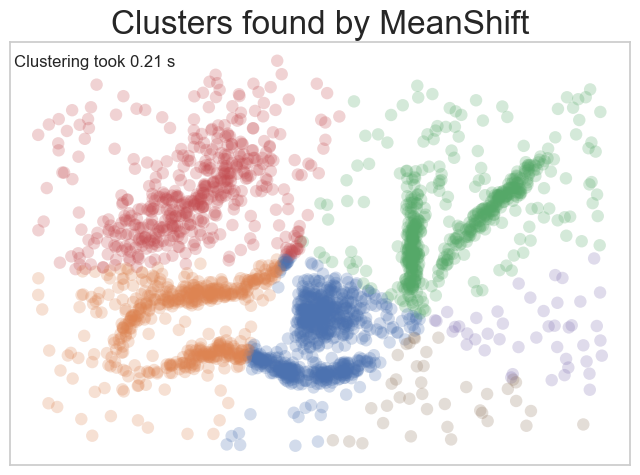

In [65]:
#Plotting the Mean Shift model
bandwidth = cluster.estimate_bandwidth(data, quantile=0.12, n_samples=200)
plot_clusters(data, cluster.MeanShift, (), {'bandwidth':bandwidth, 'bin_seeding':True, 'min_bin_freq':3})

### 3.4 Finding the best seeds, n_jobs, max_iter parameter

In [66]:
#Finding the best hyperparameters with the inertia and silhoutte score
seedss = [[[-1, -1], [0, 0], [1, 1]],[[-5, -5], [0, 0], [5, 5]],[[-10, -10], [0, 0], [10, 10]],None]
n_jobss = [-1,10,None]
max_iters = [300,500,1000]

n_clusters_list = []
parameters = list()
inertia_list = []
silhouette_list = []

for seeds in seedss:
    for n_jobs in n_jobss:
        for max_iter in max_iters:
            bandwidth = cluster.estimate_bandwidth(data, quantile=0.12, n_samples=200)
            min_bin_freq = int(min_bin_freq)
            ms = cluster.MeanShift(bandwidth=bandwidth, bin_seeding=True, min_bin_freq=3, seeds=seeds, n_jobs=n_jobs, 
                                  max_iter=max_iter)
            ms.fit(data)

            used_parameters = "seeds: " + str(seeds) + ", " + "n_jobs: " + str(n_jobs) + ", " + "max_iter: " + str(max_iter)
            try:
                silhouette_avg = metrics.silhouette_score(data, ms.labels_)
            except:
                silhouette_avg = "-"

            # Get the cluster labels and the number of clusters
            labels = ms.labels_
            unique_labels = np.unique(labels)
            n_clusters = len(unique_labels)

            # Get the cluster centers
            cluster_centers = np.zeros((n_clusters, data.shape[1]))
            for i in range(n_clusters):
                cluster_centers[i] = np.mean(data[labels == unique_labels[i]], axis=0)

            # Calculate the inertia score
            inertia = 0.0
            for i in range(len(data)):
                # Calculate the distance to the nearest cluster center
                distances = [((data[i] - center) ** 2).sum() for center in cluster_centers]
                min_distance = min(distances)
                # Add the squared distance to the inertia score
                inertia += min_distance


            n_clusters_list.append(len(set(labels)))
            inertia_list.append(inertia)       
            silhouette_list.append(silhouette_avg)
            parameters.append(used_parameters)


df = pd.DataFrame(list(zip(n_clusters_list, silhouette_list, inertia_list)), index =parameters, columns =['Cluster_Number','Silhoutte_Score', 'Inertia_Score'])
df


,Cluster_Number,Silhoutte_Score,Inertia_Score
"seeds: [[-1, -1], [0, 0], [1, 1]], n_jobs: -1, max_iter: 300",1,-,244.864952
"seeds: [[-1, -1], [0, 0], [1, 1]], n_jobs: -1, max_iter: 500",1,-,244.864952
"seeds: [[-1, -1], [0, 0], [1, 1]], n_jobs: -1, max_iter: 1000",1,-,244.864952
"seeds: [[-1, -1], [0, 0], [1, 1]], n_jobs: 10, max_iter: 300",1,-,244.864952
"seeds: [[-1, -1], [0, 0], [1, 1]], n_jobs: 10, max_iter: 500",1,-,244.864952
"seeds: [[-1, -1], [0, 0], [1, 1]], n_jobs: 10, max_iter: 1000",1,-,244.864952
"seeds: [[-1, -1], [0, 0], [1, 1]], n_jobs: None, max_iter: 300",1,-,244.864952
"seeds: [[-1, -1], [0, 0], [1, 1]], n_jobs: None, max_iter: 500",1,-,244.864952
"seeds: [[-1, -1], [0, 0], [1, 1]], n_jobs: None, max_iter: 1000",1,-,244.864952
"seeds: [[-5, -5], [0, 0], [5, 5]], n_jobs: -1, max_iter: 300",1,-,244.864952


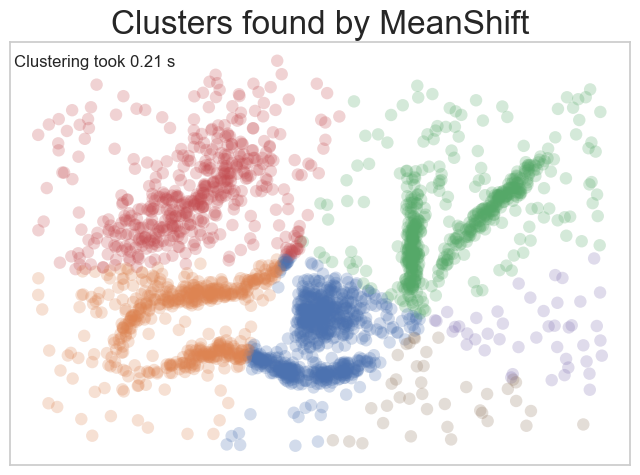

In [67]:
#Plotting the Mean Shift model
bandwidth = cluster.estimate_bandwidth(data, quantile=0.12, n_samples=200)
plot_clusters(data, cluster.MeanShift, (), {'bandwidth':bandwidth, 'bin_seeding':True, 'min_bin_freq':3, 'seeds':None, 
                                           'n_jobs':None, 'max_iter':300})

### 3.5 Finding the best cluster_all parameter

In [70]:
bandwidth = cluster.estimate_bandwidth(data, quantile=0.12, n_samples=200)
ms = cluster.MeanShift(bandwidth=bandwidth, bin_seeding=True, min_bin_freq=3, seeds=None, n_jobs=None, 
                      max_iter=300, cluster_all=True)
ms.fit(data)
metrics.silhouette_score(data, ms.labels_)

0.3985791564550289

In [71]:
bandwidth = cluster.estimate_bandwidth(data, quantile=0.12, n_samples=200)
ms = cluster.MeanShift(bandwidth=bandwidth, bin_seeding=True, min_bin_freq=3, seeds=None, n_jobs=None, 
                      max_iter=300, cluster_all=True)
ms.fit(data)
# Get the cluster labels and the number of clusters
labels = ms.labels_
unique_labels = np.unique(labels)
n_clusters = len(unique_labels)

# Get the cluster centers
cluster_centers = np.zeros((n_clusters, data.shape[1]))
for i in range(n_clusters):
    cluster_centers[i] = np.mean(data[labels == unique_labels[i]], axis=0)

# Calculate the inertia score
inertia = 0.0
for i in range(len(data)):
    # Calculate the distance to the nearest cluster center
    distances = [((data[i] - center) ** 2).sum() for center in cluster_centers]
    min_distance = min(distances)
    # Add the squared distance to the inertia score
    inertia += min_distance
inertia

53.64405042170034

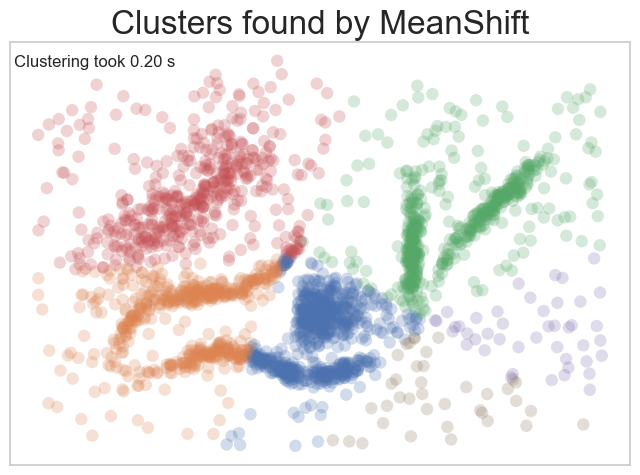

In [72]:
#Plotting the Mean Shift model
bandwidth = cluster.estimate_bandwidth(data, quantile=0.12, n_samples=200)
plot_clusters(data, cluster.MeanShift, (), {'bandwidth':bandwidth, 'bin_seeding':True, 'min_bin_freq':3, 'seeds':None, 
                                           'n_jobs':None, 'max_iter':300, 'cluster_all':True})

In [73]:
bandwidth = cluster.estimate_bandwidth(data, quantile=0.12, n_samples=200)
ms = cluster.MeanShift(bandwidth=bandwidth, bin_seeding=True, min_bin_freq=3, seeds=None, n_jobs=None, 
                      max_iter=300, cluster_all=False)
ms.fit(data)
metrics.silhouette_score(data, ms.labels_)


0.22259053132433673

In [74]:
bandwidth = cluster.estimate_bandwidth(data, quantile=0.12, n_samples=200)
ms = cluster.MeanShift(bandwidth=bandwidth, bin_seeding=True, min_bin_freq=3, seeds=None, n_jobs=None, 
                      max_iter=300, cluster_all=False)
ms.fit(data)
# Get the cluster labels and the number of clusters
labels = ms.labels_
unique_labels = np.unique(labels)
n_clusters = len(unique_labels)

# Get the cluster centers
cluster_centers = np.zeros((n_clusters, data.shape[1]))
for i in range(n_clusters):
    cluster_centers[i] = np.mean(data[labels == unique_labels[i]], axis=0)

# Calculate the inertia score
inertia = 0.0
for i in range(len(data)):
    # Calculate the distance to the nearest cluster center
    distances = [((data[i] - center) ** 2).sum() for center in cluster_centers]
    min_distance = min(distances)
    # Add the squared distance to the inertia score
    inertia += min_distance
inertia

55.46018086337422

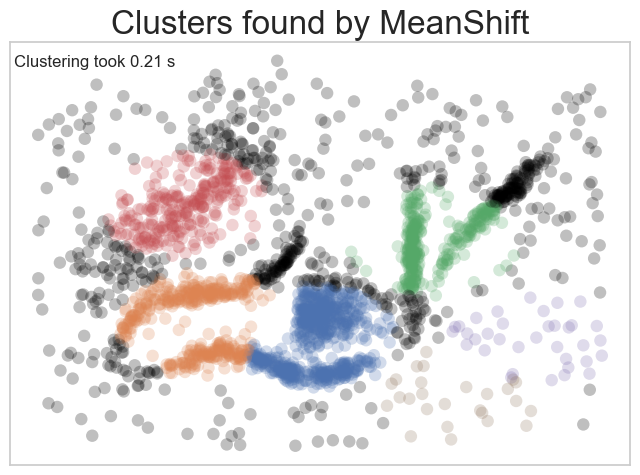

In [75]:
#Plotting the Mean Shift model
bandwidth = cluster.estimate_bandwidth(data, quantile=0.12, n_samples=200)
plot_clusters(data, cluster.MeanShift, (), {'bandwidth':bandwidth, 'bin_seeding':True, 'min_bin_freq':3, 'seeds':None, 
                                           'n_jobs':None, 'max_iter':300, 'cluster_all':False})

### 3.6 Final

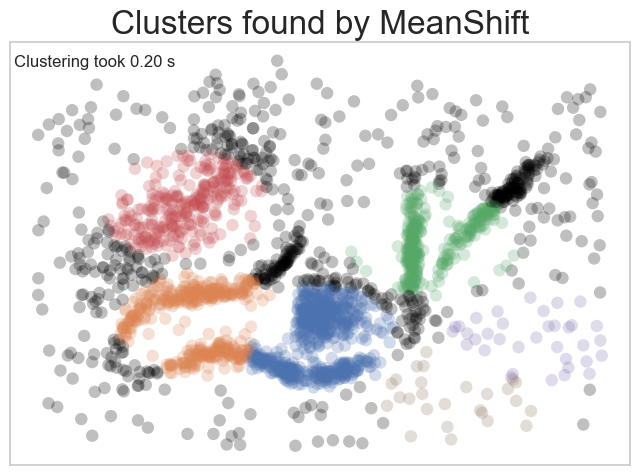

In [76]:
#Plotting the Mean Shift model
bandwidth = cluster.estimate_bandwidth(data, quantile=0.12, n_samples=200)
plot_clusters(data, cluster.MeanShift, (), {'bandwidth':bandwidth, 'bin_seeding':True, 'min_bin_freq':3, 'seeds':None, 
                                           'n_jobs':None, 'max_iter':300, 'cluster_all':False})

## 4. Spectral Clustering

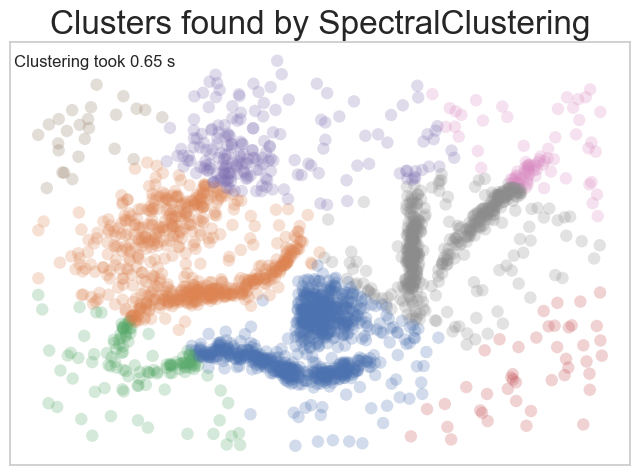

In [77]:
plot_clusters(data, cluster.SpectralClustering, (), {})

### 4.1 Finding the best random_state parameter

In [79]:
# Finding the best parameters with the silhoutte and inertia score
random_states = np.arange(1, 1001, 1)

silhouette_avgs = []
parameters = list()
inertias = []

# Fit the clustering model for each preference parameter value
for random_state in random_states:
    spectral_clustering = cluster.SpectralClustering(n_clusters=6, random_state=random_state)
    spectral_clustering.fit(data)
    silhouette_avg = metrics.silhouette_score(data, spectral_clustering.labels_)
    silhouette_avgs.append(silhouette_avg)
    used_parameters = "random_state: " + str(random_state)
    parameters.append(used_parameters)
    # Get the cluster labels and the number of clusters
    labels = spectral_clustering.labels_
    unique_labels = np.unique(labels)
    n_clusters = len(unique_labels)

    # Get the cluster centers
    cluster_centers = np.zeros((n_clusters, data.shape[1]))
    for i in range(n_clusters):
        cluster_centers[i] = np.mean(data[labels == unique_labels[i]], axis=0)

    # Calculate the inertia score
    inertia = 0.0
    for i in range(len(data)):
        # Calculate the distance to the nearest cluster center
        distances = [((data[i] - center) ** 2).sum() for center in cluster_centers]
        min_distance = min(distances)
        # Add the squared distance to the inertia score
        inertia += min_distance
    inertias.append(inertia)


df = pd.DataFrame(list(zip(silhouette_avgs, inertias)), index =parameters, columns =['Silhoutte_Score', 'Inertia_Score'])
df

,Silhoutte_Score,Inertia_Score
random_state: 1,0.356018,47.498108
random_state: 2,0.356018,47.498108
random_state: 3,0.356018,47.498108
random_state: 4,0.356018,47.498108
random_state: 5,0.356018,47.498108
...,...,...
random_state: 996,0.356018,47.498108
random_state: 997,0.355897,47.525510
random_state: 998,0.356773,47.481319
random_state: 999,0.356018,47.498108


In [80]:
# Finding the best random_state parameter with the silhoutte score
df[df.Silhoutte_Score==df.Silhoutte_Score.max()]

,Silhoutte_Score,Inertia_Score
random_state: 20,0.356773,47.481319
random_state: 39,0.356773,47.481319
random_state: 65,0.356773,47.481319
random_state: 98,0.356773,47.481319
random_state: 145,0.356773,47.481319
random_state: 220,0.356773,47.481319
random_state: 306,0.356773,47.481319
random_state: 326,0.356773,47.481319
random_state: 362,0.356773,47.481319
random_state: 382,0.356773,47.481319


In [81]:
# Finding the best random_state parameter with the inertia score
df[df.Inertia_Score==df.Inertia_Score.min()]

,Silhoutte_Score,Inertia_Score
random_state: 881,0.356636,47.456693


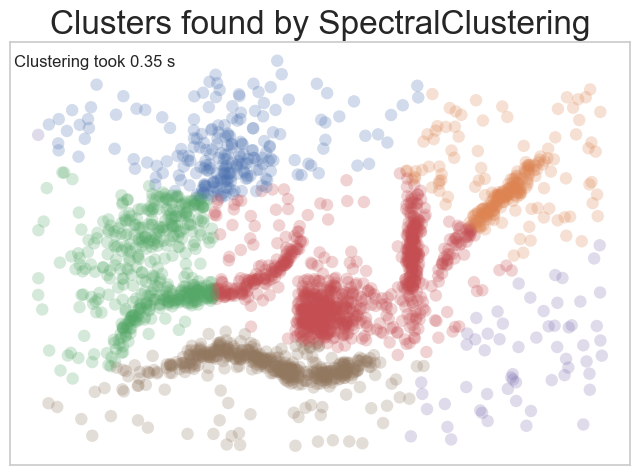

In [82]:
plot_clusters(data, cluster.SpectralClustering, (), {'n_clusters':6, 'random_state':881})

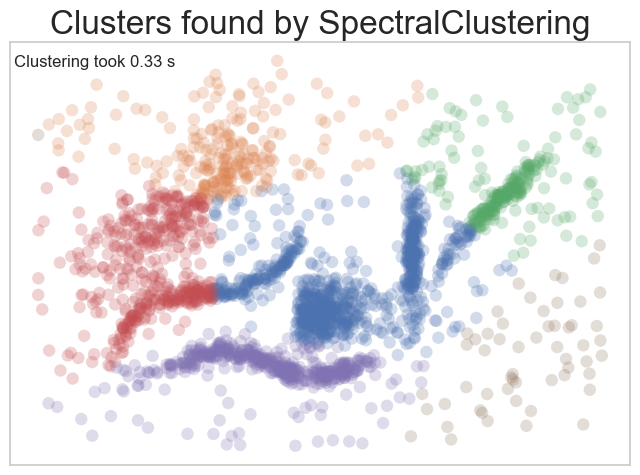

In [83]:
plot_clusters(data, cluster.SpectralClustering, (), {'n_clusters':6, 'random_state':20})

### 4.2 Finding the best eigen_solver, assign_labels, n_components, affinity parameter

In [87]:
# Finding the best parameters with the silhoutte score
eigen_solvers = ['arpack', 'lobpcg', 'amg']
assign_labelss = ['kmeans', 'discretize', 'cluster_qr']
n_componentss = [6,9,12,15]
affinities = ['nearest_neighbors', 'rbf', 'precomputed', 'precomputed_nearest_neighbors']

silhouette_avgs = []
parameters = list()
inertias = []

# Fit the clustering model for each preference parameter value
for eigen_solver in eigen_solvers:
    for assign_labels in assign_labelss:
        for n_components in n_componentss:
            for affinity in affinities:
                try:
                    spectral_clustering = cluster.SpectralClustering(n_clusters=6, random_state=20, eigen_solver=eigen_solver, 
                                                                     assign_labels=assign_labels, n_components=n_components, 
                                                                     n_init=n_init, affinity=affinity
                                                                    )
                    spectral_clustering.fit(data)
                    silhouette_avg = metrics.silhouette_score(data, spectral_clustering.labels_)
                    silhouette_avgs.append(silhouette_avg)
                    used_parameters = "eigen_solver: " + str(eigen_solver) + ", " + "assign_labels: " + str(assign_labels) + ", " + "n_components: " + str(n_components) + ", " + "affinity: " + str(affinity)
                    parameters.append(used_parameters)
                    # Get the cluster labels and the number of clusters
                    labels = spectral_clustering.labels_
                    unique_labels = np.unique(labels)
                    n_clusters = len(unique_labels)

                    # Get the cluster centers
                    cluster_centers = np.zeros((n_clusters, data.shape[1]))
                    for i in range(n_clusters):
                        cluster_centers[i] = np.mean(data[labels == unique_labels[i]], axis=0)

                    # Calculate the inertia score
                    inertia = 0.0
                    for i in range(len(data)):
                        # Calculate the distance to the nearest cluster center
                        distances = [((data[i] - center) ** 2).sum() for center in cluster_centers]
                        min_distance = min(distances)
                        # Add the squared distance to the inertia score
                        inertia += min_distance
                    inertias.append(inertia)
                except:
                    pass


df = pd.DataFrame(list(zip(silhouette_avgs, inertias)), index =parameters, columns =['Silhoutte_Score', 'Inertia_Score'])
df

,Silhoutte_Score,Inertia_Score
"eigen_solver: arpack, assign_labels: kmeans, n_components: 6, affinity: nearest_neighbors",0.299548,49.192838
"eigen_solver: arpack, assign_labels: kmeans, n_components: 6, affinity: rbf",0.356157,47.523092
"eigen_solver: arpack, assign_labels: kmeans, n_components: 9, affinity: nearest_neighbors",0.252660,60.228931
"eigen_solver: arpack, assign_labels: kmeans, n_components: 9, affinity: rbf",0.325835,56.787240
"eigen_solver: arpack, assign_labels: kmeans, n_components: 12, affinity: nearest_neighbors",0.289018,53.904586
...,...,...
"eigen_solver: amg, assign_labels: cluster_qr, n_components: 9, affinity: rbf",0.272309,38.009340
"eigen_solver: amg, assign_labels: cluster_qr, n_components: 12, affinity: nearest_neighbors",0.359038,24.704348
"eigen_solver: amg, assign_labels: cluster_qr, n_components: 12, affinity: rbf",0.097193,32.727376
"eigen_solver: amg, assign_labels: cluster_qr, n_components: 15, affinity: nearest_neighbors",0.328722,20.631082


In [88]:
df[df.Silhoutte_Score==df.Silhoutte_Score.max()]

,Silhoutte_Score,Inertia_Score
"eigen_solver: arpack, assign_labels: discretize, n_components: 6, affinity: rbf",0.385485,45.814302
"eigen_solver: lobpcg, assign_labels: discretize, n_components: 6, affinity: rbf",0.385485,45.814302
"eigen_solver: amg, assign_labels: discretize, n_components: 6, affinity: rbf",0.385485,45.814302


In [89]:
# Finding the best random_state parameter with the inertia score
df[df.Inertia_Score==df.Inertia_Score.min()]

,Silhoutte_Score,Inertia_Score
"eigen_solver: arpack, assign_labels: discretize, n_components: 15, affinity: nearest_neighbors",0.331357,20.12196
"eigen_solver: lobpcg, assign_labels: discretize, n_components: 15, affinity: nearest_neighbors",0.331357,20.12196
"eigen_solver: amg, assign_labels: discretize, n_components: 15, affinity: nearest_neighbors",0.331357,20.12196


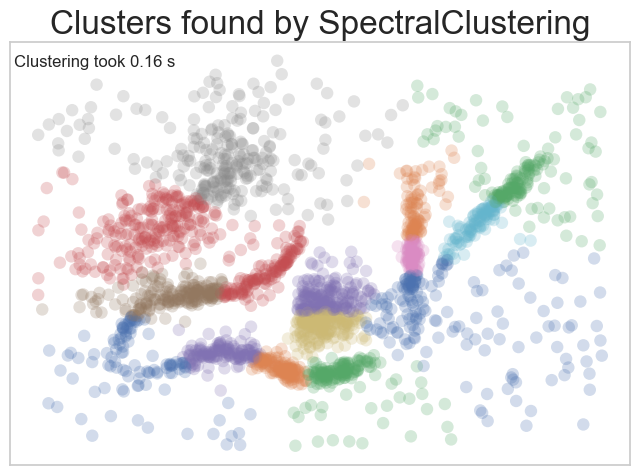

In [92]:
plot_clusters(data, cluster.SpectralClustering, (), {'n_clusters':6, 'random_state':20, 'assign_labels':'discretize', 
                                                     'n_components':15, 'affinity':'nearest_neighbors'})


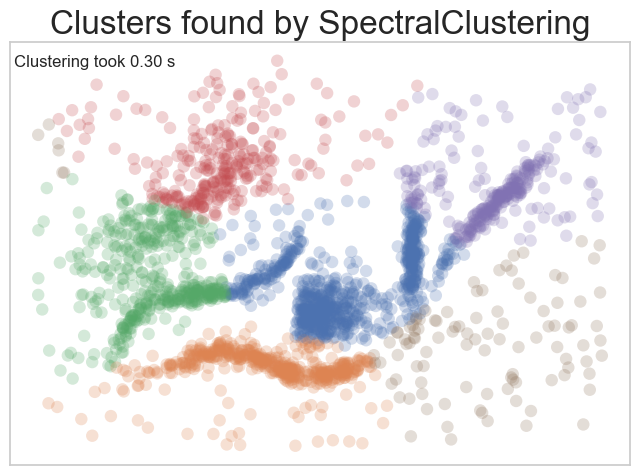

In [93]:
plot_clusters(data, cluster.SpectralClustering, (), {'n_clusters':6, 'random_state':20, 'assign_labels':'discretize', 
                                                     'n_components':6, 'affinity':'rbf'})

### 4.3 Finding the best eigen_solver, n_init, eigen_tol, degree parameter

In [94]:
# Finding the best parameters with the silhoutte and inertia score
eigen_solvers = ['arpack', 'lobpcg', 'amg']
n_inits = [10,100,1000]
eigen_tols = ['auto',0.5,1.0,1.5]
degrees = [1,3,5]

silhouette_avgs = []
parameters = list()
inertias = []

# Fit the clustering model for each preference parameter value
for eigen_solver in eigen_solvers:
    for n_init in n_inits:
        for eigen_tol in eigen_tols:
            for degree in degrees:
                spectral_clustering = cluster.SpectralClustering(n_clusters=6, random_state=20, eigen_solver=eigen_solver, 
                                                                 assign_labels='discretize', n_components=6, 
                                                                n_init=n_init, affinity='rbf', 
                                                                 eigen_tol=eigen_tol,degree=degree 
                                                                )
                spectral_clustering.fit(data)
                silhouette_avg = metrics.silhouette_score(data, spectral_clustering.labels_)
                silhouette_avgs.append(silhouette_avg)
                used_parameters = "eigen_solver: " + str(eigen_solver)+ ", " + "n_init: " + str(n_init) + ", " + "eigen_tol: " + str(eigen_tol) + ", " + "degree: " + str(degree)
                parameters.append(used_parameters)
                # Get the cluster labels and the number of clusters
                labels = spectral_clustering.labels_
                unique_labels = np.unique(labels)
                n_clusters = len(unique_labels)

                # Get the cluster centers
                cluster_centers = np.zeros((n_clusters, data.shape[1]))
                for i in range(n_clusters):
                    cluster_centers[i] = np.mean(data[labels == unique_labels[i]], axis=0)

                # Calculate the inertia score
                inertia = 0.0
                for i in range(len(data)):
                    # Calculate the distance to the nearest cluster center
                    distances = [((data[i] - center) ** 2).sum() for center in cluster_centers]
                    min_distance = min(distances)
                    # Add the squared distance to the inertia score
                    inertia += min_distance
                inertias.append(inertia)


df = pd.DataFrame(list(zip(silhouette_avgs, inertias)), index =parameters, columns =['Silhoutte_Score', 'Inertia_Score'])
df

,Silhoutte_Score,Inertia_Score
"eigen_solver: arpack, n_init: 10, eigen_tol: auto, degree: 1",0.385485,45.814302
"eigen_solver: arpack, n_init: 10, eigen_tol: auto, degree: 3",0.385485,45.814302
"eigen_solver: arpack, n_init: 10, eigen_tol: auto, degree: 5",0.385485,45.814302
"eigen_solver: arpack, n_init: 10, eigen_tol: 0.5, degree: 1",0.385485,45.814302
"eigen_solver: arpack, n_init: 10, eigen_tol: 0.5, degree: 3",0.385485,45.814302
...,...,...
"eigen_solver: amg, n_init: 1000, eigen_tol: 1.0, degree: 3",0.385485,45.814302
"eigen_solver: amg, n_init: 1000, eigen_tol: 1.0, degree: 5",0.385485,45.814302
"eigen_solver: amg, n_init: 1000, eigen_tol: 1.5, degree: 1",0.385485,45.814302
"eigen_solver: amg, n_init: 1000, eigen_tol: 1.5, degree: 3",0.385485,45.814302


In [95]:
df[df.Silhoutte_Score==df.Silhoutte_Score.max()]

,Silhoutte_Score,Inertia_Score
"eigen_solver: arpack, n_init: 10, eigen_tol: auto, degree: 1",0.385485,45.814302
"eigen_solver: arpack, n_init: 10, eigen_tol: auto, degree: 3",0.385485,45.814302
"eigen_solver: arpack, n_init: 10, eigen_tol: auto, degree: 5",0.385485,45.814302
"eigen_solver: arpack, n_init: 10, eigen_tol: 0.5, degree: 1",0.385485,45.814302
"eigen_solver: arpack, n_init: 10, eigen_tol: 0.5, degree: 3",0.385485,45.814302
...,...,...
"eigen_solver: amg, n_init: 1000, eigen_tol: 1.0, degree: 3",0.385485,45.814302
"eigen_solver: amg, n_init: 1000, eigen_tol: 1.0, degree: 5",0.385485,45.814302
"eigen_solver: amg, n_init: 1000, eigen_tol: 1.5, degree: 1",0.385485,45.814302
"eigen_solver: amg, n_init: 1000, eigen_tol: 1.5, degree: 3",0.385485,45.814302


In [96]:
# Finding the best random_state parameter with the inertia score
df[df.Inertia_Score==df.Inertia_Score.min()]

,Silhoutte_Score,Inertia_Score
"eigen_solver: arpack, n_init: 10, eigen_tol: auto, degree: 1",0.385485,45.814302
"eigen_solver: arpack, n_init: 10, eigen_tol: auto, degree: 3",0.385485,45.814302
"eigen_solver: arpack, n_init: 10, eigen_tol: auto, degree: 5",0.385485,45.814302
"eigen_solver: arpack, n_init: 10, eigen_tol: 0.5, degree: 1",0.385485,45.814302
"eigen_solver: arpack, n_init: 10, eigen_tol: 0.5, degree: 3",0.385485,45.814302
...,...,...
"eigen_solver: amg, n_init: 1000, eigen_tol: 1.0, degree: 3",0.385485,45.814302
"eigen_solver: amg, n_init: 1000, eigen_tol: 1.0, degree: 5",0.385485,45.814302
"eigen_solver: amg, n_init: 1000, eigen_tol: 1.5, degree: 1",0.385485,45.814302
"eigen_solver: amg, n_init: 1000, eigen_tol: 1.5, degree: 3",0.385485,45.814302


### 4.4 Finding the best eigen_solver, eigen_tol, degree, coef0, verbose  parameter

In [99]:
# Finding the best parameters with the silhoutte and inertia score
eigen_solvers = ['arpack', 'lobpcg', 'amg']
eigen_tols = ['auto',0.5,1.0,1.5]
degrees = [1,3,5]
coef0s = [0.5,1.0,1.5]
verboses = [True,False]

silhouette_avgs = []
parameters = list()
inertias = []

# Fit the clustering model for each preference parameter value
for eigen_solver in eigen_solvers:
        for eigen_tol in eigen_tols:
            for degree in degrees:
                for coef0 in coef0s:
                    for verbose in verboses:
                        spectral_clustering = cluster.SpectralClustering(n_clusters=6, random_state=20, eigen_solver=eigen_solver, 
                                                                         assign_labels='discretize', n_components=6, 
                                                                        n_init=10, affinity='rbf', 
                                                                         eigen_tol=eigen_tol,degree=degree, coef0=coef0, verbose=verbose  
                                                                        )
                        spectral_clustering.fit(data)
                        silhouette_avg = metrics.silhouette_score(data, spectral_clustering.labels_)
                        silhouette_avgs.append(silhouette_avg)
                        used_parameters = "eigen_solver: " + str(eigen_solver) + ", " + "eigen_tol: " + str(eigen_tol) + ", " + "degree: " + str(degree) + ", " + "coef0: " + str(coef0) + ", " + "verbose: " + str(verbose)
                        parameters.append(used_parameters)
                        # Get the cluster labels and the number of clusters
                        labels = spectral_clustering.labels_
                        unique_labels = np.unique(labels)
                        n_clusters = len(unique_labels)

                        # Get the cluster centers
                        cluster_centers = np.zeros((n_clusters, data.shape[1]))
                        for i in range(n_clusters):
                            cluster_centers[i] = np.mean(data[labels == unique_labels[i]], axis=0)

                        # Calculate the inertia score
                        inertia = 0.0
                        for i in range(len(data)):
                            # Calculate the distance to the nearest cluster center
                            distances = [((data[i] - center) ** 2).sum() for center in cluster_centers]
                            min_distance = min(distances)
                            # Add the squared distance to the inertia score
                            inertia += min_distance
                        inertias.append(inertia)


df = pd.DataFrame(list(zip(silhouette_avgs, inertias)), index =parameters, columns =['Silhoutte_Score', 'Inertia_Score'])
df

Computing label assignment using discretize
Computing label assignment using discretize
Computing label assignment using discretize
Computing label assignment using discretize
Computing label assignment using discretize
Computing label assignment using discretize
Computing label assignment using discretize
Computing label assignment using discretize
Computing label assignment using discretize
Computing label assignment using discretize
Computing label assignment using discretize
Computing label assignment using discretize
Computing label assignment using discretize
Computing label assignment using discretize
Computing label assignment using discretize
Computing label assignment using discretize
Computing label assignment using discretize
Computing label assignment using discretize
Computing label assignment using discretize
Computing label assignment using discretize
Computing label assignment using discretize
Computing label assignment using discretize
Computing label assignment using

,Silhoutte_Score,Inertia_Score
"eigen_solver: arpack, eigen_tol: auto, degree: 1, coef0: 0.5, verbose: True",0.385485,45.814302
"eigen_solver: arpack, eigen_tol: auto, degree: 1, coef0: 0.5, verbose: False",0.385485,45.814302
"eigen_solver: arpack, eigen_tol: auto, degree: 1, coef0: 1.0, verbose: True",0.385485,45.814302
"eigen_solver: arpack, eigen_tol: auto, degree: 1, coef0: 1.0, verbose: False",0.385485,45.814302
"eigen_solver: arpack, eigen_tol: auto, degree: 1, coef0: 1.5, verbose: True",0.385485,45.814302
...,...,...
"eigen_solver: amg, eigen_tol: 1.5, degree: 5, coef0: 0.5, verbose: False",0.385485,45.814302
"eigen_solver: amg, eigen_tol: 1.5, degree: 5, coef0: 1.0, verbose: True",0.385485,45.814302
"eigen_solver: amg, eigen_tol: 1.5, degree: 5, coef0: 1.0, verbose: False",0.385485,45.814302
"eigen_solver: amg, eigen_tol: 1.5, degree: 5, coef0: 1.5, verbose: True",0.385485,45.814302


In [100]:
df[df.Silhoutte_Score==df.Silhoutte_Score.max()]

,Silhoutte_Score,Inertia_Score
"eigen_solver: arpack, eigen_tol: auto, degree: 1, coef0: 0.5, verbose: True",0.385485,45.814302
"eigen_solver: arpack, eigen_tol: auto, degree: 1, coef0: 0.5, verbose: False",0.385485,45.814302
"eigen_solver: arpack, eigen_tol: auto, degree: 1, coef0: 1.0, verbose: True",0.385485,45.814302
"eigen_solver: arpack, eigen_tol: auto, degree: 1, coef0: 1.0, verbose: False",0.385485,45.814302
"eigen_solver: arpack, eigen_tol: auto, degree: 1, coef0: 1.5, verbose: True",0.385485,45.814302
...,...,...
"eigen_solver: amg, eigen_tol: 1.5, degree: 5, coef0: 0.5, verbose: False",0.385485,45.814302
"eigen_solver: amg, eigen_tol: 1.5, degree: 5, coef0: 1.0, verbose: True",0.385485,45.814302
"eigen_solver: amg, eigen_tol: 1.5, degree: 5, coef0: 1.0, verbose: False",0.385485,45.814302
"eigen_solver: amg, eigen_tol: 1.5, degree: 5, coef0: 1.5, verbose: True",0.385485,45.814302


In [101]:
# Finding the best random_state parameter with the inertia score
df[df.Inertia_Score==df.Inertia_Score.min()]

,Silhoutte_Score,Inertia_Score
"eigen_solver: arpack, eigen_tol: auto, degree: 1, coef0: 0.5, verbose: True",0.385485,45.814302
"eigen_solver: arpack, eigen_tol: auto, degree: 1, coef0: 0.5, verbose: False",0.385485,45.814302
"eigen_solver: arpack, eigen_tol: auto, degree: 1, coef0: 1.0, verbose: True",0.385485,45.814302
"eigen_solver: arpack, eigen_tol: auto, degree: 1, coef0: 1.0, verbose: False",0.385485,45.814302
"eigen_solver: arpack, eigen_tol: auto, degree: 1, coef0: 1.5, verbose: True",0.385485,45.814302
...,...,...
"eigen_solver: amg, eigen_tol: 1.5, degree: 5, coef0: 0.5, verbose: False",0.385485,45.814302
"eigen_solver: amg, eigen_tol: 1.5, degree: 5, coef0: 1.0, verbose: True",0.385485,45.814302
"eigen_solver: amg, eigen_tol: 1.5, degree: 5, coef0: 1.0, verbose: False",0.385485,45.814302
"eigen_solver: amg, eigen_tol: 1.5, degree: 5, coef0: 1.5, verbose: True",0.385485,45.814302


### 4.5 Final

In [102]:
spectral_clustering = cluster.SpectralClustering(n_clusters=6, random_state=20, eigen_solver=None, n_components=None, 
                                                 assign_labels='discretize', gamma=1.0, n_neighbors=10, 
                                                n_init=10, affinity='rbf', kernel_params=None, n_jobs=None,
                                                 eigen_tol='auto',degree=3, coef0=1, verbose=False  
                                                )
spectral_clustering.fit(data)
metrics.silhouette_score(data, spectral_clustering.labels_)

0.3854852938010052

In [103]:
spectral_clustering = cluster.SpectralClustering(n_clusters=6, random_state=20, eigen_solver=None, n_components=None, 
                                                 assign_labels='discretize', gamma=1.0, n_neighbors=10, 
                                                n_init=10, affinity='rbf', kernel_params=None, n_jobs=None,
                                                 eigen_tol='auto',degree=3, coef0=1, verbose=False  
                                                )
spectral_clustering.fit(data)
# Get the cluster labels and the number of clusters
labels = spectral_clustering.labels_
unique_labels = np.unique(labels)
n_clusters = len(unique_labels)

# Get the cluster centers
cluster_centers = np.zeros((n_clusters, data.shape[1]))
for i in range(n_clusters):
    cluster_centers[i] = np.mean(data[labels == unique_labels[i]], axis=0)

# Calculate the inertia score
inertia = 0.0
for i in range(len(data)):
    # Calculate the distance to the nearest cluster center
    distances = [((data[i] - center) ** 2).sum() for center in cluster_centers]
    min_distance = min(distances)
    # Add the squared distance to the inertia score
    inertia += min_distance
inertia

45.81430215167014

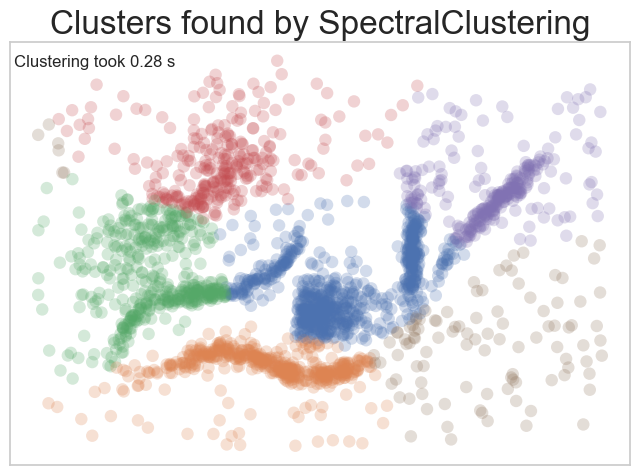

In [104]:
plot_clusters(data, cluster.SpectralClustering, (), {'n_clusters':6, 'random_state':20, 'eigen_solver':None, 
                                                    'n_components':None, 'assign_labels':'discretize', 'gamma':1.0, 
                                                    'n_neighbors':10, 'n_init':10, 'affinity':'rbf', 
                                                     'kernel_params':None, 'n_jobs':None, 'eigen_tol':'auto', 
                                                     'degree':3, 'coef0':1, 'verbose':False})

## 5. Agglomerative Clustering

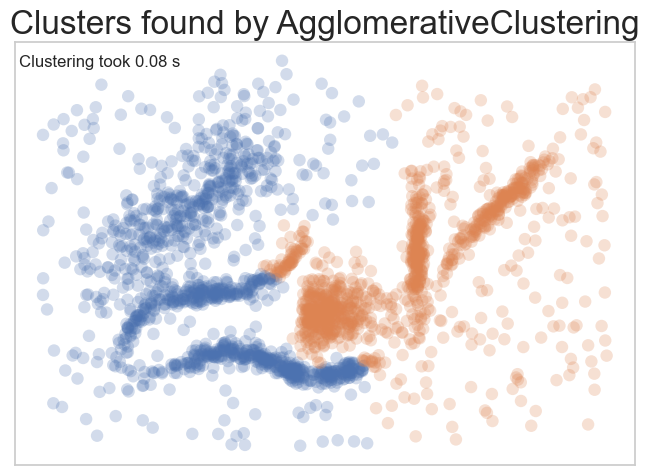

In [105]:
plot_clusters(data, cluster.AgglomerativeClustering, (), {})

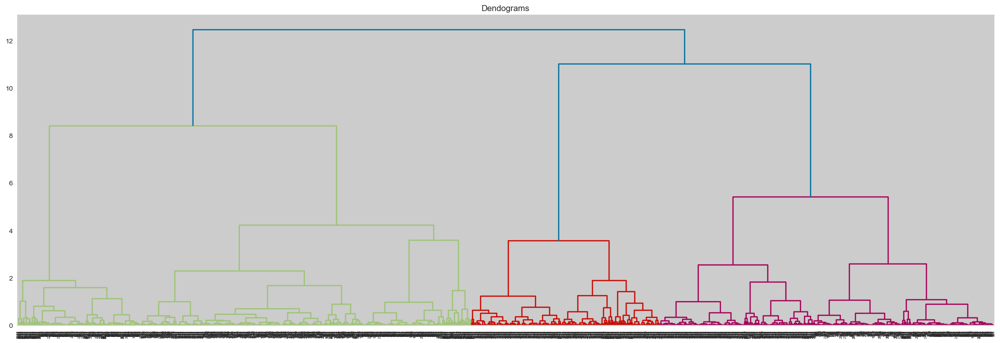

In [106]:
plt.figure(figsize=(25, 8))
plt.title("Dendograms")
dend = shc.dendrogram(shc.linkage(data, method='ward'))

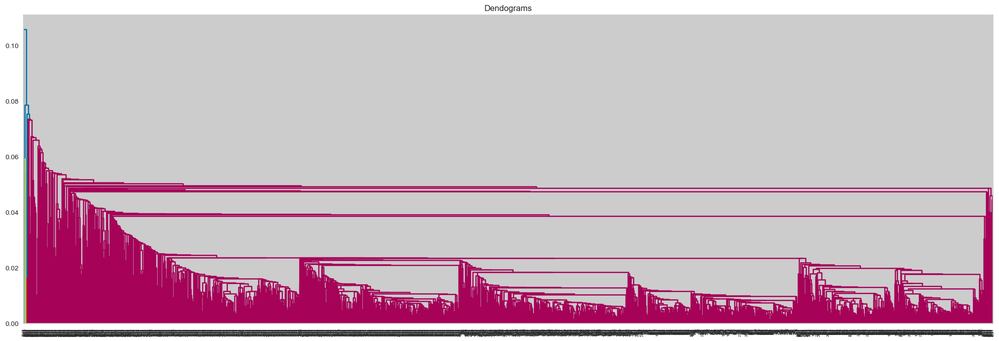

In [107]:
plt.figure(figsize=(25, 8))
plt.title("Dendograms")
dend2 = shc.dendrogram(shc.linkage(data, method='single'))

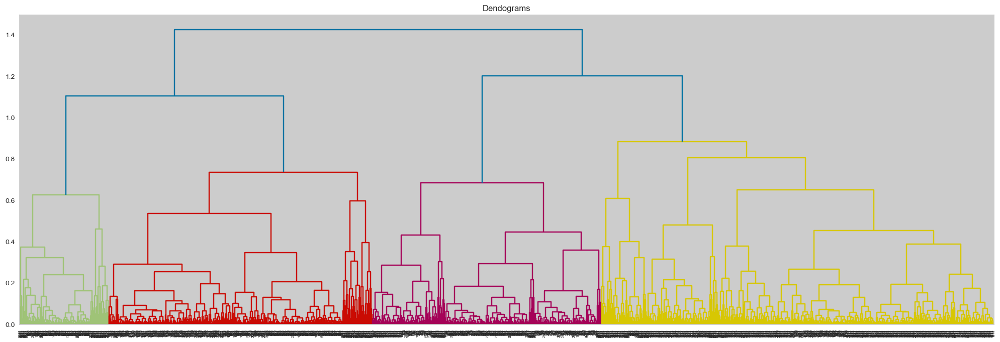

In [108]:
plt.figure(figsize=(25, 8))
plt.title("Dendograms")
dend3 = shc.dendrogram(shc.linkage(data, method='complete'))

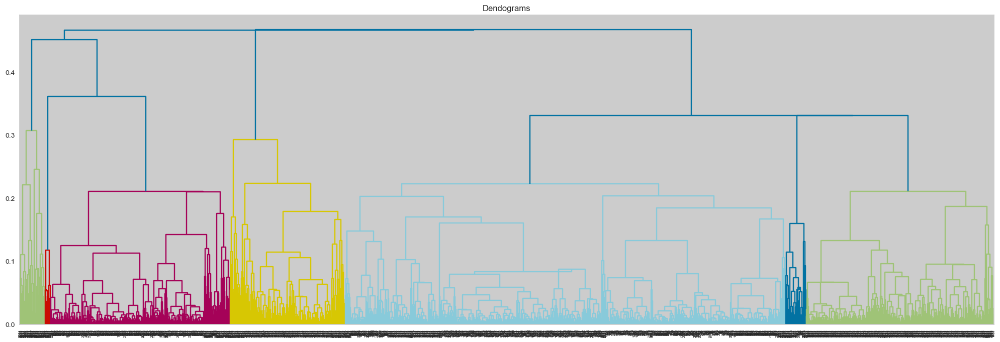

In [109]:
plt.figure(figsize=(25, 8))
plt.title("Dendograms")
dend4 = shc.dendrogram(shc.linkage(data, method='centroid'))

### 5.1 Finding the best parameters

In [110]:
# Finding the best parameters with the silhoutte score
linkages = ['ward', 'complete', 'average', 'single']
connectivity_func = lambda data: kneighbors_graph(data, 5, mode='connectivity', include_self=True)
connectivities = [None, connectivity_func]
compute_full_trees = ['auto', True, False]
compute_distancess = [True, False]

silhouette_avgs = []
parameters = list()
inertias = []

# Fit the clustering model for each preference parameter value
for linkage in linkages:
    for connectivity in connectivities:
        for compute_full_tree in compute_full_trees:
            for compute_distances in compute_distancess:

                agglomerative_clustering = cluster.AgglomerativeClustering(n_clusters=6, linkage=linkage, 
                                                                           connectivity=connectivity,
                                                                           compute_full_tree=compute_full_tree,
                                                                           compute_distances=compute_distances
                                                                )
                agglomerative_clustering.fit(data)
                silhouette_avg = metrics.silhouette_score(data, agglomerative_clustering.labels_)
                silhouette_avgs.append(silhouette_avg)
                used_parameters = "linkage: " + str(linkage) + ", " + "connectivity: " + str(connectivity) + ", " + "compute_full_tree: " + str(compute_full_tree) + ", " + "compute_distances: " + str(compute_distances)
                parameters.append(used_parameters)
                # Get the cluster labels and the number of clusters
                labels = agglomerative_clustering.labels_
                unique_labels = np.unique(labels)
                n_clusters = len(unique_labels)

                # Get the cluster centers
                cluster_centers = np.zeros((n_clusters, data.shape[1]))
                for i in range(n_clusters):
                    cluster_centers[i] = np.mean(data[labels == unique_labels[i]], axis=0)

                # Calculate the inertia score
                inertia = 0.0
                for i in range(len(data)):
                    # Calculate the distance to the nearest cluster center
                    distances = [((data[i] - center) ** 2).sum() for center in cluster_centers]
                    min_distance = min(distances)
                    # Add the squared distance to the inertia score
                    inertia += min_distance
                inertias.append(inertia)


df = pd.DataFrame(list(zip(silhouette_avgs, inertias)), index =parameters, columns =['Silhoutte_Score', 'Inertia_Score'])
df

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_agglomerative.py:282: UserWarning: the number of connected components of the connectivity matrix is 2 > 1. Completing it to avoid stopping the tree early.
  connectivity, n_connected_components = _fix_connectivity(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_agglomerative.py:282: UserWarning: the number of connected components of the connectivity matrix is 2 > 1. Completing it to avoid stopping the tree early.
  connectivity, n_connected_components = _fix_connectivity(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_agglomerative.py:282: UserWarning: the number of connected components of the connectivity matrix is 2 > 1. Completing it to avoid stopping the tree early.
  connectivity, n_connected_components = _fix_connectivity(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_agglomerative.py:282: UserWarni

,Silhoutte_Score,Inertia_Score
"linkage: ward, connectivity: None, compute_full_tree: auto, compute_distances: True",0.381890,44.433125
"linkage: ward, connectivity: None, compute_full_tree: auto, compute_distances: False",0.381890,44.433125
"linkage: ward, connectivity: None, compute_full_tree: True, compute_distances: True",0.381890,44.433125
"linkage: ward, connectivity: None, compute_full_tree: True, compute_distances: False",0.381890,44.433125
"linkage: ward, connectivity: None, compute_full_tree: False, compute_distances: True",0.381890,44.433125
"linkage: ward, connectivity: None, compute_full_tree: False, compute_distances: False",0.381890,44.433125
"linkage: ward, connectivity: <function <lambda> at 0x7fb140e0aca0>, compute_full_tree: auto, compute_distances: True",0.389069,47.715953
"linkage: ward, connectivity: <function <lambda> at 0x7fb140e0aca0>, compute_full_tree: auto, compute_distances: False",0.389069,47.715953
"linkage: ward, connectivity: <function <lambda> at 0x7fb140e0aca0>, compute_full_tree: True, compute_distances: True",0.389069,47.715953
"linkage: ward, connectivity: <function <lambda> at 0x7fb140e0aca0>, compute_full_tree: True, compute_distances: False",0.389069,47.715953


In [111]:
df[df.Silhoutte_Score==df.Silhoutte_Score.max()]

,Silhoutte_Score,Inertia_Score
"linkage: ward, connectivity: <function <lambda> at 0x7fb140e0aca0>, compute_full_tree: auto, compute_distances: True",0.389069,47.715953
"linkage: ward, connectivity: <function <lambda> at 0x7fb140e0aca0>, compute_full_tree: auto, compute_distances: False",0.389069,47.715953
"linkage: ward, connectivity: <function <lambda> at 0x7fb140e0aca0>, compute_full_tree: True, compute_distances: True",0.389069,47.715953
"linkage: ward, connectivity: <function <lambda> at 0x7fb140e0aca0>, compute_full_tree: True, compute_distances: False",0.389069,47.715953
"linkage: ward, connectivity: <function <lambda> at 0x7fb140e0aca0>, compute_full_tree: False, compute_distances: True",0.389069,47.715953
"linkage: ward, connectivity: <function <lambda> at 0x7fb140e0aca0>, compute_full_tree: False, compute_distances: False",0.389069,47.715953


In [112]:
df[df.Inertia_Score==df.Inertia_Score.min()]

,Silhoutte_Score,Inertia_Score
"linkage: ward, connectivity: None, compute_full_tree: auto, compute_distances: True",0.38189,44.433125
"linkage: ward, connectivity: None, compute_full_tree: auto, compute_distances: False",0.38189,44.433125
"linkage: ward, connectivity: None, compute_full_tree: True, compute_distances: True",0.38189,44.433125
"linkage: ward, connectivity: None, compute_full_tree: True, compute_distances: False",0.38189,44.433125
"linkage: ward, connectivity: None, compute_full_tree: False, compute_distances: True",0.38189,44.433125
"linkage: ward, connectivity: None, compute_full_tree: False, compute_distances: False",0.38189,44.433125


/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_agglomerative.py:282: UserWarning: the number of connected components of the connectivity matrix is 2 > 1. Completing it to avoid stopping the tree early.
  connectivity, n_connected_components = _fix_connectivity(


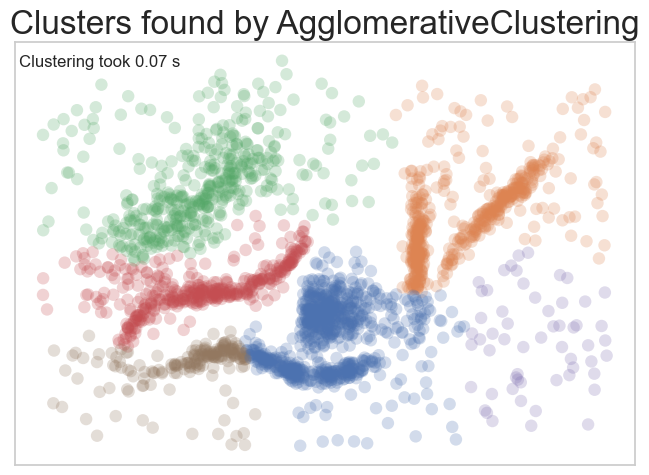

In [113]:
connectivity_func = lambda data: kneighbors_graph(data, 5, mode='connectivity', include_self=True)
plot_clusters(data, cluster.AgglomerativeClustering, (), {'n_clusters':6, 'linkage':'ward', 
                                                          'connectivity':connectivity_func, 'affinity':'euclidean', 
                                                         'metric':None, 'memory':None, 'compute_full_tree':'auto', 
                                                         'distance_threshold':None, 'compute_distances':True})

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


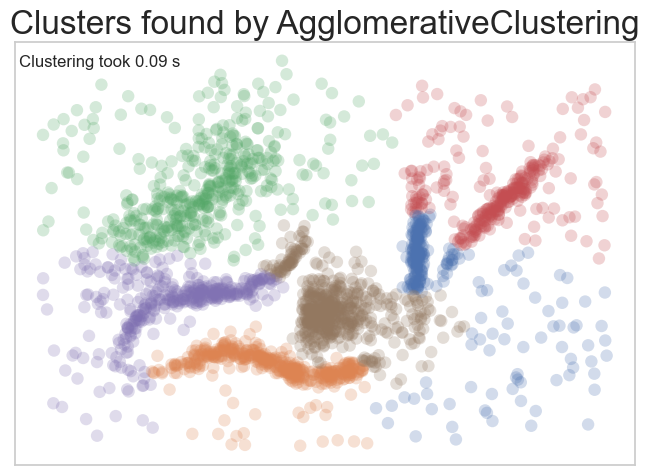

In [114]:
plot_clusters(data, cluster.AgglomerativeClustering, (), {'n_clusters':6, 'linkage':'ward', 
                                                          'connectivity':None, 'affinity':'euclidean', 
                                                         'metric':None, 'memory':None, 'compute_full_tree':'auto', 
                                                         'distance_threshold':None, 'compute_distances':True})

### 5.2 Final

In [115]:
connectivity_func = lambda data: kneighbors_graph(data, 5, mode='connectivity', include_self=True)
agglomerative_clustering = cluster.AgglomerativeClustering(n_clusters=6, linkage='ward', 
                                                           connectivity=connectivity_func, affinity='euclidean', 
                                                         metric=None, memory=None, compute_full_tree='auto', 
                                                         distance_threshold=None, compute_distances=True
                                                )
agglomerative_clustering.fit(data)
metrics.silhouette_score(data, agglomerative_clustering.labels_)

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_agglomerative.py:282: UserWarning: the number of connected components of the connectivity matrix is 2 > 1. Completing it to avoid stopping the tree early.
  connectivity, n_connected_components = _fix_connectivity(


0.3890692635583223

In [116]:
connectivity_func = lambda data: kneighbors_graph(data, 5, mode='connectivity', include_self=True)
agglomerative_clustering = cluster.AgglomerativeClustering(n_clusters=6, linkage='ward', 
                                                           connectivity=connectivity_func, affinity='euclidean', 
                                                         metric=None, memory=None, compute_full_tree='auto', 
                                                         distance_threshold=None, compute_distances=True
                                                )
agglomerative_clustering.fit(data)
# Get the cluster labels and the number of clusters
labels = agglomerative_clustering.labels_
unique_labels = np.unique(labels)
n_clusters = len(unique_labels)

# Get the cluster centers
cluster_centers = np.zeros((n_clusters, data.shape[1]))
for i in range(n_clusters):
    cluster_centers[i] = np.mean(data[labels == unique_labels[i]], axis=0)

# Calculate the inertia score
inertia = 0.0
for i in range(len(data)):
    # Calculate the distance to the nearest cluster center
    distances = [((data[i] - center) ** 2).sum() for center in cluster_centers]
    min_distance = min(distances)
    # Add the squared distance to the inertia score
    inertia += min_distance
inertia

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_agglomerative.py:282: UserWarning: the number of connected components of the connectivity matrix is 2 > 1. Completing it to avoid stopping the tree early.
  connectivity, n_connected_components = _fix_connectivity(


47.71595274617942

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_agglomerative.py:282: UserWarning: the number of connected components of the connectivity matrix is 2 > 1. Completing it to avoid stopping the tree early.
  connectivity, n_connected_components = _fix_connectivity(


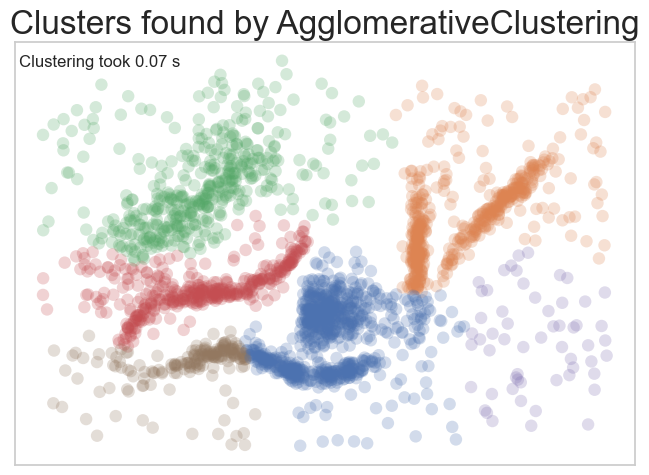

In [117]:
connectivity_func = lambda data: kneighbors_graph(data, 5, mode='connectivity', include_self=True)
plot_clusters(data, cluster.AgglomerativeClustering, (), {'n_clusters':6, 'linkage':'ward', 
                                                          'connectivity':connectivity_func, 'affinity':'euclidean', 
                                                         'metric':None, 'memory':None, 'compute_full_tree':'auto', 
                                                         'distance_threshold':None, 'compute_distances':True})

## 6. HDBSCAN

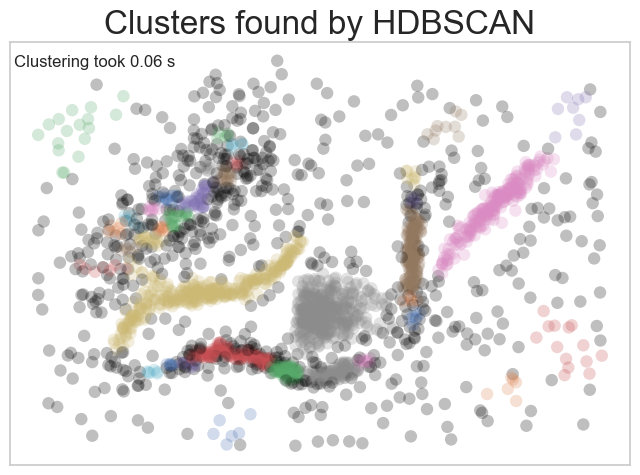

In [118]:
plot_clusters(data, hdbscan.HDBSCAN, (), {})

### 6.1 Finding the best min_cluster_sizes parameter

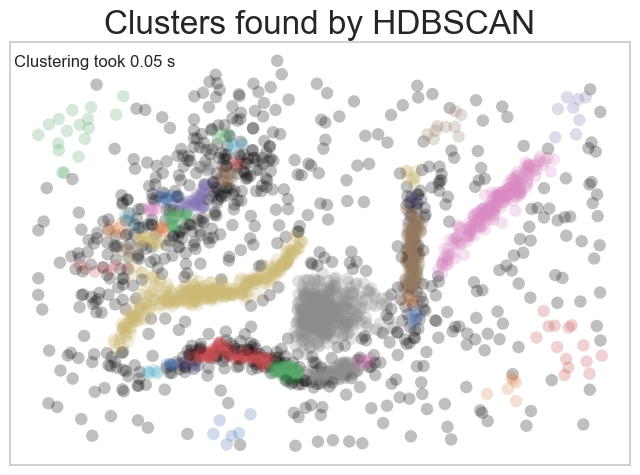

In [127]:
plot_clusters(data, hdbscan.HDBSCAN, (), {'min_cluster_size':5})

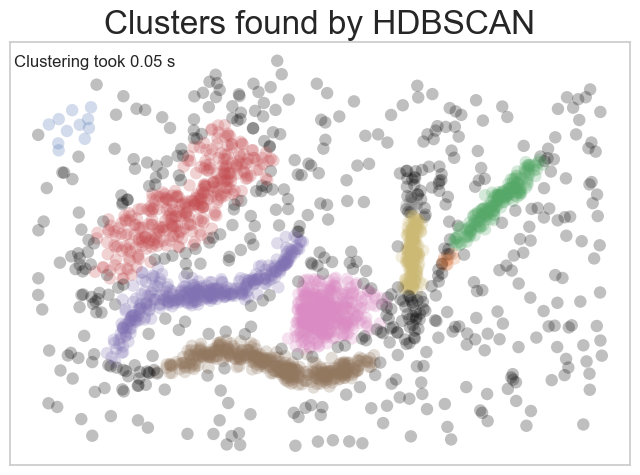

In [128]:
plot_clusters(data, hdbscan.HDBSCAN, (), {'min_cluster_size':10})

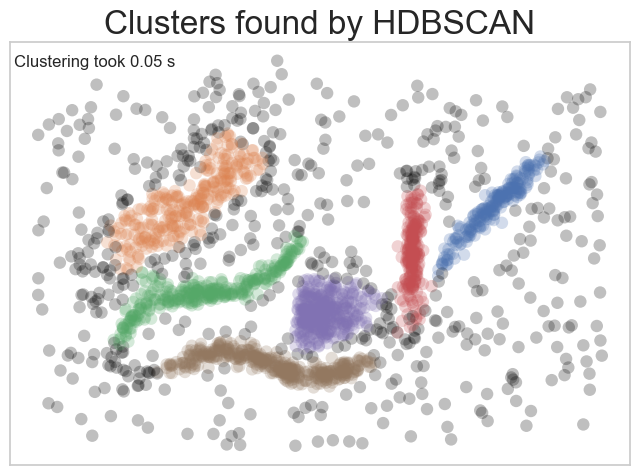

In [129]:
plot_clusters(data, hdbscan.HDBSCAN, (), {'min_cluster_size':15})

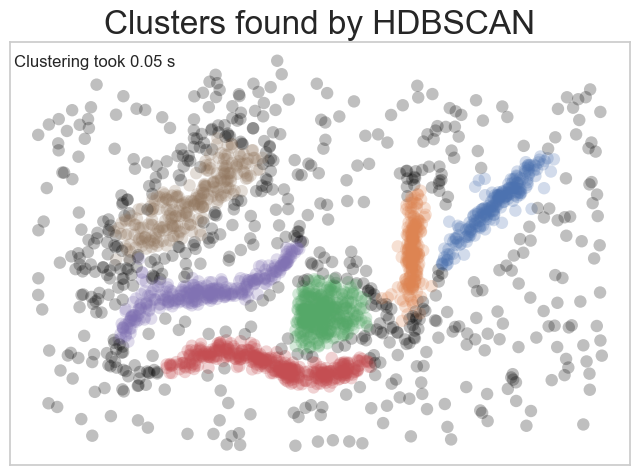

In [130]:
plot_clusters(data, hdbscan.HDBSCAN, (), {'min_cluster_size':20})

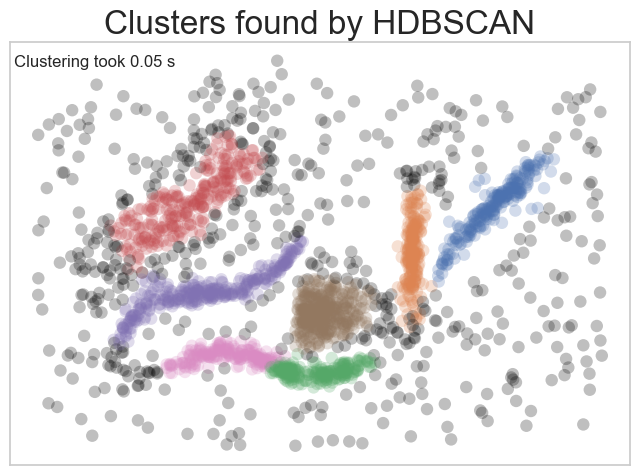

In [131]:
plot_clusters(data, hdbscan.HDBSCAN, (), {'min_cluster_size':16})

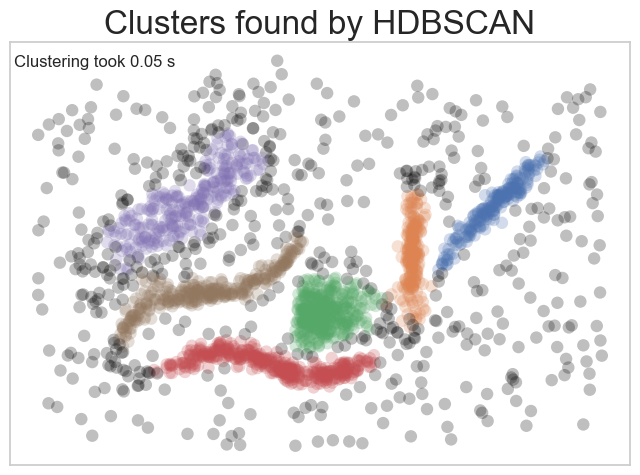

In [132]:
plot_clusters(data, hdbscan.HDBSCAN, (), {'min_cluster_size':14})

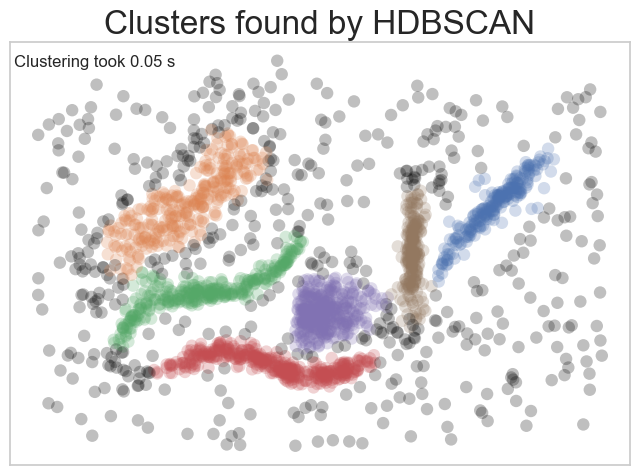

In [133]:
plot_clusters(data, hdbscan.HDBSCAN, (), {'min_cluster_size':13})

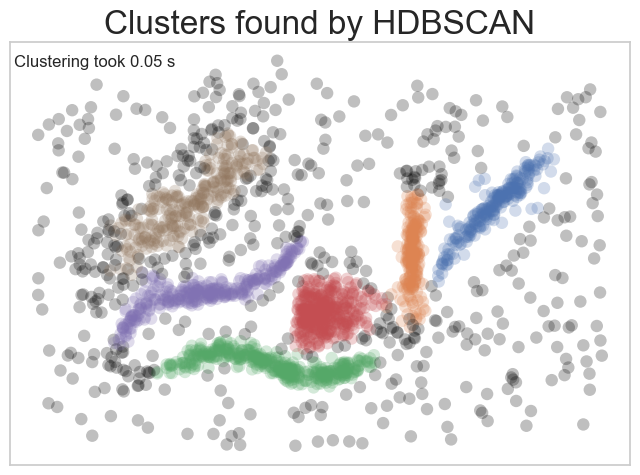

In [134]:
plot_clusters(data, hdbscan.HDBSCAN, (), {'min_cluster_size':12})

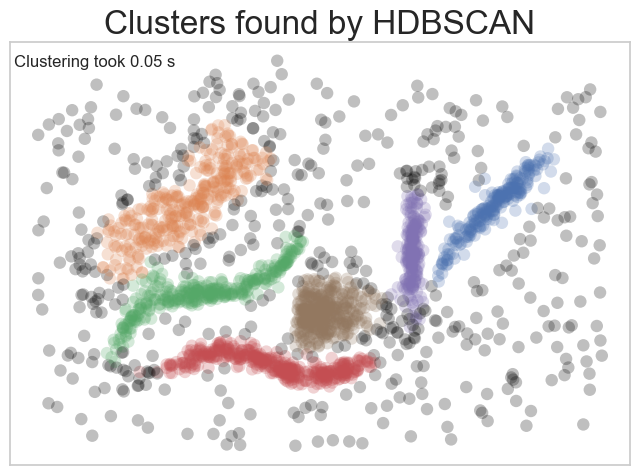

In [135]:
plot_clusters(data, hdbscan.HDBSCAN, (), {'min_cluster_size':11})

### 6.1 Finding the min_samples, best cluster_selection_method parameter

In [136]:
# Finding the best parameters with the silhoutte score
min_sampless = np.arange(1, 501, 1)
cluster_selection_methods = ['eom', 'leaf']

parameters = list()
clusters_list = list()
silhoutte_list = list()
inertias = list()

# Fit the clustering model for each preference parameter value
for min_samples in min_sampless:
    for cluster_selection_method in cluster_selection_methods:
        try:
            # Fit HDBSCAN model
            clusterer = hdbscan.HDBSCAN(min_cluster_size=11, cluster_selection_method=cluster_selection_method, 
                                        min_samples=min_samples)
            clusterer.fit(data)

            # Get cluster labels
            labels = clusterer.labels_

            # Print number of clusters
            num_clusters = len(set(labels)) - (1 if -1 in labels else 0)  # Subtract one for the noise label


            used_parameters = "min_samples: " + str(min_samples) + ", " + "cluster_selection_method: " + str(cluster_selection_method)


            # Calculate silhouette score
            labels = clusterer.labels_
            if -1 in labels:
                # exclude noise points from silhouette score calculation
                silhouette = metrics.silhouette_score(data[labels != -1], labels[labels != -1])
            else:
                silhouette = metrics.silhouette_score(data, labels)


            # Calculate cluster persistence
            persistence = clusterer.cluster_persistence_

            # Calculate a variant of inertia score
            inertia_score = np.sum(persistence[persistence > 0])

            clusters_list.append(num_clusters)
            parameters.append(used_parameters)
            silhoutte_list.append(silhouette)
            inertias.append(inertia_score)

        except:
            pass

df = pd.DataFrame(list(zip(clusters_list, silhoutte_list, inertias)), index =parameters, columns =['Clusters_Number', 'Silhoutte_Score', 'Inertia_Score'])
df


,Clusters_Number,Silhoutte_Score,Inertia_Score
"min_samples: 1, cluster_selection_method: eom",41,0.353754,4.432899
"min_samples: 1, cluster_selection_method: leaf",69,0.446446,6.538644
"min_samples: 2, cluster_selection_method: eom",36,0.380606,3.594191
"min_samples: 2, cluster_selection_method: leaf",61,0.473090,5.416796
"min_samples: 3, cluster_selection_method: eom",19,0.353645,1.658845
...,...,...,...
"min_samples: 348, cluster_selection_method: leaf",2,0.542901,0.167181
"min_samples: 349, cluster_selection_method: eom",2,0.556584,0.167196
"min_samples: 349, cluster_selection_method: leaf",2,0.556584,0.167196
"min_samples: 350, cluster_selection_method: eom",2,0.543809,0.167725


In [137]:
df[df.Clusters_Number==6].sort_values(by=['Silhoutte_Score'])

,Clusters_Number,Silhoutte_Score,Inertia_Score
"min_samples: 11, cluster_selection_method: eom",6,0.445882,1.371260
"min_samples: 13, cluster_selection_method: eom",6,0.449023,1.385212
"min_samples: 25, cluster_selection_method: eom",6,0.453600,1.253605
"min_samples: 12, cluster_selection_method: eom",6,0.454940,1.344829
"min_samples: 15, cluster_selection_method: eom",6,0.456896,1.256015
...,...,...,...
"min_samples: 134, cluster_selection_method: leaf",6,0.704098,0.396253
"min_samples: 136, cluster_selection_method: eom",6,0.705726,0.379147
"min_samples: 136, cluster_selection_method: leaf",6,0.705726,0.379147
"min_samples: 135, cluster_selection_method: leaf",6,0.706158,0.386817


In [138]:
df[df.Clusters_Number==6].sort_values(by=['Inertia_Score'])

,Clusters_Number,Silhoutte_Score,Inertia_Score
"min_samples: 136, cluster_selection_method: leaf",6,0.705726,0.379147
"min_samples: 136, cluster_selection_method: eom",6,0.705726,0.379147
"min_samples: 135, cluster_selection_method: eom",6,0.706158,0.386817
"min_samples: 135, cluster_selection_method: leaf",6,0.706158,0.386817
"min_samples: 134, cluster_selection_method: eom",6,0.704098,0.396253
...,...,...,...
"min_samples: 19, cluster_selection_method: eom",6,0.478212,1.315350
"min_samples: 35, cluster_selection_method: eom",6,0.479459,1.328972
"min_samples: 12, cluster_selection_method: eom",6,0.454940,1.344829
"min_samples: 11, cluster_selection_method: eom",6,0.445882,1.371260


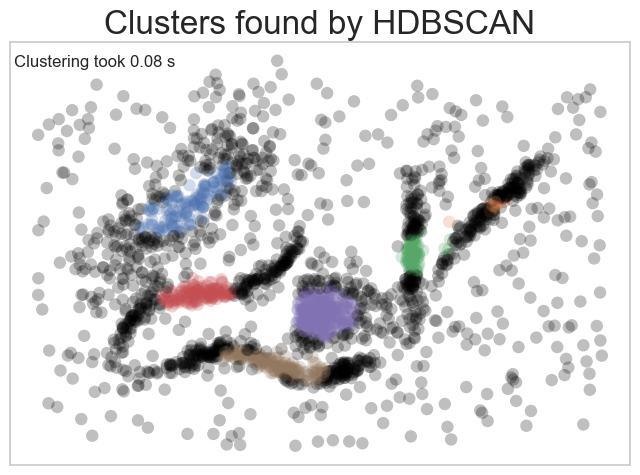

In [141]:
plot_clusters(data, hdbscan.HDBSCAN, (), {'min_cluster_size':11, 'min_samples':135, 'cluster_selection_method':'eom'})

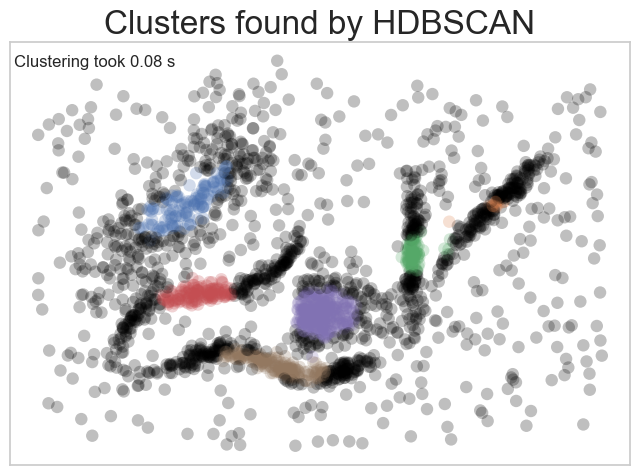

In [142]:
plot_clusters(data, hdbscan.HDBSCAN, (), {'min_cluster_size':11, 'min_samples':136, 'cluster_selection_method':'leaf'})

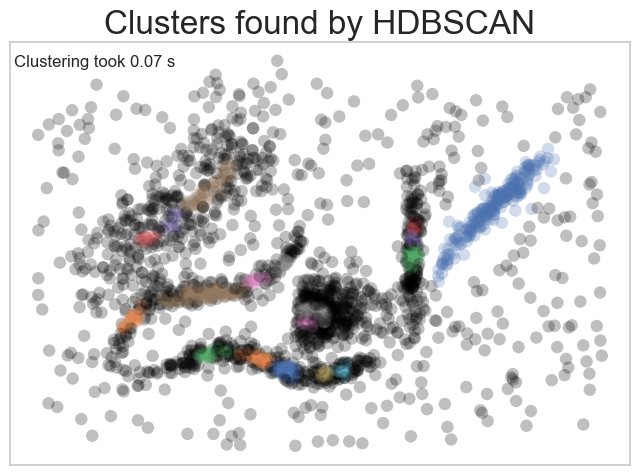

In [143]:
plot_clusters(data, hdbscan.HDBSCAN, (), {'min_cluster_size':11,'cluster_selection_method':'leaf'})


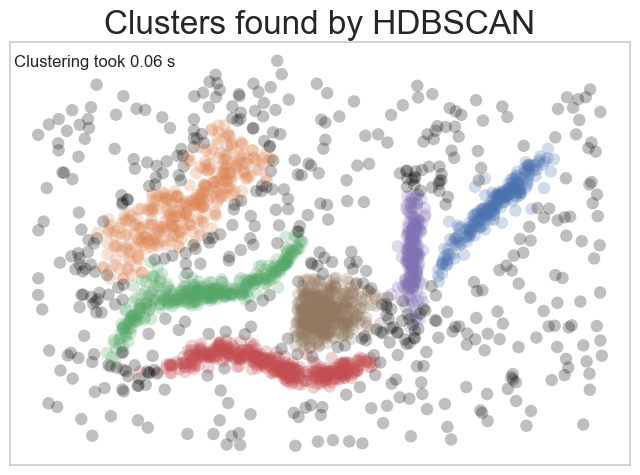

In [144]:
plot_clusters(data, hdbscan.HDBSCAN, (), {'min_cluster_size':11,'cluster_selection_method':'eom'})


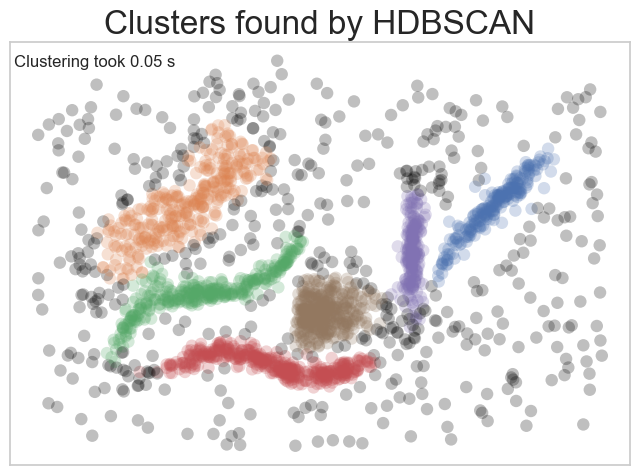

In [146]:
plot_clusters(data, hdbscan.HDBSCAN, (), {'min_cluster_size':11,'cluster_selection_method':'eom', 'min_samples':11})


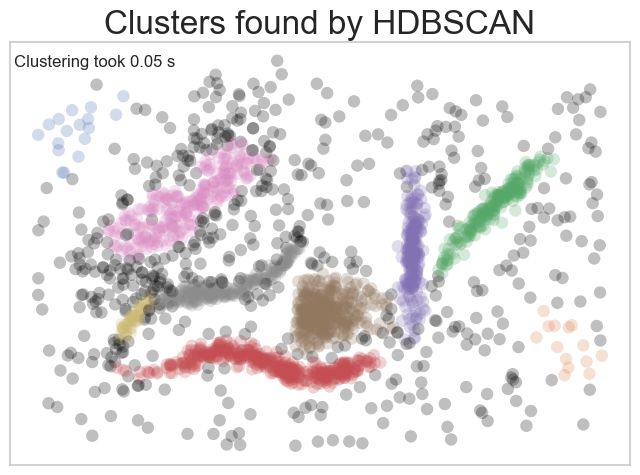

In [147]:
plot_clusters(data, hdbscan.HDBSCAN, (), {'min_cluster_size':11,'cluster_selection_method':'eom', 'min_samples':5})


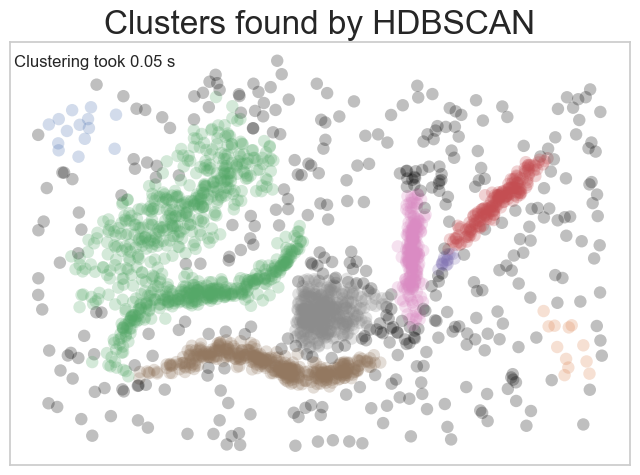

In [155]:
plot_clusters(data, hdbscan.HDBSCAN, (), {'min_cluster_size':11,'cluster_selection_method':'eom', 'min_samples':6})


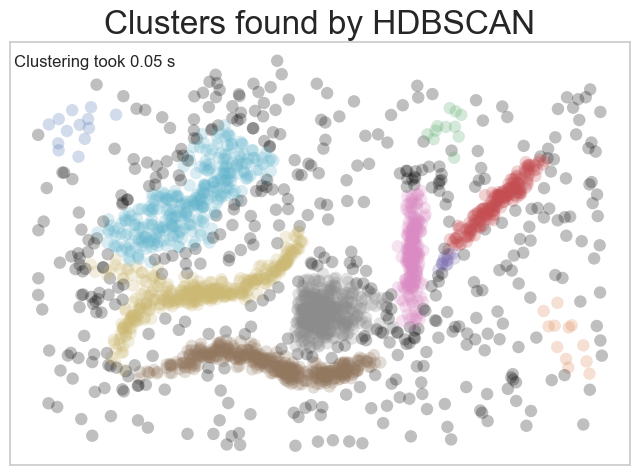

In [156]:
plot_clusters(data, hdbscan.HDBSCAN, (), {'min_cluster_size':11,'cluster_selection_method':'eom', 'min_samples':7})


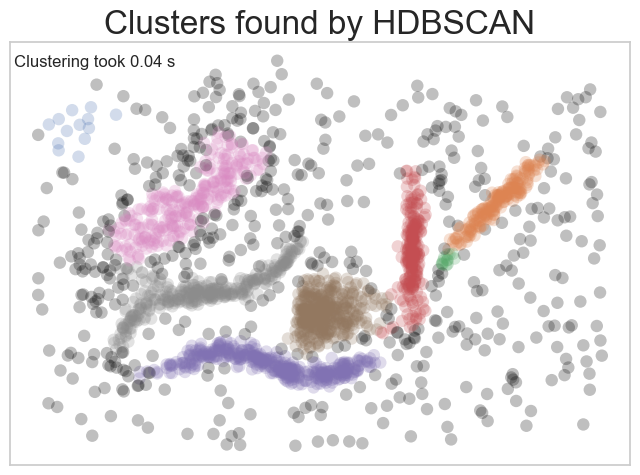

In [157]:
plot_clusters(data, hdbscan.HDBSCAN, (), {'min_cluster_size':11,'cluster_selection_method':'eom', 'min_samples':8})


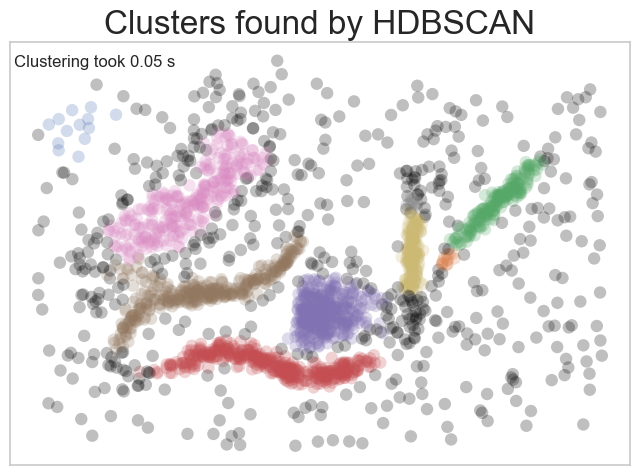

In [158]:
plot_clusters(data, hdbscan.HDBSCAN, (), {'min_cluster_size':11,'cluster_selection_method':'eom', 'min_samples':9})


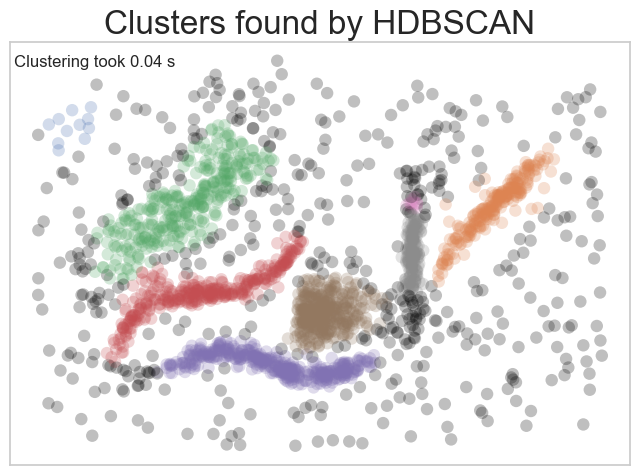

In [161]:
plot_clusters(data, hdbscan.HDBSCAN, (), {'min_cluster_size':11,'cluster_selection_method':'eom', 'min_samples':10})


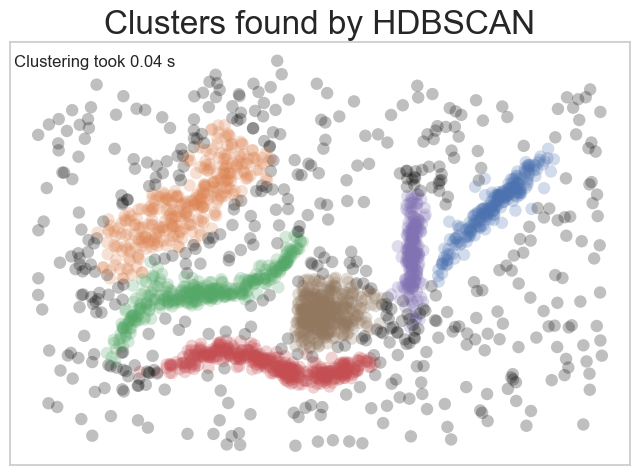

In [162]:
plot_clusters(data, hdbscan.HDBSCAN, (), {'min_cluster_size':11,'cluster_selection_method':'eom', 'min_samples':11})


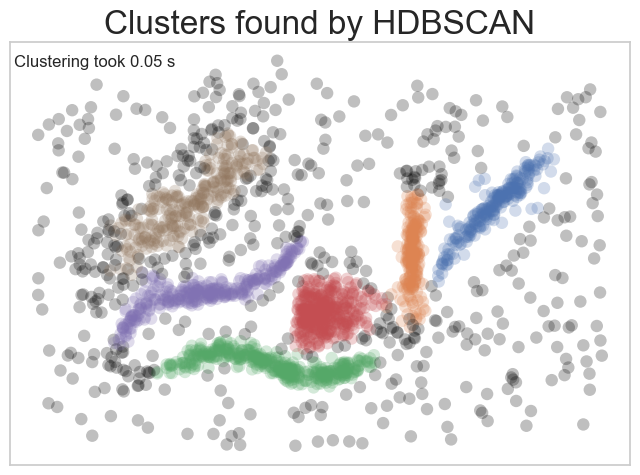

In [163]:
plot_clusters(data, hdbscan.HDBSCAN, (), {'min_cluster_size':11,'cluster_selection_method':'eom', 'min_samples':12})


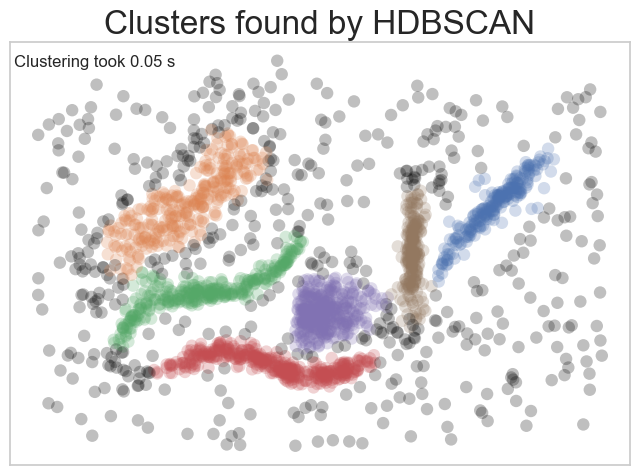

In [164]:
plot_clusters(data, hdbscan.HDBSCAN, (), {'min_cluster_size':11,'cluster_selection_method':'eom', 'min_samples':13})


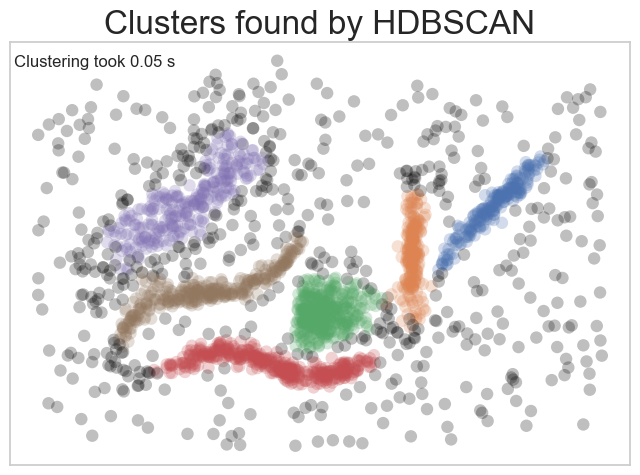

In [165]:
plot_clusters(data, hdbscan.HDBSCAN, (), {'min_cluster_size':11,'cluster_selection_method':'eom', 'min_samples':14})


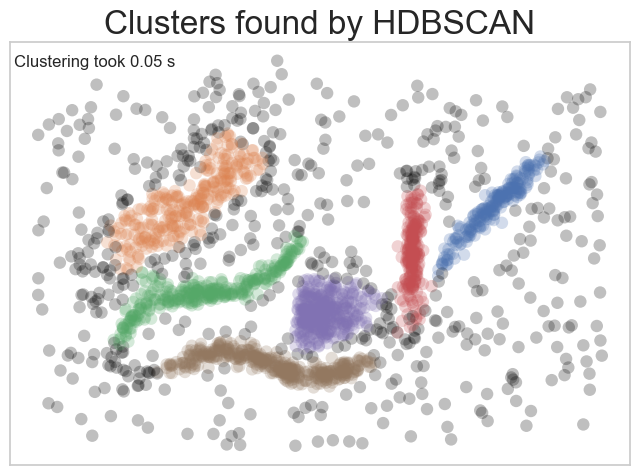

In [167]:
plot_clusters(data, hdbscan.HDBSCAN, (), {'min_cluster_size':11,'cluster_selection_method':'eom', 'min_samples':15})


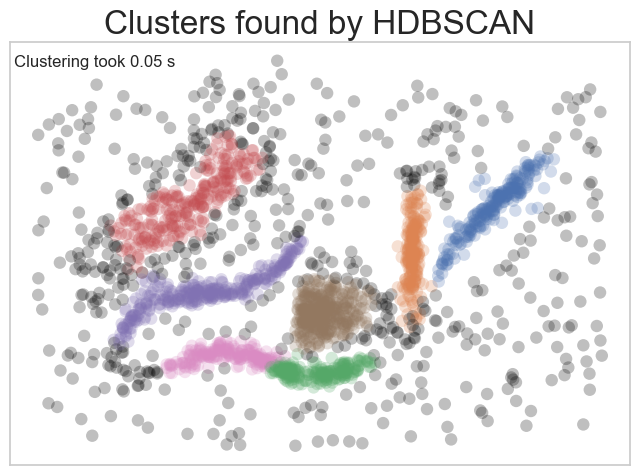

In [169]:
plot_clusters(data, hdbscan.HDBSCAN, (), {'min_cluster_size':11,'cluster_selection_method':'eom', 'min_samples':16})


### 6.3 Finding the best cluster_selection_epsilon parameter

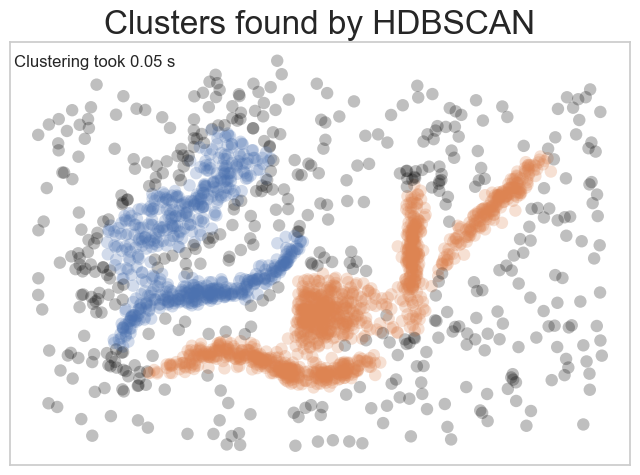

In [170]:
plot_clusters(data, hdbscan.HDBSCAN, (), {'min_cluster_size':11,'cluster_selection_method':'eom', 'min_samples':15, 
                                         'cluster_selection_epsilon':0.1})


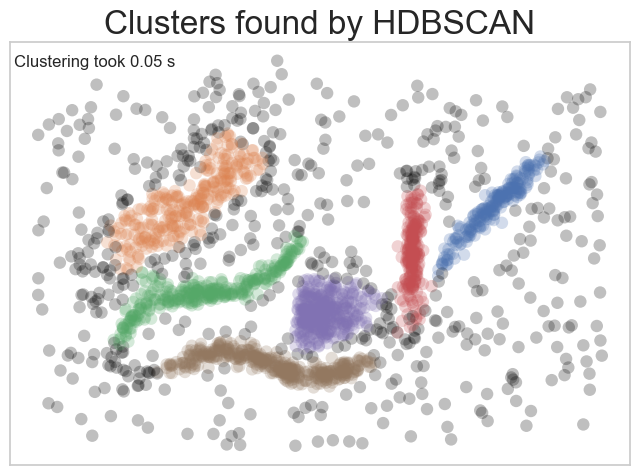

In [171]:
plot_clusters(data, hdbscan.HDBSCAN, (), {'min_cluster_size':11,'cluster_selection_method':'eom', 'min_samples':15, 
                                         'cluster_selection_epsilon':0.01})


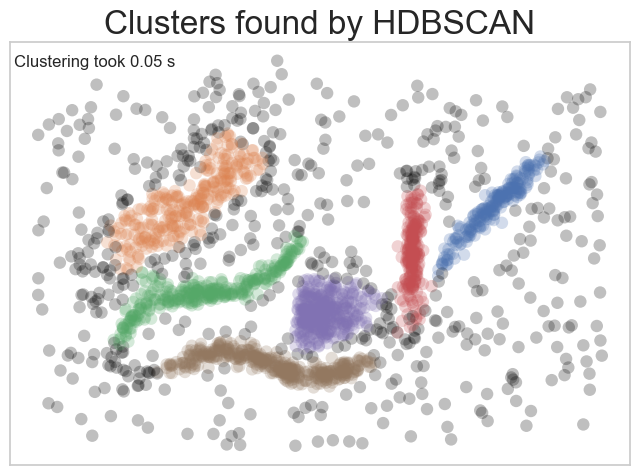

In [172]:
plot_clusters(data, hdbscan.HDBSCAN, (), {'min_cluster_size':11,'cluster_selection_method':'eom', 'min_samples':15, 
                                         'cluster_selection_epsilon':0.001})


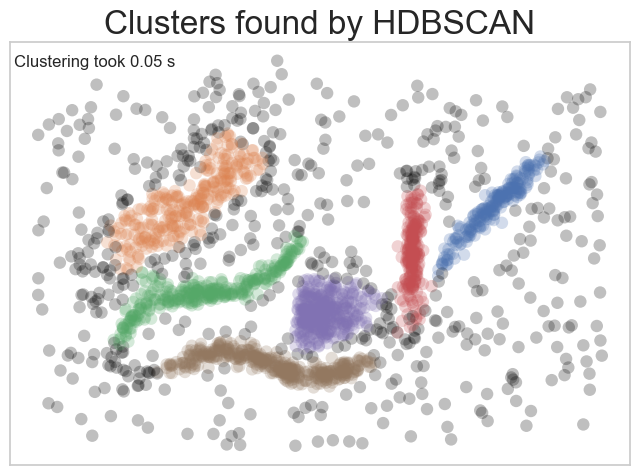

In [173]:
plot_clusters(data, hdbscan.HDBSCAN, (), {'min_cluster_size':11,'cluster_selection_method':'eom', 'min_samples':15, 
                                         'cluster_selection_epsilon':0.0001})


### 6.3 Finding the best alpha parameter

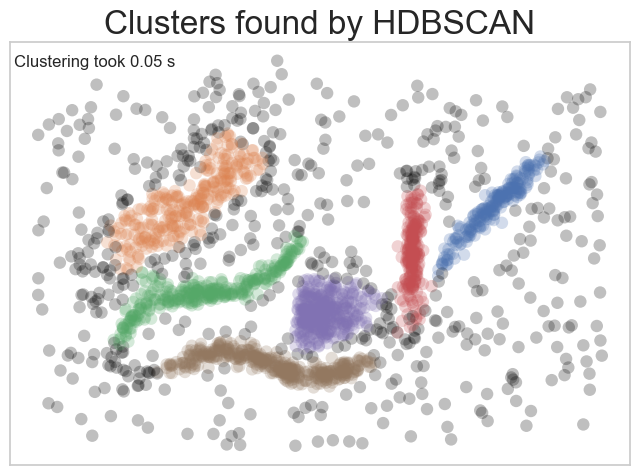

In [174]:
plot_clusters(data, hdbscan.HDBSCAN, (), {'min_cluster_size':11,'cluster_selection_method':'eom', 'min_samples':15, 
                                         'cluster_selection_epsilon':0.01, 'alpha': 1.0})


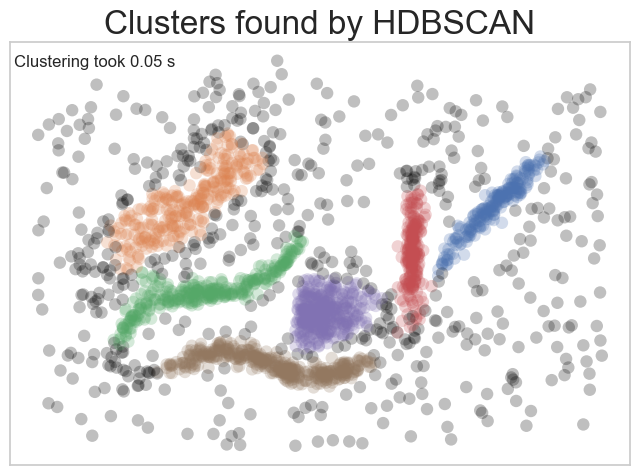

In [175]:
plot_clusters(data, hdbscan.HDBSCAN, (), {'min_cluster_size':11,'cluster_selection_method':'eom', 'min_samples':15, 
                                         'cluster_selection_epsilon':0.01, 'alpha': 1.5})


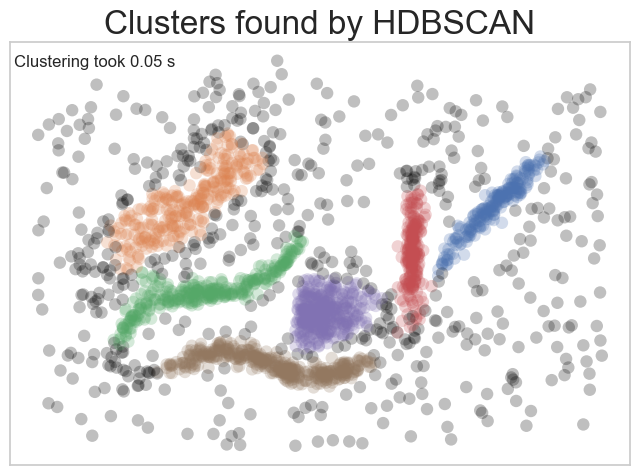

In [176]:
plot_clusters(data, hdbscan.HDBSCAN, (), {'min_cluster_size':11,'cluster_selection_method':'eom', 'min_samples':15, 
                                         'cluster_selection_epsilon':0.01, 'alpha': 3.0})


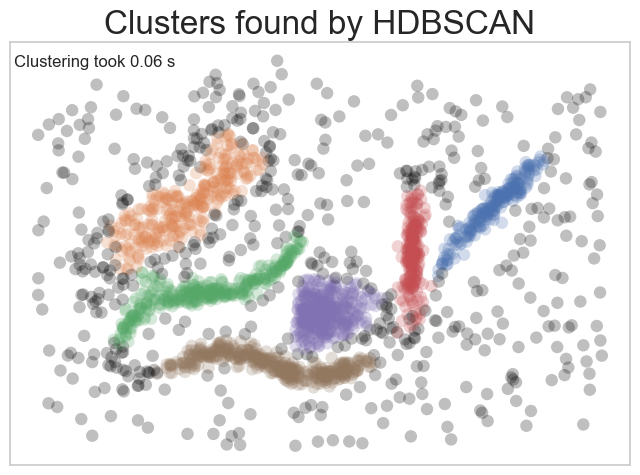

In [177]:
plot_clusters(data, hdbscan.HDBSCAN, (), {'min_cluster_size':11,'cluster_selection_method':'eom', 'min_samples':15, 
                                         'cluster_selection_epsilon':0.01, 'alpha': 10.0})


### 6.4 Final

In [180]:
clusterer = hdbscan.HDBSCAN(min_cluster_size=11, cluster_selection_method="eom", 
                            min_samples=15, cluster_selection_epsilon=0.01, alpha=1.0, allow_single_cluster=False)
clusterer.fit(data)
labels = clusterer.labels_
if -1 in labels:
    # exclude noise points from silhouette score calculation
    silhouette = metrics.silhouette_score(data[labels != -1], labels[labels != -1])
else:
    silhouette = metrics.silhouette_score(data, labels)
silhouette

0.4568955458108354

In [181]:
clusterer = hdbscan.HDBSCAN(min_cluster_size=11, cluster_selection_method="eom", 
                            min_samples=15, cluster_selection_epsilon=0.01, alpha=1.0, allow_single_cluster=False)
clusterer.fit(data)
persistence = clusterer.cluster_persistence_
inertia_score = np.sum(persistence[persistence > 0])
inertia_score

1.2560151989313402

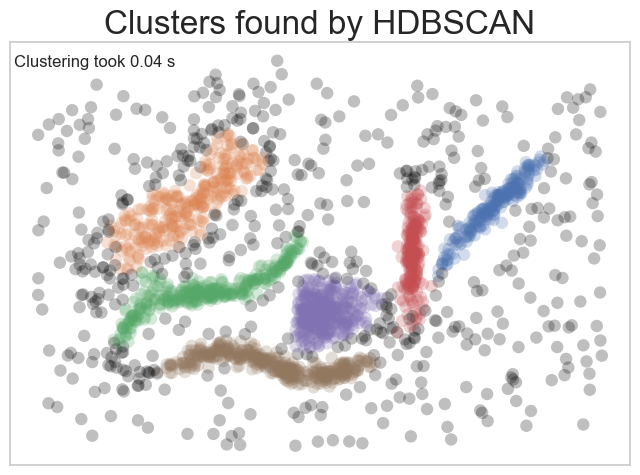

In [178]:
plot_clusters(data, hdbscan.HDBSCAN, (), {'min_cluster_size':11,'cluster_selection_method':'eom', 'min_samples':15, 
                                         'cluster_selection_epsilon':0.01, 'alpha': 1.0, 'allow_single_cluster':False})
